In [1]:
import os
import csv
import optuna
import numpy as np
import pandas as pd
from tensorflow import keras
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Input, Conv1D, MaxPooling1D, LSTM, Dense, Activation, Dropout
from pandas import DataFrame
from pandas import Series
from pandas import concat
from pandas import read_csv
from datetime import datetime
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from math import sqrt
from matplotlib import pyplot as plt
from matplotlib.patches import Patch
from numpy import array
import keras.backend as K
import itertools
#!pip install pydot
    
# date-time parsing function for loading the dataset
def parser(x):
    return datetime.strptime('190'+x, '%Y-%m')
    
def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))
    
def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
    
# convert time series into a supervised learning problem
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
# convert time series into a supervised learning problem
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):

    n_vars = 1 if type(data) is list else data.shape[1]
    cols, names = list(), list()
    df = DataFrame(data)
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
    	cols.append(df.shift(i))
    	names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df[0].shift(-i)) # df[0] for specific humidity
        if i == 0:
            names += [('var%d(t)' % (1))] # % (1) for specific humidity
        else:            
            names += [('var%d(t+%d)' % (1, i))] # % (1) for specific humidity
    
    # put it all together
    agg = concat(cols, axis=1)

    if dropnan:
        #Drop rows containing NaN
        agg.dropna(inplace=True)

    agg.columns = names

    return agg
     
# create a differenced series
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return Series(diff)
     
# transform series into training sets for supervised learning
def prepare_training_data(data, n_lag, n_seq, n_time_steps):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)

    diff_values = []
    
    for ws in range(84):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaler_all_features =  MinMaxScaler(feature_range=(0, 1))
    scaler =  MinMaxScaler(feature_range=(0, 1))
    #diff_values_training = np.array(diff_values_for_training)
    #diff_values_training = diff_values_training.reshape(1, -1) 
    train_scaled_values = scaler_all_features.fit_transform(diff_values)
    response_train_values = []
    for i in range(len(diff_values)):
        response_train_values.append(diff_values[i][0]) # Uses first column (specific_humidity) as response variable
    response_train_values = np.array(response_train_values)
    response_train_values = response_train_values.reshape(len(response_train_values), 1)

    # Fit the scaler for just the response variable for use later when forecasting
    response_scaled_values = scaler.fit_transform(response_train_values) 
    scaled_values = scaler_all_features.transform(diff_values)

    train = []

    # Transform each weather station as a separate "batch"
    for ws in range(84):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        train.append([supervised_values])
    
    return scaler, scaler_all_features, train

# transform series into testing and validation sets for supervised learning
def prepare_testing_and_validation_data(data, n_lag, n_seq, n_time_steps, scaler_all_features):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)

    diff_values = []
    
    for ws in range(21):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaled_values = scaler_all_features.transform(diff_values)

    validation = []
    test = []

    # Transform each weather station as a separate "batch"
    for ws in range(21):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        # training/test/validation split is 80%/10%/10%
        if ws < 11:
            test.append([supervised_values])
        else:
            validation.append([supervised_values])
    
    return validation, test
    
def plot_kfold(cv, X, y, ax, n_splits, xlim_max=105):
    
    #Plots the indices for a cross-validation object.
    #Taken from https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
    #Parameters:
    #cv: Cross-validation object
    #X: Feature set
    #y: Target variable
    #ax: Matplotlib axis object
    #n_splits: Number of folds in the cross-validation
    #xlim_max: Maximum limit for the x-axis
        
    # Set color map for the plot
    cmap_cv = plt.cm.coolwarm
    cv_split = cv.split(X=X, y=y)
        
    for i_split, (train_idx, test_idx) in enumerate(cv_split):
        # Create an array of NaNs and fill in training/testing indices
        indices = np.full(len(X), np.nan)
        indices[test_idx], indices[train_idx] = 1, 0
            
        # Plot the training and testing indices
        ax_x = range(len(indices))
        ax_y = [i_split + 0.5] * len(indices)
        ax.scatter(ax_x, ax_y, c=indices, marker="_", 
                   lw=10, cmap=cmap_cv, vmin=-0.2, vmax=1.2)
    
        # Set y-ticks and labels
        y_ticks = np.arange(n_splits) + 0.5
        ax.set(yticks=y_ticks, yticklabels=range(n_splits),
               xlabel="Weather Station index (file_id)", ylabel="Fold",
               ylim=[n_splits, -0.2], xlim=[0, xlim_max])
    
        # Set plot title and create legend
        ax.set_title("KFold", fontsize=14)
        legend_patches = [Patch(color=cmap_cv(0.8), label="Testing set"), 
                          Patch(color=cmap_cv(0.02), label="Training set")]
        ax.legend(handles=legend_patches, loc=(1.03, 0.8))
    
#Main

#Configure
n_seq = 12
if n_seq > 46:
    n_lag = 179 - n_seq + 46
else:
    n_lag = 179
n_time_steps = 227
n_test = 1

print("Model Parameters:")
print("n_lag (number of input time steps): "+str(n_lag))
print("n_seq (number of output/future prediction time steps): "+str(n_seq))

# Create 2D array with file_ids to use for sample creation
array = np.array([
    6501, 6541, 6640, 6668, 6678, 
    6687, 6697, 6714, 6744, 6772, 
    6783, 6840, 6844, 6854, 6870, 
    6891, 6895, 6899, 6901, 6909, 
    6929, 6950, 6963, 6969, 6994, 
    7032, 7057, 7094, 7095, 7100, 
    7108, 7116, 7119, 7131, 7139, 
    7152, 7155, 7156, 7182, 7193, 
    7202, 7239, 7280, 7286, 7287, 
    7311, 7321, 7329, 7347, 7350, 
    7354, 7357, 7361, 7414, 7423, 
    7424, 7432, 7463, 7482, 7489, 
    7528, 7531, 7534, 7538, 7549, 
    7553, 7555, 7562, 7571, 7573, 
    7574, 7575, 7585, 7599, 7603, 
    7606, 7622, 7652, 7671, 7704, 
    7786, 7805, 7816, 7838, 7861, 
    7862, 7863, 7870, 7892, 7907, 
    7938, 7962, 7979, 7987, 7999, 
    8000, 8034, 8083, 8120, 8133, 
    8184, 8186, 8247, 8248, 9858])
    
#Create arrays holding the 5-fold cross-validation indices gathered for consistency across models
train_array = []
test_array = []
    
train_array.append([1, 2, 3, 5, 6, 7, 8, 9, 11, 13, 14, 15, 16, 17, 19, 20, 21, 22, 
                        23, 24, 25, 27, 28, 29, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 
                        43, 44, 46, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 60, 61, 
                        62, 63, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 81, 
                        82, 83, 84, 85, 86, 87, 88, 90, 91, 92, 93, 95, 97, 98, 100, 101, 102, 103])
test_array.append([0, 4, 10, 12, 18, 26, 30, 31, 33, 45, 47, 53, 64, 65, 77, 80, 89, 94, 96, 99, 104])
    
train_array.append([0, 1, 2, 3, 4, 6, 7, 8, 10, 12, 13, 14, 17, 18, 19, 20, 21, 23, 
                        24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 36, 37, 38, 41, 43, 45, 
                        46, 47, 48, 49, 50, 51, 52, 53, 54, 57, 58, 59, 60, 61, 63, 64, 
                        65, 66, 67, 68, 69, 70, 71, 73, 74, 75, 77, 80, 81, 82, 83, 84, 
                        86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 104])
test_array.append([5, 9, 11, 15, 16, 22, 28, 35, 39, 40, 42, 44, 55, 56, 62, 72, 76, 78, 79, 85, 103])
    
train_array.append([0, 1, 2, 4, 5, 9, 10, 11, 12, 14, 15, 16, 18, 20, 21, 22, 23, 26, 
                    28, 29, 30, 31, 32, 33, 35, 36, 37, 39, 40, 41, 42, 44, 45, 46, 47, 
                    48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 
                    70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 82, 83, 85, 86, 87, 88, 89, 
                    90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104])
test_array.append([3, 6, 7, 8, 13, 17, 19, 24, 25, 27, 34, 38, 43, 49, 66, 67, 68, 69, 73, 81, 84])
    
train_array.append([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 
                        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 
                        35, 37, 38, 39, 40, 42, 43, 44, 45, 47, 49, 51, 52, 53, 55, 56, 
                        60, 62, 64, 65, 66, 67, 68, 69, 71, 72, 73, 74, 76, 77, 78, 79, 
                        80, 81, 82, 84, 85, 86, 87, 88, 89, 92, 93, 94, 95, 96, 99, 102, 103, 104])
test_array.append([32, 36, 41, 46, 48, 50, 54, 57, 58, 59, 61, 63, 70, 75, 83, 90, 91, 97, 98, 100, 101])
    
train_array.append([0, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 22,
                        24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 
                        42, 43, 44, 45, 46, 47, 48, 49, 50, 53, 54, 55, 56, 57, 58, 59, 
                        61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 72, 73, 75, 76, 77, 78, 
                        79, 80, 81, 83, 84, 85, 89, 90, 91, 94, 96, 97, 98, 99, 100, 101, 103, 104])
test_array.append([1, 2, 14, 20, 21, 23, 29, 37, 51, 52, 60, 71, 74, 82, 86, 87, 88, 92, 93, 95, 102])
    
# Equations for three Principal Components from PCA using response variables combined with other predictors
#PC1=-0.0002714X1+0.02612X2+0.03858X3-0.007658X4+0.001592X5-0.02087X6+0.8564X7-0.1468X8+0.01192X9-0.0001049X10+0.01913X11+0.02076X12
#PC2=0.0003944X1+0.002204X2+0.01052X3+0.3248X4-0.0009976X5-0.04421X6+2.3406X7+0.06103X8+0.08841X9+0.00009018X10+0.05678X11-0.002022X12
#PC3=-0.00007998X1-0.0006124X2-0.001063X3-0.01855X4+0.00001956X5+0.01170X6+0.6076X7+0.4664X8-0.002995X9+0.008185X10+0.8815X11-0.0004730X12
    
# Equations for three Principal Components from PCA omitting both response variables,
#PC-1=-0.0004514X1+0.03194X2-0.04343X3+0.002243X4-0.02252X5+0.9877X6-0.2265X7+0.006144X8-0.0001488X9+0.02943X10
#PC-2=0.0001702X1+0.005484X2+0.2057X3-0.0003188X4-0.02584X5+1.6963X6-0.05890X7+0.05809X8+1.9748X9+0.03686X10
#PC-3=-0.00006323X1-0.001180X2-0.02384X3-0.00002833X4+0.01170X5+0.5204X6+0.4791X7-0.004318X8+0.008271X9+0.8765X10
    
# Get the current working directory 
current_directory = os.getcwd() 
    
# Print the current working directory 
print(current_directory)
    
# Define the directory containing the files 
path = current_directory+"\\Modeling\\"
print(path)
    
filename = path + 'Final_Monthly_Dataset.csv'
    
# load dataset
df = read_csv(filename, header=0, parse_dates=[0], index_col=0, date_format='%Y-%m')

# Swap columns 'temperatures' and 'specific_humidity' directly
df['A'] = df['temperatures']
df['temperatures'] = df['specific_humidity']
df['specific_humidity'] = df['A']
df = df.drop(columns=['A'])
# Rename columns
df = df.rename(columns={'temperatures': 'specific_humidity', 'specific_humidity': 'temperatures'})

print(df)
    
df = df.rename(columns={'Unnamed: 0' : 'indices'})
    
#Remove unused columns
df = df.drop(['Day', 'vapor_pressure'], axis=1)
    
# Round numbers in columns to reasonable precision,
df['temperatures'] = np.round(df['temperatures'], 2)
df['slp'] = np.round(df['slp'], 2)
df['wet_bulb_temperature'] = np.round(df['wet_bulb_temperature'], 2)
df['specific_humidity'] = np.round(df['specific_humidity'], 2)
df['GHI'] = np.round(df['GHI'], 2)
df['PRCP'] = np.round(df['PRCP'], 2)
df['SNDP'] = np.round(df['SNDP'], 2)
df['solar_activity'] = np.round(df['solar_activity'], 2)
df['ONI'] = np.round(df['ONI'], 2)
df['water'] = np.round(df['water'], 0)
df['region'] = np.round(df['region'], 0)

#Since the NaN values of GHI are gone which is used in data preparation, simulate these in solar activity instead
df['solar_activity'].loc[df['Year'] > 2020] = np.nan
    
df_trimmed = df[df['file_id'] != 7533] # Remove file_id 7533 so there are 105 weather stations for 5-fold CV
df_trimmed = df_trimmed.drop(['Year', 'Month', 'date', 'latitude', 'longitude', 'elevation'], axis=1)

#Test model and accuracy when solar activity is removed as a predictor
df_trimmed = df_trimmed.drop(['GHI'], axis=1)

n_vars = df_trimmed.shape[1]-1

X = []
y = []
    
for i in array:
    add_to_X = [] # create list to store each column to add to X
    new_df = df_trimmed[df_trimmed['file_id'] == i].drop(['file_id'], axis=1)
    add_to_y = []
    for j in range(new_df.shape[0]):
        add_to_y.append(new_df['specific_humidity'].iloc[j])
    y.append(add_to_y)
    columns_list = new_df.columns.tolist()
    for j in range(new_df.shape[0]):
        l=0
        new_row = []
        for m in columns_list:
            new_row.append(new_df.iloc[j, l])
            l += 1
        add_to_X.append(new_row)
    X.append(add_to_X)
    
#Perform k-fold cross-validation
#Taken from: https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
#k = 5  # Number of folds
#kf = KFold(n_splits=k, shuffle=True, random_state=42)
    
#for i, (train_index, test_index) in enumerate(kf.split(X)):
#    print(f"Fold {i}:")
#    print(f"  Training dataset index: {train_index}")
#    print(f"  Test dataset index: {test_index}")
    
#for train_indices, test_indices in kf.split(X):
#    print('Train: %s | test: %s' % (train_indices, test_indices))
    
# Create figure and axis
#fig, ax = plt.subplots(figsize=(6, 3))
#plot_kfold(kf, X, y, ax, k)
#plt.tight_layout()
#fig.subplots_adjust(right=0.6)
    
#Create train and test sets for each cross-validation split
train_X = []
train_y = []
val_X = []
val_y = []
for i in range(5):
    print(f"Fold {i+1}")
    #Add each corresponding sample for each entry of train index 
    train_X_rows = [] # Stores all the samples for one fold of train_X
    train_y_rows = [] # Stores all the samples for one fold of train_y
    for j in train_array[i]:
        train_X_rows.append(X[j])
        train_y_rows.append(y[j])
    # Stores one fold of train dataset
    train_X.append(train_X_rows)
    train_y.append(train_y_rows)
    #Add each corresponding sample for each entry of the validation index 
    val_X_rows = [] # Stores all the samples for one fold of val_X
    val_y_rows = [] # Stores all the samples for one fold of val_y
    for j in test_array[i]: 
            val_X_rows.append(X[j])
            val_y_rows.append(y[j])
    # Stores one fold of validation dataset
    val_X.append(val_X_rows)
    val_y.append(val_y_rows) 
    
#Convert 3D arrays to DataFrames
df_X = []
df_y = []
val_df_X = []
val_df_y = []
dataset = []
dataset_test = []
scaler = []
scaler_all_features = []
train = []
test = []
validation = []

for i in range(5):
    dataset_scaling = [] # Holds all 84 weather station rows to train the scaling function
    dataset_testing = [] # Holds remaining 21 weather station rows for testing and validation
    print("Fold "+str(i+1)+":")
    #Transform train_X to the correct format
    df1 = []
    dataset_df = [] # captures each weather station's dataset as values for training scaler mapping
    df_X.append(pd.DataFrame(train_X[i]))
    X_t = df_X[i].transpose()
    for k in range(84):
        X = np.array(X_t.iloc[:, k])
        df = pd.DataFrame()
        for j in range(n_time_steps):
            new_row = pd.DataFrame(X[j]).transpose()
            new_row.columns = new_df.columns
            # Add the new row
            df = pd.concat([df, new_row], ignore_index=True)
        df.columns = new_df.columns
        df1.append(df)
        dataset_df.append(df.values)
        dataset_scaling.append(df.values)
    df_X[i] = df1
    dataset.append(dataset_df)
    
    #Transform train_y to the correct format
    df2 = []
    df_y.append(pd.DataFrame(train_y[i]))
    y_t = df_y[i].transpose()
    
    for j in range(84):
        y = np.array(y_t.iloc[:, j])
        y = pd.DataFrame(y)
        y.columns = ['specific_humidity']
        df2.append(y)
    df_y[i] = df2

    #Transform val_X to the correct format
    df3 = []
    dataset_vl_df = [] # captures each weather station's dataset as values for training scaler mapping
    val_df_X.append(pd.DataFrame(val_X[i]))
    val_X_t = val_df_X[i].transpose()
    for k in range(21):
        vl_X = np.array(val_X_t.iloc[:, k])
        vl_df = pd.DataFrame()
        for j in range(n_time_steps):
            new1_row = pd.DataFrame(vl_X[j]).transpose()
            new1_row.columns = new_df.columns
            # Add the new row
            vl_df = pd.concat([vl_df, new1_row], ignore_index=True)
        vl_df.columns = new_df.columns
        df3.append(vl_df)
        dataset_vl_df.append(vl_df.values)
        dataset_testing.append(vl_df.values)
    val_df_X[i] = df3
    dataset_test.append(dataset_vl_df) 

    #Transform val_y to the correct format
    df4 = []
    val_df_y.append(pd.DataFrame(train_y[i]))
    val_y_t = val_df_y[i].transpose()
    
    for j in range(21):
        v_y = np.array(val_y_t.iloc[:, j])
        v_y = pd.DataFrame(v_y)
        v_y.columns = ['specific_humidity']
        df4.append(v_y)
    val_df_y[i] = df4
    
    scaler.append(MinMaxScaler(feature_range=(0, 1)))
    scaler_all_features.append(MinMaxScaler(feature_range=(0, 1)))
    train.append([1])
    test.append([1])
    validation.append([1])
    
    # prepare data
    scaler[i], scaler_all_features[i], train[i] = prepare_training_data(dataset_scaling, n_lag, n_seq, n_time_steps)

    validation[i], test[i] = prepare_testing_and_validation_data(dataset_testing, n_lag, n_seq, n_time_steps, scaler_all_features[i])

    #Reshape dimensionality
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]
    print(np.array(train1).shape)
    print(np.array(test1).shape)
    print(np.array(validation1).shape)
    train2 = []
    test2 = []
    validation2 = []

    for k in range(84):
        train2.append(train1[k][0])
        
    for k in range(11):
        test2.append(test1[k][0])

    for k in range(10):
        validation2.append(validation1[k][0])

    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2

    #Reshape dimensionality (again)
    dim_size = n_seq + n_vars*n_lag
    train1 = np.array(train[i]).reshape(84, dim_size)
    test1 = np.array(test[i]).reshape(11, dim_size)
    validation1 = np.array(validation[i]).reshape(10, dim_size)
    train2 = pd.DataFrame(train1).values
    test2 = pd.DataFrame(test1).values
    validation2 = pd.DataFrame(validation1).values
    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    print(train2)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2
    
print("Finished")

Model Parameters:
n_lag (number of input time steps): 179
n_seq (number of output/future prediction time steps): 12
C:\Users\User
C:\Users\User\Modeling\
             date  file_id  specific_humidity          slp  vapor_pressure  \
0      2006-01-31     6501           5.386935  1018.534543        8.674922   
1      2006-02-28     6501           4.299929  1021.230347        6.942276   
2      2006-03-31     6501           6.505135  1018.968548       10.468176   
3      2006-04-30     6501          10.211263  1014.686944       16.358802   
4      2006-05-31     6501          11.737971  1014.236828       18.798749   
...           ...      ...                ...          ...             ...   
24057  2024-07-31     9858          15.211417  1013.969355       23.769169   
24058  2024-08-31     9858          15.149811  1015.112097       23.699154   
24059  2024-09-30     9858          10.720199  1014.393750       16.790240   
24060  2024-10-31     9858           6.989922  1018.230376       1

C:\Users\User\AppData\Local\Temp\ipykernel_610456\3895282580.py:383: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['solar_activity'].loc[df['Year'] > 2020] = np.nan


Fold 1
Fold 2
Fold 3
Fold 4
Fold 5
Fold 1:
(84, 1, 1, 1981)
(11, 1, 1, 1981)
(10, 1, 1, 1981)
(84, 1, 1981)
(11, 1, 1981)
(10, 1, 1981)
(84, 1981)
(11, 1981)
(10, 1981)
[[0.42725031 0.69695044 0.32924264 ... 0.29408138 0.24969174 0.48890259]
 [0.45745993 0.51683609 0.42215989 ... 0.32182491 0.21454994 0.60912454]
 [0.43218249 0.62674714 0.3411641  ... 0.35080148 0.18187423 0.64981504]
 ...
 [0.47102343 0.46473952 0.46949509 ... 0.3027127  0.42108508 0.52034525]
 [0.43464858 0.51620076 0.3997195  ... 0.34648582 0.19358816 0.61713933]
 [0.44389642 0.52414231 0.42356241 ... 0.45992602 0.19173859 0.54623921]]
Fold 2:
(84, 1, 1, 1981)
(11, 1, 1, 1981)
(10, 1, 1, 1981)
(84, 1, 1981)
(11, 1, 1981)
(10, 1, 1981)
(84, 1981)
(11, 1981)
(10, 1981)
[[0.43464858 0.62313675 0.34639831 ... 0.3674476  0.17509248 0.67324291]
 [0.42725031 0.71548931 0.32450565 ... 0.29408138 0.24969174 0.48890259]
 [0.45745993 0.53175632 0.4180791  ... 0.32182491 0.21454994 0.60912454]
 ...
 [0.47102343 0.47861309 0.465

In [2]:
print(n_seq)
print(n_lag)
print(np.array(train[1]).shape)
print(np.array(test[1]).shape)

12
179
(84, 1981)
(11, 1981)


[I 2025-05-26 15:09:11,529] A new study created in memory with name: no-name-fe2aeb43-112b-48ff-82df-858a99a614e1
[I 2025-05-26 15:13:29,670] Trial 0 finished with value: 0.08227999061346054 and parameters: {'lr': 0.0011882265602539748, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.30238426736721324}. Best is trial 0 with value: 0.08227999061346054.


Cross Validation Accuracies:
[0.06049738824367523, 0.07989638298749924, 0.08463381230831146, 0.11099562048912048, 0.07537674903869629]
Mean Cross Validation Accuracy:
0.08227999061346054
Standard Deviation of Cross Validation Accuracy:
0.016479963417928546


[I 2025-05-26 15:19:19,054] Trial 1 finished with value: 0.08271197229623795 and parameters: {'lr': 0.10118917719514035, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.3183061625635297}. Best is trial 0 with value: 0.08227999061346054.


Cross Validation Accuracies:
[0.07393945008516312, 0.08462107181549072, 0.09225035458803177, 0.09257183223962784, 0.07017715275287628]
Mean Cross Validation Accuracy:
0.08271197229623795
Standard Deviation of Cross Validation Accuracy:
0.00922952959527759


[I 2025-05-26 15:22:39,226] Trial 2 finished with value: 0.068007180839777 and parameters: {'lr': 0.03940608067613081, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4469230462824716}. Best is trial 2 with value: 0.068007180839777.


Cross Validation Accuracies:
[0.05889960750937462, 0.0742797926068306, 0.07769347727298737, 0.07527516037225723, 0.05388786643743515]
Mean Cross Validation Accuracy:
0.068007180839777
Standard Deviation of Cross Validation Accuracy:
0.009677773035338134


[I 2025-05-26 15:29:21,063] Trial 3 finished with value: 0.17686375379562377 and parameters: {'lr': 0.0026924210120440966, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.3927191824225379}. Best is trial 2 with value: 0.068007180839777.


Cross Validation Accuracies:
[0.16320134699344635, 0.18173596262931824, 0.18813282251358032, 0.18539738655090332, 0.16585125029087067]
Mean Cross Validation Accuracy:
0.17686375379562377
Standard Deviation of Cross Validation Accuracy:
0.010310090297970436


[I 2025-05-26 15:34:59,309] Trial 4 finished with value: 3.1532577514648437 and parameters: {'lr': 0.25770840338996315, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.37661007060821117}. Best is trial 2 with value: 0.068007180839777.


Cross Validation Accuracies:
[2.8261547088623047, 2.0248773097991943, 5.0649847984313965, 2.395569324493408, 3.454702615737915]
Mean Cross Validation Accuracy:
3.1532577514648437
Standard Deviation of Cross Validation Accuracy:
1.067698448278344


[I 2025-05-26 15:40:47,135] Trial 5 finished with value: 0.06413656547665596 and parameters: {'lr': 0.003735585953510545, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.2855313117004779}. Best is trial 5 with value: 0.06413656547665596.


Cross Validation Accuracies:
[0.057743560522794724, 0.05815640836954117, 0.07319282740354538, 0.07689611613750458, 0.05469391494989395]
Mean Cross Validation Accuracy:
0.06413656547665596
Standard Deviation of Cross Validation Accuracy:
0.009062212240856179


[I 2025-05-26 15:46:21,925] Trial 6 finished with value: 1.8937596797943115 and parameters: {'lr': 0.11675514090441955, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.19203496173746087}. Best is trial 5 with value: 0.06413656547665596.


Cross Validation Accuracies:
[1.8329987525939941, 1.6349848508834839, 1.7488524913787842, 1.7396689653396606, 2.5122933387756348]
Mean Cross Validation Accuracy:
1.8937596797943115
Standard Deviation of Cross Validation Accuracy:
0.3155890464450667


[I 2025-05-26 15:52:16,370] Trial 7 finished with value: 0.06424132585525513 and parameters: {'lr': 0.07616209876851336, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 256, 'dropout_rate': 0.13763768025963846}. Best is trial 5 with value: 0.06413656547665596.


Cross Validation Accuracies:
[0.05844726413488388, 0.056866344064474106, 0.07286375015974045, 0.07935363054275513, 0.05367564037442207]
Mean Cross Validation Accuracy:
0.06424132585525513
Standard Deviation of Cross Validation Accuracy:
0.0100232047885706


[I 2025-05-26 15:57:43,736] Trial 8 finished with value: 0.06294947788119316 and parameters: {'lr': 0.024634139754522975, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.137849288285992}. Best is trial 8 with value: 0.06294947788119316.


Cross Validation Accuracies:
[0.056148234754800797, 0.05697746202349663, 0.07225122302770615, 0.07679145783185959, 0.052579011768102646]
Mean Cross Validation Accuracy:
0.06294947788119316
Standard Deviation of Cross Validation Accuracy:
0.009670484171921965


[I 2025-05-26 16:02:02,273] Trial 9 finished with value: 0.061537265032529834 and parameters: {'lr': 0.04585859625334806, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.18310723066862433}. Best is trial 9 with value: 0.061537265032529834.


Cross Validation Accuracies:
[0.05547894537448883, 0.05648919194936752, 0.07150417566299438, 0.07445778697729111, 0.04975622519850731]
Mean Cross Validation Accuracy:
0.061537265032529834
Standard Deviation of Cross Validation Accuracy:
0.009667040636549577


[I 2025-05-26 16:05:01,006] Trial 10 finished with value: 0.0713481180369854 and parameters: {'lr': 0.8061680477477647, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.22323588954500959}. Best is trial 9 with value: 0.061537265032529834.


Cross Validation Accuracies:
[0.07249409705400467, 0.070560023188591, 0.07872603088617325, 0.07594670355319977, 0.0590137355029583]
Mean Cross Validation Accuracy:
0.0713481180369854
Standard Deviation of Cross Validation Accuracy:
0.006777196185051378


[I 2025-05-26 16:10:05,772] Trial 11 finished with value: 0.06270964741706848 and parameters: {'lr': 0.013167003750962072, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.11125778032537573}. Best is trial 9 with value: 0.061537265032529834.


Cross Validation Accuracies:
[0.05548998340964317, 0.056937262415885925, 0.0719987154006958, 0.07677735388278961, 0.052344921976327896]
Mean Cross Validation Accuracy:
0.06270964741706848
Standard Deviation of Cross Validation Accuracy:
0.009767892911514408


[I 2025-05-26 16:14:57,816] Trial 12 finished with value: 0.06266854107379913 and parameters: {'lr': 0.013474063129394382, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.20567904843020568}. Best is trial 9 with value: 0.061537265032529834.


Cross Validation Accuracies:
[0.05504686012864113, 0.057396985590457916, 0.07214923948049545, 0.07667948305606842, 0.05207013711333275]
Mean Cross Validation Accuracy:
0.06266854107379913
Standard Deviation of Cross Validation Accuracy:
0.009842719356582399


[I 2025-05-26 16:18:11,323] Trial 13 finished with value: 0.0625503271818161 and parameters: {'lr': 0.010851594734802069, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.21564767924521006}. Best is trial 9 with value: 0.061537265032529834.


Cross Validation Accuracies:
[0.05502527579665184, 0.05703829228878021, 0.07219414412975311, 0.07675709575414658, 0.051736827939748764]
Mean Cross Validation Accuracy:
0.0625503271818161
Standard Deviation of Cross Validation Accuracy:
0.009987754216666254


[I 2025-05-26 16:21:29,446] Trial 14 finished with value: 0.06290225461125373 and parameters: {'lr': 0.00714630392441038, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.24295023809872954}. Best is trial 9 with value: 0.061537265032529834.


Cross Validation Accuracies:
[0.055351413786411285, 0.057239506393671036, 0.07217587530612946, 0.07707952708005905, 0.052664950489997864]
Mean Cross Validation Accuracy:
0.06290225461125373
Standard Deviation of Cross Validation Accuracy:
0.009806930260342411


[I 2025-05-26 16:24:32,121] Trial 15 finished with value: 0.06071912497282028 and parameters: {'lr': 0.03459608481259901, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.17411365949314075}. Best is trial 15 with value: 0.06071912497282028.


Cross Validation Accuracies:
[0.052114807069301605, 0.056734081357717514, 0.07066870480775833, 0.07370128482580185, 0.05037674680352211]
Mean Cross Validation Accuracy:
0.06071912497282028
Standard Deviation of Cross Validation Accuracy:
0.00963753348877223


[I 2025-05-26 16:27:56,956] Trial 16 finished with value: 2.0270612955093386 and parameters: {'lr': 0.3044107331553391, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.16940146412386678}. Best is trial 15 with value: 0.06071912497282028.


Cross Validation Accuracies:
[2.0622334480285645, 3.1248703002929688, 1.074133276939392, 1.9941788911819458, 1.8798905611038208]
Mean Cross Validation Accuracy:
2.0270612955093386
Standard Deviation of Cross Validation Accuracy:
0.6537941537597769


[I 2025-05-26 16:30:50,071] Trial 17 finished with value: 0.06219499334692955 and parameters: {'lr': 0.03597889813678426, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.26462577517188673}. Best is trial 15 with value: 0.06071912497282028.


Cross Validation Accuracies:
[0.05771156772971153, 0.05536079406738281, 0.07137998193502426, 0.07519102096557617, 0.05133160203695297]
Mean Cross Validation Accuracy:
0.06219499334692955
Standard Deviation of Cross Validation Accuracy:
0.009360356884642962


[I 2025-05-26 16:34:13,289] Trial 18 finished with value: 0.06935374811291695 and parameters: {'lr': 0.2234046961105736, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.16249880651689105}. Best is trial 15 with value: 0.06071912497282028.


Cross Validation Accuracies:
[0.05425937473773956, 0.052763018757104874, 0.0829690620303154, 0.07938148826360703, 0.07739579677581787]
Mean Cross Validation Accuracy:
0.06935374811291695
Standard Deviation of Cross Validation Accuracy:
0.013066746346681722


[I 2025-05-26 16:37:27,968] Trial 19 finished with value: 0.06237567067146301 and parameters: {'lr': 0.05406117218467148, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.10565254584016687}. Best is trial 15 with value: 0.06071912497282028.


Cross Validation Accuracies:
[0.06308749318122864, 0.05457436665892601, 0.07126294076442719, 0.07086723297834396, 0.05208631977438927]
Mean Cross Validation Accuracy:
0.06237567067146301
Standard Deviation of Cross Validation Accuracy:
0.007979072346851907


[I 2025-05-26 16:40:47,298] Trial 20 finished with value: 0.16991284787654876 and parameters: {'lr': 0.0247003225963147, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.344404144490258}. Best is trial 15 with value: 0.06071912497282028.


Cross Validation Accuracies:
[0.17442452907562256, 0.1991528868675232, 0.12139804661273956, 0.21173137426376343, 0.1428574025630951]
Mean Cross Validation Accuracy:
0.16991284787654876
Standard Deviation of Cross Validation Accuracy:
0.03379292044026421


[I 2025-05-26 16:43:53,047] Trial 21 finished with value: 0.061204655468463896 and parameters: {'lr': 0.029628926193779243, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.24781941582334052}. Best is trial 15 with value: 0.06071912497282028.


Cross Validation Accuracies:
[0.05040512979030609, 0.05739549174904823, 0.07132591307163239, 0.07524546980857849, 0.05165127292275429]
Mean Cross Validation Accuracy:
0.061204655468463896
Standard Deviation of Cross Validation Accuracy:
0.010217542992152613


[I 2025-05-26 16:47:00,890] Trial 22 finished with value: 0.06191219091415405 and parameters: {'lr': 0.024628225076808796, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.266096285717595}. Best is trial 15 with value: 0.06071912497282028.


Cross Validation Accuracies:
[0.05448668822646141, 0.05716078355908394, 0.07164231687784195, 0.07489302009344101, 0.051378145813941956]
Mean Cross Validation Accuracy:
0.06191219091415405
Standard Deviation of Cross Validation Accuracy:
0.009506390962327485


[I 2025-05-26 16:50:16,891] Trial 23 finished with value: 0.05811621323227882 and parameters: {'lr': 0.12979507641643676, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.17343799773232224}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.044054679572582245, 0.05303318798542023, 0.07082816958427429, 0.07149753719568253, 0.05116749182343483]
Mean Cross Validation Accuracy:
0.05811621323227882
Standard Deviation of Cross Validation Accuracy:
0.011067992311610165


[I 2025-05-26 16:53:38,024] Trial 24 finished with value: 0.06897801384329796 and parameters: {'lr': 0.15393127984758084, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.24118855549705823}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.08128763735294342, 0.05170498788356781, 0.08247468620538712, 0.07915930449962616, 0.050263453274965286]
Mean Cross Validation Accuracy:
0.06897801384329796
Standard Deviation of Cross Validation Accuracy:
0.01473728522013968


[I 2025-05-26 16:56:43,181] Trial 25 finished with value: 0.06938901394605637 and parameters: {'lr': 0.4881341155861379, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.1673766965067008}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.0514301061630249, 0.07570435106754303, 0.08206441253423691, 0.07528489828109741, 0.06246130168437958]
Mean Cross Validation Accuracy:
0.06938901394605637
Standard Deviation of Cross Validation Accuracy:
0.011007508622385668


[I 2025-05-26 16:59:57,851] Trial 26 finished with value: 0.05948879346251488 and parameters: {'lr': 0.06735150682136114, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.14059020121491522}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.04798636585474014, 0.055731453001499176, 0.07039260119199753, 0.07462980598211288, 0.048703741282224655]
Mean Cross Validation Accuracy:
0.05948879346251488
Standard Deviation of Cross Validation Accuracy:
0.011053362220282262


[I 2025-05-26 17:02:54,677] Trial 27 finished with value: 0.05881051570177078 and parameters: {'lr': 0.08044096348249653, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.14925313024259637}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.04374700039625168, 0.05782598629593849, 0.06930990517139435, 0.07109120488166809, 0.0520784817636013]
Mean Cross Validation Accuracy:
0.05881051570177078
Standard Deviation of Cross Validation Accuracy:
0.010336842636156474


[I 2025-05-26 17:06:45,583] Trial 28 finished with value: 0.4977535277605057 and parameters: {'lr': 0.1615416552282642, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.1415711831191119}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.23764826357364655, 0.40735670924186707, 0.4886963665485382, 0.5732749700546265, 0.7817913293838501]
Mean Cross Validation Accuracy:
0.4977535277605057
Standard Deviation of Cross Validation Accuracy:
0.1801606651977249


[I 2025-05-26 17:09:42,463] Trial 29 finished with value: 0.06030073314905167 and parameters: {'lr': 0.07227449267735182, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.49375231790477875}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.051826801151037216, 0.052321527153253555, 0.06991858780384064, 0.07350371032953262, 0.0539330393075943]
Mean Cross Validation Accuracy:
0.06030073314905167
Standard Deviation of Cross Validation Accuracy:
0.009411105262165912


[I 2025-05-26 17:13:29,376] Trial 30 finished with value: 4.655995273590088 and parameters: {'lr': 0.3913753046042941, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.10743222543152886}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[3.9923903942108154, 3.009589195251465, 5.756595134735107, 7.2112932205200195, 3.3101084232330322]
Mean Cross Validation Accuracy:
4.655995273590088
Standard Deviation of Cross Validation Accuracy:
1.5939450101322277


[I 2025-05-26 17:16:47,949] Trial 31 finished with value: 0.06105686500668526 and parameters: {'lr': 0.07263634045799101, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.4967172549983988}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.05648554861545563, 0.05632972717285156, 0.070313960313797, 0.0739268884062767, 0.048228200525045395]
Mean Cross Validation Accuracy:
0.06105686500668526
Standard Deviation of Cross Validation Accuracy:
0.009582783665117943


[I 2025-05-26 17:20:19,130] Trial 32 finished with value: 0.0627366103231907 and parameters: {'lr': 0.0967256657230718, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.49569234255391204}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.06536507606506348, 0.058259524405002594, 0.06760703027248383, 0.0716143250465393, 0.05083709582686424]
Mean Cross Validation Accuracy:
0.0627366103231907
Standard Deviation of Cross Validation Accuracy:
0.007363238213109143


[I 2025-05-26 17:23:47,939] Trial 33 finished with value: 0.06197611764073372 and parameters: {'lr': 0.06408489132231038, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.44000763117269553}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.055648401379585266, 0.058258023113012314, 0.07065867632627487, 0.07513616979122162, 0.050179317593574524]
Mean Cross Validation Accuracy:
0.06197611764073372
Standard Deviation of Cross Validation Accuracy:
0.009397898800080334


[I 2025-05-26 17:27:00,607] Trial 34 finished with value: 0.0726013220846653 and parameters: {'lr': 0.174232013578395, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.344594210811662}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.08302886039018631, 0.061341967433691025, 0.07676205039024353, 0.08370384573936462, 0.058169886469841]
Mean Cross Validation Accuracy:
0.0726013220846653
Standard Deviation of Cross Validation Accuracy:
0.010810648895513544


[I 2025-05-26 17:32:59,659] Trial 35 finished with value: 10.21094446182251 and parameters: {'lr': 0.10392902653983796, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.42478717893192747}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[11.166047096252441, 10.592427253723145, 10.384117126464844, 11.206430435180664, 7.705700397491455]
Mean Cross Validation Accuracy:
10.21094446182251
Standard Deviation of Cross Validation Accuracy:
1.2926700336597456


[I 2025-05-26 17:36:10,661] Trial 36 finished with value: 0.06342884823679924 and parameters: {'lr': 0.0011278067367316113, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.3069392859457613}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.05624786391854286, 0.0576435886323452, 0.0726076066493988, 0.077066570520401, 0.053578611463308334]
Mean Cross Validation Accuracy:
0.06342884823679924
Standard Deviation of Cross Validation Accuracy:
0.009511046252072582


[I 2025-05-26 17:40:19,246] Trial 37 finished with value: 11.124198913574219 and parameters: {'lr': 0.1133849961820081, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 512, 'dropout_rate': 0.14529451518361886}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[11.666977882385254, 11.663253784179688, 11.23898696899414, 8.996665000915527, 12.055110931396484]
Mean Cross Validation Accuracy:
11.124198913574219
Standard Deviation of Cross Validation Accuracy:
1.094656402220611


[I 2025-05-26 17:43:41,544] Trial 38 finished with value: 0.08290579020977021 and parameters: {'lr': 0.7509438693403955, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.3940257711349293}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.08619173616170883, 0.0773887038230896, 0.08156466484069824, 0.08080935478210449, 0.08857449144124985]
Mean Cross Validation Accuracy:
0.08290579020977021
Standard Deviation of Cross Validation Accuracy:
0.003989072960146943


[I 2025-05-26 17:47:08,050] Trial 39 finished with value: 0.06145942732691765 and parameters: {'lr': 0.05558889957763009, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.466707143856828}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.05527840554714203, 0.05671173334121704, 0.06904793530702591, 0.0771033838391304, 0.04915567860007286]
Mean Cross Validation Accuracy:
0.06145942732691765
Standard Deviation of Cross Validation Accuracy:
0.010143438173296307


[I 2025-05-26 17:52:41,824] Trial 40 finished with value: 0.07735198885202407 and parameters: {'lr': 0.2080840025802678, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.13075848582315475}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.0639173611998558, 0.07581472396850586, 0.07812453806400299, 0.0998396947979927, 0.06906362622976303]
Mean Cross Validation Accuracy:
0.07735198885202407
Standard Deviation of Cross Validation Accuracy:
0.012311320883072447


[I 2025-05-26 17:55:50,752] Trial 41 finished with value: 0.06244703009724617 and parameters: {'lr': 0.018188380697145293, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.19196675852043724}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.05494793877005577, 0.0573606975376606, 0.07151444256305695, 0.07651901245117188, 0.05189305916428566]
Mean Cross Validation Accuracy:
0.06244703009724617
Standard Deviation of Cross Validation Accuracy:
0.009733777358131374


[I 2025-05-26 17:59:31,050] Trial 42 finished with value: 0.06224192008376121 and parameters: {'lr': 0.03700039344283854, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.15793074403907398}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.056067124009132385, 0.05611375719308853, 0.0714152529835701, 0.07621557265520096, 0.0513978935778141]
Mean Cross Validation Accuracy:
0.06224192008376121
Standard Deviation of Cross Validation Accuracy:
0.009723048909859228


[I 2025-05-26 18:03:35,209] Trial 43 finished with value: 0.061635684221982956 and parameters: {'lr': 0.07544901152693628, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.12539824015818035}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.058474067598581314, 0.055003128945827484, 0.07401242107152939, 0.0711786225438118, 0.049510180950164795]
Mean Cross Validation Accuracy:
0.061635684221982956
Standard Deviation of Cross Validation Accuracy:
0.009436797397598937


[I 2025-05-26 18:06:48,133] Trial 44 finished with value: 0.06613253951072692 and parameters: {'lr': 0.123442706957457, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.18266003676011783}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.07111379504203796, 0.058087561279535294, 0.07138996571302414, 0.07429210096597672, 0.05577927455306053]
Mean Cross Validation Accuracy:
0.06613253951072692
Standard Deviation of Cross Validation Accuracy:
0.007628153775413896


[I 2025-05-26 18:11:03,179] Trial 45 finished with value: 0.06910652443766593 and parameters: {'lr': 0.043495788080844054, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.12202046601742626}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.06187682971358299, 0.06693331152200699, 0.07312069833278656, 0.07580056041479111, 0.06780122220516205]
Mean Cross Validation Accuracy:
0.06910652443766593
Standard Deviation of Cross Validation Accuracy:
0.00489119338856507


[I 2025-05-26 18:15:48,311] Trial 46 finished with value: 0.06285188049077987 and parameters: {'lr': 0.005286684306694774, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.20091209565608475}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.05583963543176651, 0.0569363497197628, 0.07202016562223434, 0.07744314521551132, 0.052020106464624405]
Mean Cross Validation Accuracy:
0.06285188049077987
Standard Deviation of Cross Validation Accuracy:
0.009984536765849929


[I 2025-05-26 18:19:32,576] Trial 47 finished with value: 0.13007182031869888 and parameters: {'lr': 0.0023492978706959886, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.22259309374862554}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.10442740470170975, 0.11984506249427795, 0.1501796692609787, 0.12813395261764526, 0.14777301251888275]
Mean Cross Validation Accuracy:
0.13007182031869888
Standard Deviation of Cross Validation Accuracy:
0.017225769959896782


[I 2025-05-26 18:24:12,332] Trial 48 finished with value: 0.061016636341810225 and parameters: {'lr': 0.01806327491417542, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.15158035879356155}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.05250262841582298, 0.05640546977519989, 0.07082170993089676, 0.07390772551298141, 0.051445648074150085]
Mean Cross Validation Accuracy:
0.061016636341810225
Standard Deviation of Cross Validation Accuracy:
0.009462289919411431


[I 2025-05-26 18:27:38,882] Trial 49 finished with value: 0.06580178588628768 and parameters: {'lr': 0.08057742796614482, 'optimizer': 'Adam', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.17906816001212317}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.05950995534658432, 0.061627015471458435, 0.07492730766534805, 0.07918217778205872, 0.05376247316598892]
Mean Cross Validation Accuracy:
0.06580178588628768
Standard Deviation of Cross Validation Accuracy:
0.009636087643421944


[I 2025-05-26 18:31:52,874] Trial 50 finished with value: 0.06222652420401573 and parameters: {'lr': 0.053218810149317834, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.3307606937952239}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.06038902699947357, 0.055528804659843445, 0.06954332441091537, 0.07636155188083649, 0.04930991306900978]
Mean Cross Validation Accuracy:
0.06222652420401573
Standard Deviation of Cross Validation Accuracy:
0.009678938567572612


[I 2025-05-26 18:37:04,581] Trial 51 finished with value: 0.061098833382129666 and parameters: {'lr': 0.019872449910068507, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.14862873532903786}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.05232122913002968, 0.05461827293038368, 0.07118111848831177, 0.0753900483250618, 0.05198349803686142]
Mean Cross Validation Accuracy:
0.061098833382129666
Standard Deviation of Cross Validation Accuracy:
0.010079926945562081


[I 2025-05-26 18:41:59,784] Trial 52 finished with value: 0.062301339209079744 and parameters: {'lr': 0.009974042920702171, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.15754058391941683}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.05531112849712372, 0.056436505168676376, 0.07183295488357544, 0.07662229984998703, 0.05130380764603615]
Mean Cross Validation Accuracy:
0.062301339209079744
Standard Deviation of Cross Validation Accuracy:
0.010001466248944367


[I 2025-05-26 18:46:42,593] Trial 53 finished with value: 0.06188547760248184 and parameters: {'lr': 0.017104999963375677, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.10016926126523945}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.05469309911131859, 0.056595563888549805, 0.07111287862062454, 0.07492939382791519, 0.05209645256400108]
Mean Cross Validation Accuracy:
0.06188547760248184
Standard Deviation of Cross Validation Accuracy:
0.0092825339935897


[I 2025-05-26 18:51:35,362] Trial 54 finished with value: 0.061516111344099046 and parameters: {'lr': 0.03020903606227646, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.20459442063566388}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.05503338202834129, 0.05634778365492821, 0.07024342566728592, 0.07479690760374069, 0.05115905776619911]
Mean Cross Validation Accuracy:
0.061516111344099046
Standard Deviation of Cross Validation Accuracy:
0.009257985892032231


[I 2025-05-26 18:56:24,030] Trial 55 finished with value: 0.059964025765657424 and parameters: {'lr': 0.04157475275380177, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.12252827244962189}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.055441997945308685, 0.05449460446834564, 0.0701025202870369, 0.07094661891460419, 0.048834387212991714]
Mean Cross Validation Accuracy:
0.059964025765657424
Standard Deviation of Cross Validation Accuracy:
0.008917831380821375


[I 2025-05-26 18:59:47,939] Trial 56 finished with value: 0.06220343559980392 and parameters: {'lr': 0.04540193300938699, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.11989610978416962}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.05851588398218155, 0.05502931773662567, 0.07147105038166046, 0.07361079007387161, 0.05239013582468033]
Mean Cross Validation Accuracy:
0.06220343559980392
Standard Deviation of Cross Validation Accuracy:
0.008687730156557136


[I 2025-05-26 19:04:23,247] Trial 57 finished with value: 0.058260516822338106 and parameters: {'lr': 0.08818012234522674, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.17016167088398246}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.04567061364650726, 0.06327774375677109, 0.06757592409849167, 0.06928501278162003, 0.045493289828300476]
Mean Cross Validation Accuracy:
0.058260516822338106
Standard Deviation of Cross Validation Accuracy:
0.010535621833404202


[I 2025-05-26 19:09:07,670] Trial 58 finished with value: 0.0690718449652195 and parameters: {'lr': 0.28485307039824986, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.2838823801391437}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.05925596132874489, 0.05209324508905411, 0.07687575370073318, 0.09237608313560486, 0.06475818157196045]
Mean Cross Validation Accuracy:
0.0690718449652195
Standard Deviation of Cross Validation Accuracy:
0.01419310132032002


[I 2025-05-26 19:15:04,713] Trial 59 finished with value: 8.195902347564697 and parameters: {'lr': 0.09097255794947241, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.13588684872901186}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[8.688844680786133, 7.260221481323242, 9.047917366027832, 6.046538829803467, 9.935989379882812]
Mean Cross Validation Accuracy:
8.195902347564697
Standard Deviation of Cross Validation Accuracy:
1.3778306739613169


[I 2025-05-26 19:19:41,205] Trial 60 finished with value: 0.06373620554804801 and parameters: {'lr': 0.13112214673657832, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.37766075187735265}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.05865234509110451, 0.059651270508766174, 0.07166455686092377, 0.07775918394327164, 0.05095367133617401]
Mean Cross Validation Accuracy:
0.06373620554804801
Standard Deviation of Cross Validation Accuracy:
0.009648089861851858


[I 2025-05-26 19:23:56,589] Trial 61 finished with value: 0.061515393853187564 and parameters: {'lr': 0.061998147128714355, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.1742412964143982}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.05374541133642197, 0.05546007305383682, 0.07163087278604507, 0.07334234565496445, 0.053398266434669495]
Mean Cross Validation Accuracy:
0.061515393853187564
Standard Deviation of Cross Validation Accuracy:
0.009001410987006294


[I 2025-05-26 19:26:59,679] Trial 62 finished with value: 0.06166728287935257 and parameters: {'lr': 0.038318642403227667, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.19032706937564745}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.05542038753628731, 0.05681554973125458, 0.07103242725133896, 0.07528028637170792, 0.04978776350617409]
Mean Cross Validation Accuracy:
0.06166728287935257
Standard Deviation of Cross Validation Accuracy:
0.009764279693825996


[I 2025-05-26 19:30:02,008] Trial 63 finished with value: 0.0588156059384346 and parameters: {'lr': 0.08766268694231494, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.2347195832748442}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.056077662855386734, 0.054040826857089996, 0.06542312353849411, 0.07038620114326477, 0.04815021529793739]
Mean Cross Validation Accuracy:
0.0588156059384346
Standard Deviation of Cross Validation Accuracy:
0.008019767669268185


[I 2025-05-26 19:33:03,273] Trial 64 finished with value: 0.06282616257667542 and parameters: {'lr': 0.1387397057928183, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.22975580893233558}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.05374786630272865, 0.06687615811824799, 0.07510651648044586, 0.07074844837188721, 0.04765182361006737]
Mean Cross Validation Accuracy:
0.06282616257667542
Standard Deviation of Cross Validation Accuracy:
0.010417755942818947


[I 2025-05-26 19:37:40,154] Trial 65 finished with value: 0.6641036152839661 and parameters: {'lr': 0.08641430185732822, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.11791894149696681}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.6072275638580322, 0.458433598279953, 0.9539210796356201, 0.8023994565010071, 0.4985363781452179]
Mean Cross Validation Accuracy:
0.6641036152839661
Standard Deviation of Cross Validation Accuracy:
0.1876525797718466


[I 2025-05-26 19:40:36,198] Trial 66 finished with value: 0.07497568428516388 and parameters: {'lr': 0.20546071488318163, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.2601571916589366}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.08631216734647751, 0.0735803171992302, 0.07936518639326096, 0.06991884857416153, 0.06570190191268921]
Mean Cross Validation Accuracy:
0.07497568428516388
Standard Deviation of Cross Validation Accuracy:
0.007229180495201889


[I 2025-05-26 19:43:37,791] Trial 67 finished with value: 0.06142169758677483 and parameters: {'lr': 0.06288530081408442, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.16395573697875662}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.056451812386512756, 0.05297607183456421, 0.07515445351600647, 0.07177821546792984, 0.050747934728860855]
Mean Cross Validation Accuracy:
0.06142169758677483
Standard Deviation of Cross Validation Accuracy:
0.010057868708943277


[I 2025-05-26 19:47:47,335] Trial 68 finished with value: 0.07277889847755432 and parameters: {'lr': 0.35736943732844806, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.2053994330717297}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.05080288648605347, 0.07883766293525696, 0.08003045618534088, 0.08904121071100235, 0.06518227607011795]
Mean Cross Validation Accuracy:
0.07277889847755432
Standard Deviation of Cross Validation Accuracy:
0.013374679735778248


[I 2025-05-26 19:50:48,228] Trial 69 finished with value: 0.0663241371512413 and parameters: {'lr': 0.17385008939954275, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.13745399835083155}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.06504061818122864, 0.058900896459817886, 0.07444214075803757, 0.07880493253469467, 0.05443209782242775]
Mean Cross Validation Accuracy:
0.0663241371512413
Standard Deviation of Cross Validation Accuracy:
0.00916345741159769


[I 2025-05-26 19:54:04,760] Trial 70 finished with value: 0.10148158371448517 and parameters: {'lr': 0.10541127161333728, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 1024, 'lstm_units': 512, 'dropout_rate': 0.23306946205977985}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.09285270422697067, 0.09775836765766144, 0.11947056651115417, 0.10295964032411575, 0.0943666398525238]
Mean Cross Validation Accuracy:
0.10148158371448517
Standard Deviation of Cross Validation Accuracy:
0.009640855548910858


[I 2025-05-26 19:56:58,395] Trial 71 finished with value: 0.060932553559541705 and parameters: {'lr': 0.05100754603519736, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.17188838706431275}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.04982403293251991, 0.05697009712457657, 0.07048645615577698, 0.07672134786844254, 0.05066083371639252]
Mean Cross Validation Accuracy:
0.060932553559541705
Standard Deviation of Cross Validation Accuracy:
0.010818240158207253


[I 2025-05-26 19:59:45,715] Trial 72 finished with value: 0.06253615766763687 and parameters: {'lr': 0.02844795225022214, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.14746722268293053}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.057053085416555405, 0.05662107840180397, 0.0717070996761322, 0.0760955959558487, 0.051203928887844086]
Mean Cross Validation Accuracy:
0.06253615766763687
Standard Deviation of Cross Validation Accuracy:
0.009606624767984216


[I 2025-05-26 20:02:51,288] Trial 73 finished with value: 0.06070991531014443 and parameters: {'lr': 0.06357750667775722, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.21910051652362159}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.052692219614982605, 0.05534094199538231, 0.07096018642187119, 0.07368406653404236, 0.050872161984443665]
Mean Cross Validation Accuracy:
0.06070991531014443
Standard Deviation of Cross Validation Accuracy:
0.009625875202355917


[I 2025-05-26 20:05:55,921] Trial 74 finished with value: 0.06167246699333191 and parameters: {'lr': 0.06984801711740819, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.2798238392944929}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.05431503430008888, 0.06310497969388962, 0.07049087435007095, 0.07094691693782806, 0.04950452968478203]
Mean Cross Validation Accuracy:
0.06167246699333191
Standard Deviation of Cross Validation Accuracy:
0.008579304597693389


[I 2025-05-26 20:08:56,415] Trial 75 finished with value: 0.0628543458878994 and parameters: {'lr': 0.08989172582619016, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.21239357646959428}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.06142045184969902, 0.057934943586587906, 0.06658002734184265, 0.0762658640742302, 0.05207044258713722]
Mean Cross Validation Accuracy:
0.0628543458878994
Standard Deviation of Cross Validation Accuracy:
0.008201203129708021


[I 2025-05-26 20:12:18,587] Trial 76 finished with value: 0.062468831241130826 and parameters: {'lr': 0.11124131358074135, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 256, 'dropout_rate': 0.10969624001754877}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.0605793260037899, 0.05347847566008568, 0.07087605446577072, 0.0716111958026886, 0.055799104273319244]
Mean Cross Validation Accuracy:
0.062468831241130826
Standard Deviation of Cross Validation Accuracy:
0.0075252403744474955


[I 2025-05-26 20:15:39,887] Trial 77 finished with value: 13.548220252990722 and parameters: {'lr': 0.14913549172923293, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.1923277155418759}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[14.332625389099121, 13.581162452697754, 14.90798282623291, 16.387741088867188, 8.53158950805664]
Mean Cross Validation Accuracy:
13.548220252990722
Standard Deviation of Cross Validation Accuracy:
2.67188298658678


[I 2025-05-26 20:18:36,117] Trial 78 finished with value: 0.24238764643669128 and parameters: {'lr': 0.04443334412662502, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.25751192343695345}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.24272561073303223, 0.3534119725227356, 0.18639373779296875, 0.25736695528030396, 0.1720399558544159]
Mean Cross Validation Accuracy:
0.24238764643669128
Standard Deviation of Cross Validation Accuracy:
0.06424174697440807


[I 2025-05-26 20:21:45,023] Trial 79 finished with value: 0.06361455842852592 and parameters: {'lr': 0.2366214292349656, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.13168286494458276}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.05745939910411835, 0.054301630705595016, 0.06980501860380173, 0.07207702845335007, 0.06442971527576447]
Mean Cross Validation Accuracy:
0.06361455842852592
Standard Deviation of Cross Validation Accuracy:
0.006858808728484843


[I 2025-05-26 20:26:06,270] Trial 80 finished with value: 0.060634373873472217 and parameters: {'lr': 0.07785214284582015, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.3014794385523282}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.0504942387342453, 0.051404014229774475, 0.07138925790786743, 0.07564771175384521, 0.05423664674162865]
Mean Cross Validation Accuracy:
0.060634373873472217
Standard Deviation of Cross Validation Accuracy:
0.010677271534908602


[I 2025-05-26 20:30:17,136] Trial 81 finished with value: 0.06171044111251831 and parameters: {'lr': 0.07606293259409115, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.409952361780141}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.058609966188669205, 0.05701587349176407, 0.07114985585212708, 0.07356362044811249, 0.048212889581918716]
Mean Cross Validation Accuracy:
0.06171044111251831
Standard Deviation of Cross Validation Accuracy:
0.009417390490030056


[I 2025-05-26 20:34:19,349] Trial 82 finished with value: 0.06172168031334877 and parameters: {'lr': 0.055992005429404974, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.4737948612129349}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.05115717276930809, 0.056086644530296326, 0.07112735509872437, 0.07903017848730087, 0.0512070506811142]
Mean Cross Validation Accuracy:
0.06172168031334877
Standard Deviation of Cross Validation Accuracy:
0.011331113903172915


[I 2025-05-26 20:38:27,970] Trial 83 finished with value: 0.06106180995702744 and parameters: {'lr': 0.0666425633881874, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.2981435428615535}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.0558154359459877, 0.05686275660991669, 0.06880354136228561, 0.0743594765663147, 0.04946783930063248]
Mean Cross Validation Accuracy:
0.06106180995702744
Standard Deviation of Cross Validation Accuracy:
0.009125119037687746


[I 2025-05-26 20:42:25,564] Trial 84 finished with value: 0.06008375734090805 and parameters: {'lr': 0.09926821092411167, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.15632828317918243}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.055324722081422806, 0.053064700216054916, 0.07075944542884827, 0.07201086729764938, 0.04925905168056488]
Mean Cross Validation Accuracy:
0.06008375734090805
Standard Deviation of Cross Validation Accuracy:
0.009437331192950978


[I 2025-05-26 20:46:23,624] Trial 85 finished with value: 0.06340354308485985 and parameters: {'lr': 0.10630979100120766, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.1559709131331058}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.06861194968223572, 0.060507215559482574, 0.06615661829710007, 0.06713203340768814, 0.05460989847779274]
Mean Cross Validation Accuracy:
0.06340354308485985
Standard Deviation of Cross Validation Accuracy:
0.0051831546591805016


[I 2025-05-26 20:50:26,325] Trial 86 finished with value: 0.064251359552145 and parameters: {'lr': 0.12590086453489654, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.1627683755002622}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.06400568783283234, 0.04988258704543114, 0.07957925647497177, 0.08233571797609329, 0.045453548431396484]
Mean Cross Validation Accuracy:
0.064251359552145
Standard Deviation of Cross Validation Accuracy:
0.01497910627879604


[I 2025-05-26 20:54:48,217] Trial 87 finished with value: 0.0663778841495514 and parameters: {'lr': 0.19009326511343833, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.36068613882191963}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.07833044230937958, 0.05858360230922699, 0.06860852986574173, 0.07601846009492874, 0.05034838616847992]
Mean Cross Validation Accuracy:
0.0663778841495514
Standard Deviation of Cross Validation Accuracy:
0.010568592776386146


[I 2025-05-26 20:59:07,676] Trial 88 finished with value: 0.09378297179937363 and parameters: {'lr': 0.09333849423466209, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.14382889984061453}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.08254313468933105, 0.09582456946372986, 0.0975390374660492, 0.10814987868070602, 0.084858238697052]
Mean Cross Validation Accuracy:
0.09378297179937363
Standard Deviation of Cross Validation Accuracy:
0.009280829304112058


[I 2025-05-26 21:03:05,446] Trial 89 finished with value: 0.06699719205498696 and parameters: {'lr': 0.15714852383451788, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.18309946406547684}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.04904847964644432, 0.07175784558057785, 0.06562306731939316, 0.08433107286691666, 0.06422549486160278]
Mean Cross Validation Accuracy:
0.06699719205498696
Standard Deviation of Cross Validation Accuracy:
0.011444247876014068


[I 2025-05-26 21:08:37,999] Trial 90 finished with value: 5.992139720916748 and parameters: {'lr': 0.08162573688148671, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'filters': 256, 'lstm_units': 1024, 'dropout_rate': 0.11516177369734226}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[7.8906779289245605, 7.274428844451904, 4.543870449066162, 6.004204273223877, 4.247517108917236]
Mean Cross Validation Accuracy:
5.992139720916748
Standard Deviation of Cross Validation Accuracy:
1.4415304519233072


[I 2025-05-26 21:11:40,287] Trial 91 finished with value: 0.06108561307191849 and parameters: {'lr': 0.049342070873053506, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.12753598826938617}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.053206637501716614, 0.05485362187027931, 0.0706922635436058, 0.07474932074546814, 0.05192622169852257]
Mean Cross Validation Accuracy:
0.06108561307191849
Standard Deviation of Cross Validation Accuracy:
0.009631148024795127


[I 2025-05-26 21:14:40,518] Trial 92 finished with value: 0.06136884018778801 and parameters: {'lr': 0.035905586694979064, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.24950060184243483}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.055083371698856354, 0.05553926154971123, 0.07055234909057617, 0.07438298314809799, 0.0512862354516983]
Mean Cross Validation Accuracy:
0.06136884018778801
Standard Deviation of Cross Validation Accuracy:
0.009261260953521047


[I 2025-05-26 21:18:45,517] Trial 93 finished with value: 0.06066693738102913 and parameters: {'lr': 0.05742449207061116, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.21301056012518463}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.05179104581475258, 0.058348145335912704, 0.07070020586252213, 0.07227667421102524, 0.050218615680933]
Mean Cross Validation Accuracy:
0.06066693738102913
Standard Deviation of Cross Validation Accuracy:
0.00926043346368822


[I 2025-05-26 21:23:17,441] Trial 94 finished with value: 0.06035552769899368 and parameters: {'lr': 0.057368792349788644, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.1973739276442305}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.05413036420941353, 0.05395468696951866, 0.06988978385925293, 0.07381175458431244, 0.049991048872470856]
Mean Cross Validation Accuracy:
0.06035552769899368
Standard Deviation of Cross Validation Accuracy:
0.009582462380621848


[I 2025-05-26 21:27:39,434] Trial 95 finished with value: 0.05950888767838478 and parameters: {'lr': 0.07540197442458109, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.1714527397168969}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.050518762320280075, 0.055941227823495865, 0.06764830648899078, 0.07624893635511398, 0.0471872054040432]
Mean Cross Validation Accuracy:
0.05950888767838478
Standard Deviation of Cross Validation Accuracy:
0.010879832472406521


[I 2025-05-26 21:32:52,403] Trial 96 finished with value: 0.2753217190504074 and parameters: {'lr': 0.044280703463008005, 'optimizer': 'Adam', 'activation_function': 'tanh', 'filters': 1024, 'lstm_units': 1024, 'dropout_rate': 0.19269281455827547}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.2048402726650238, 0.32819342613220215, 0.25085335969924927, 0.19874511659145355, 0.3939764201641083]
Mean Cross Validation Accuracy:
0.2753217190504074
Standard Deviation of Cross Validation Accuracy:
0.07523917389790316


[I 2025-05-26 21:37:03,088] Trial 97 finished with value: 0.06258753538131714 and parameters: {'lr': 0.1280661221319459, 'optimizer': 'SGD', 'activation_function': 'relu', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.16942100333885288}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.061480604112148285, 0.05527682602405548, 0.07091238349676132, 0.07489323616027832, 0.050374627113342285]
Mean Cross Validation Accuracy:
0.06258753538131714
Standard Deviation of Cross Validation Accuracy:
0.009214773619677543


[I 2025-05-26 21:40:57,214] Trial 98 finished with value: 0.0620986633002758 and parameters: {'lr': 0.02292453188273476, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 1024, 'dropout_rate': 0.17635514559951082}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.05524754896759987, 0.05619093403220177, 0.07169541716575623, 0.0756465345621109, 0.05171288177371025]
Mean Cross Validation Accuracy:
0.0620986633002758
Standard Deviation of Cross Validation Accuracy:
0.009647237854470856


[I 2025-05-26 21:43:29,713] Trial 99 finished with value: 0.06284694820642471 and parameters: {'lr': 0.031582348532279335, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 256, 'dropout_rate': 0.15697832135320536}. Best is trial 23 with value: 0.05811621323227882.


Cross Validation Accuracies:
[0.05894674360752106, 0.056362878531217575, 0.07143069058656693, 0.07581701129674911, 0.05167741701006889]
Mean Cross Validation Accuracy:
0.06284694820642471
Standard Deviation of Cross Validation Accuracy:
0.009207783147188694
Number of finished trials: 100
Best trial: {'lr': 0.12979507641643676, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.17343799773232224}
Best hyperparameters:  {'lr': 0.12979507641643676, 'optimizer': 'SGD', 'activation_function': 'tanh', 'filters': 512, 'lstm_units': 512, 'dropout_rate': 0.17343799773232224}
Fold 1:
Epoch 1/100
84/84 [==============================] - 8s 29ms/step - loss: 0.1054 - val_loss: 0.1213
Epoch 2/100
84/84 [==============================] - 1s 16ms/step - loss: 0.0798 - val_loss: 0.0726
Epoch 3/100
84/84 [==============================] - 1s 16ms/step - loss: 0.0780 - val_loss: 0.0882
Epoch 4/100
84/84 [==============================] - 1s 16ms/step 

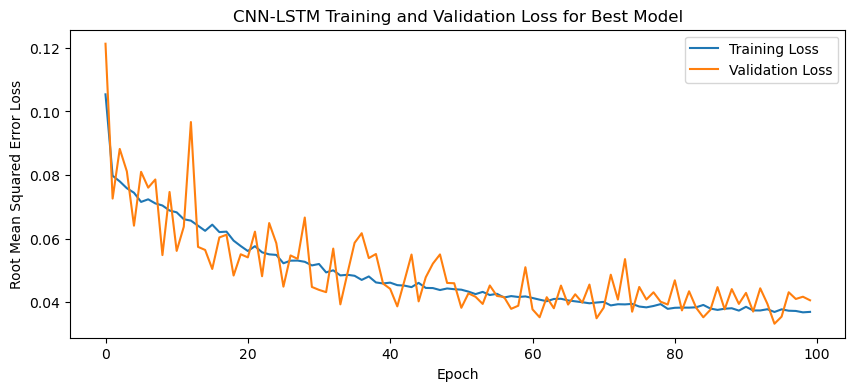

1/1 - 4s - loss: 0.0286 - 4s/epoch - 4s/step
Test Loss: 0.028552645817399025
1/1 [==============================] - 0s 27ms/step


NameError: name 'series' is not defined

In [3]:
n_batch = 1
nb_epoch = 100

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
 
# fit a CNN-LSTM network to training data
#Adapted from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters to be tuned by Optuna (taken from Javier Leon's dissertation 'Fruit Prices')
    lr = trial.suggest_float('lr', 1e-3, 1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    if optimizer_name == 'Adam':
        optimizer = Adam(learning_rate=lr)
    elif optimizer_name == 'RMSprop':
        optimizer = RMSprop(learning_rate=lr)
    else:
        optimizer = SGD(learning_rate=lr)
    
    #Optuna will try either Rectified Linear Unit (ReLU) = max(0, x), tanh, or sigmoid functions
    activation_function = trial.suggest_categorical('activation_function', ['relu', 'tanh', 'sigmoid'])
    
    filters = trial.suggest_categorical('filters', [256, 512, 1024]) # Used for CNN-LSTM model
    lstm_units = trial.suggest_categorical('lstm_units', [256, 512, 1024])
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5)

    # design network
    model = Sequential()
    model.add(Conv1D(filters=filters, kernel_size=1, activation='relu', input_shape=(X.shape[1], X.shape[2]))) # CNN-LSTM only
    model.add(MaxPooling1D(pool_size=1)) # CNN-LSTM Only
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units, return_sequences=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer)
        
    return model

def objective(trial):
    
    cv_accuracies = []
        
    for i in range(5):
        train1 = train[i]
        test1 = test[i]
        validation1 = validation[i]

        X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
        X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
        X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
        X = X.reshape(X.shape[0], 1, X.shape[1])
        X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
        X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])
    
        model = create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch)

        history = model.fit(X, y, validation_data=(X_val, y_val), epochs=nb_epoch, verbose=0)

        cv_accuracy = model.evaluate(X_test, y_test, verbose=0)
    
        loss = history.history['val_loss'][-1]
    
        # Plotting the training and validation loss
        #plt.figure(figsize=(10, 4))
        #plt.plot(history.history['loss'], label='Training Loss')
        #plt.plot(history.history['val_loss'], label='Validation Loss')
        #title1 = "CNN-LSTM Training and Validation Loss for Fold " + str(i+1)
        #plt.title(title1)
        #plt.xlabel('Epoch')
        #plt.ylabel('Root Mean Squared Error Loss')
        #plt.legend()
        #plt.show()
            
        cv_accuracies.append(cv_accuracy)
    
    print("Cross Validation Accuracies:")
    print(cv_accuracies)
    print("Mean Cross Validation Accuracy:")
    print(np.mean(cv_accuracies))
    print("Standard Deviation of Cross Validation Accuracy:")
    print(np.std(cv_accuracies))
        
    return np.mean(cv_accuracies)

# Make one forecast with a CNN-LSTM
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_cnnlstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# Evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_cnnlstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# Invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # Invert the first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # Propagate the difference forecast using the inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# Inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # Create an array from the forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# Evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test, n_seq, n_lag):
    # plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Specific Humidity")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100

# Optimize and fit the model
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)
print('Number of finished trials:', len(study.trials))

print('Best trial:', study.best_trial.params)
best_params = study.best_params
print("Best hyperparameters: ", best_params)
    
rmse_avg_list = []
mae_avg_list = []
mape_avg_list = []
r2_score_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq:]

    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    series = pd.Series(dataset[:, 0]) # Using first column (specific humidity)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_model(optuna.trial.FixedTrial(best_params), X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction

    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse_avg_list.append(rmse_list)
    mae_avg_list.append(mae_list)
    mape_avg_list.append(mape_list)
    r2_score_avg_list.append(r2_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)

    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual S.H.\tPredicted S.H.\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        
        plot_forecasts(series_ws, forecasts_ws, n_test, n_seq, n_lag)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)
            
        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='CNN-LSTM Model Comparison Specific Humidity Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No GHI)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Specific Humidity')
        plt.legend()
        plt.show()

    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'CNN-LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No GHI)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse_avg_list)
print(mae_avg_list)
print(mape_avg_list)
print(r2_score_avg_list)
print(forecast_results)
print(actual_results)
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse_avg_list)
print("Average RMSE:"+str(np.mean(rmse_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))

# Plot model architecture
filename = "cnnlstm_model_optimized_SH_S12_No_GHI.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)

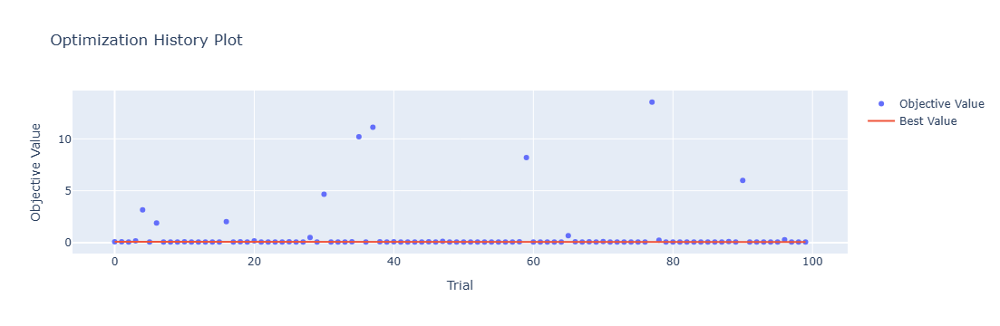

In [4]:
optuna.visualization.plot_optimization_history(study)

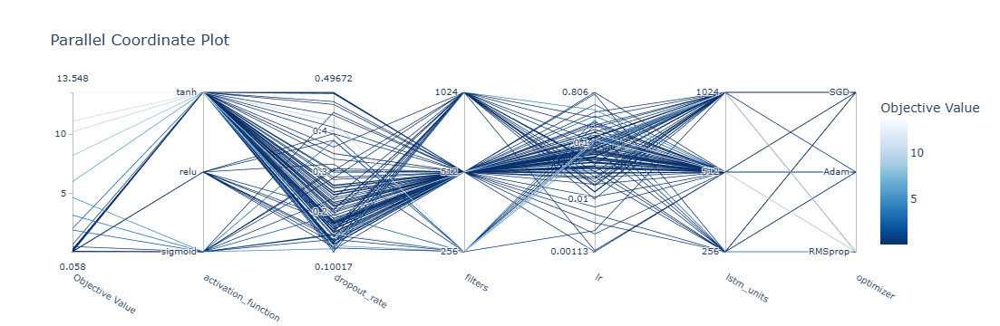

In [5]:
optuna.visualization.plot_parallel_coordinate(study)

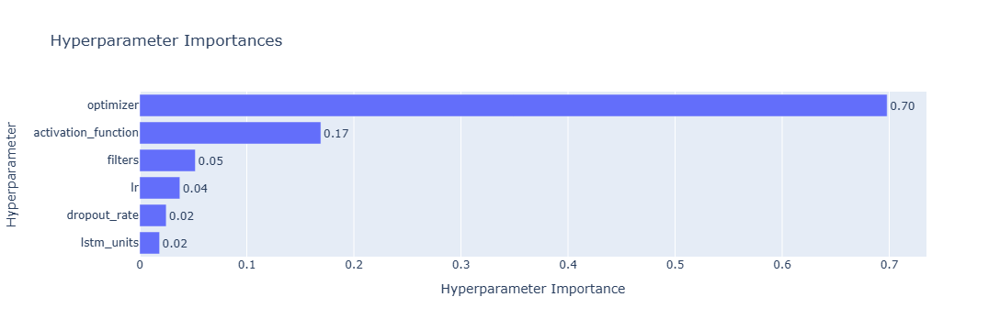

In [6]:
optuna.visualization.plot_param_importances(study)

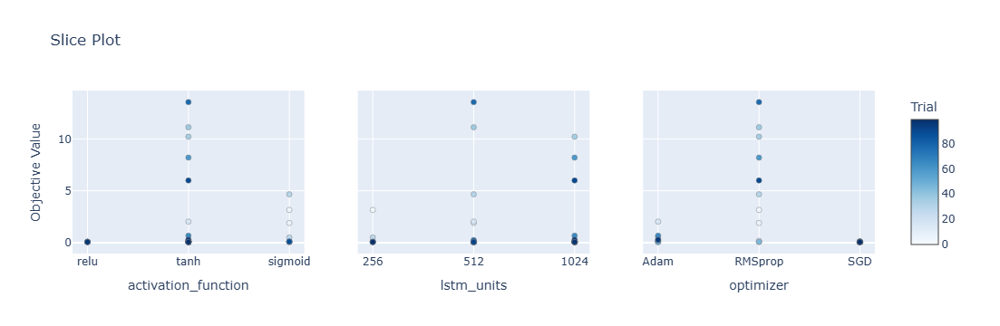

In [7]:
optuna.visualization.plot_slice(study, params=['optimizer', 'activation_function', 'lstm_units'])

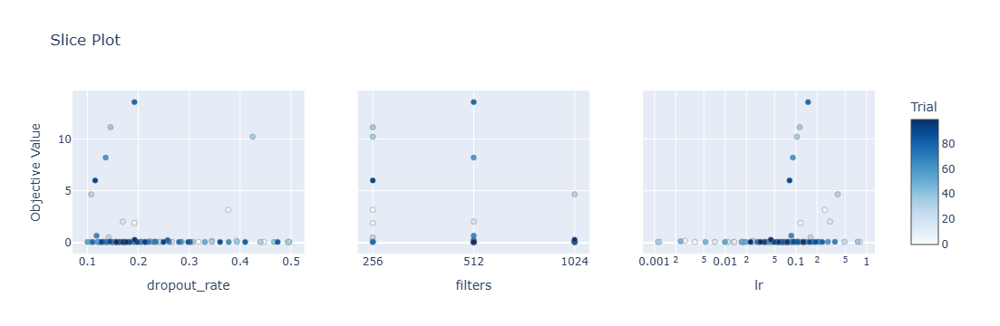

In [8]:
optuna.visualization.plot_slice(study, params=['lr', 'dropout_rate', 'filters'])

Epoch 1/100
84/84 [==============================] - 22s 91ms/step - loss: 0.1146 - accuracy: 0.6071 - mae: 0.0955 - rmse: 0.1146 - mape: 20.3607 - pearson: 0.6495 - val_loss: 0.0962 - val_accuracy: 0.8000 - val_mae: 0.0833 - val_rmse: 0.0962 - val_mape: 17.7295 - val_pearson: 0.7413
Epoch 2/100
84/84 [==============================] - 3s 40ms/step - loss: 0.0838 - accuracy: 0.6310 - mae: 0.0672 - rmse: 0.0838 - mape: 15.0748 - pearson: 0.7280 - val_loss: 0.0888 - val_accuracy: 0.0000e+00 - val_mae: 0.0680 - val_rmse: 0.0888 - val_mape: 14.7545 - val_pearson: 0.5708
Epoch 3/100
84/84 [==============================] - 3s 41ms/step - loss: 0.0770 - accuracy: 0.6190 - mae: 0.0609 - rmse: 0.0770 - mape: 13.7948 - pearson: 0.7554 - val_loss: 0.1126 - val_accuracy: 0.8000 - val_mae: 0.0846 - val_rmse: 0.1126 - val_mape: 17.8483 - val_pearson: 0.5711
Epoch 4/100
84/84 [==============================] - 3s 39ms/step - loss: 0.0763 - accuracy: 0.7024 - mae: 0.0615 - rmse: 0.0763 - mape: 13.830

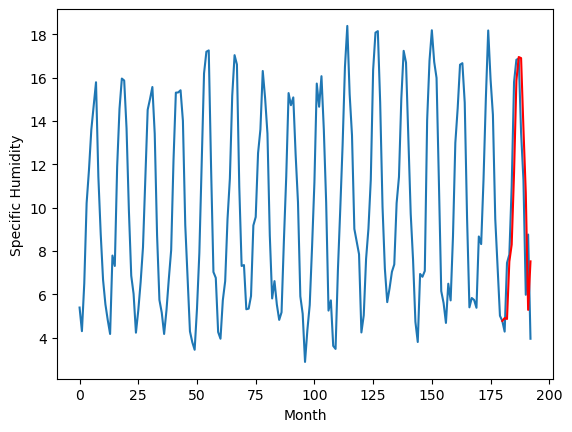

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.90		4.72		-0.18
5.61		5.62		0.01
7.82		7.51		-0.31
8.04		8.06		0.02
10.53		10.66		0.13
15.28		14.87		-0.41
16.08		15.87		-0.21
16.24		16.12		-0.12
14.08		13.68		-0.40
11.00		10.71		-0.29
5.34		5.10		-0.24
8.98		8.04		-0.94
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.05, 4.7244030117988585, 5.624113070964813, 7.506606924533844, 8.063381063938142, 10.65768085718155, 14.873895990848542, 15.869512307643891, 16.123206394910813, 13.681967276334763, 10.709185141324998, 5.104727286100388, 8.037049788236619]


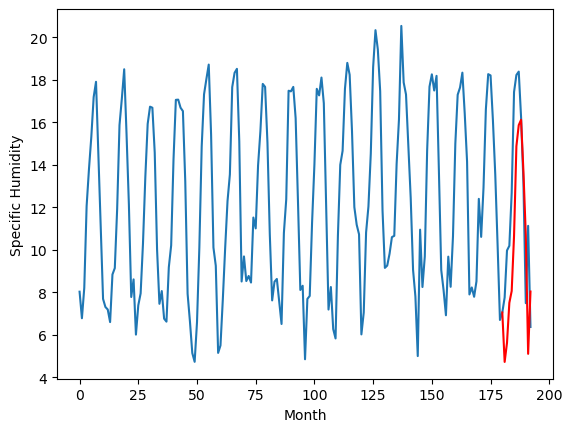

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.82		4.45		-0.37
4.97		4.94		-0.03
6.82		6.93		0.11
7.06		7.72		0.66
9.82		10.23		0.41
14.44		14.69		0.25
16.35		15.80		-0.55
16.55		16.12		-0.43
13.55		13.29		-0.26
10.83		10.47		-0.36
4.96		4.71		-0.25
7.36		7.09		-0.27
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.06, 4.4524980378896, 4.941358317211271, 6.931671251133085, 7.723742116764188, 10.225247730091215, 14.685829986408354, 15.80262826807797, 16.121867646053435, 13.293740977123381, 10.472546805217863, 4.707732905223967, 7.086541642025114]


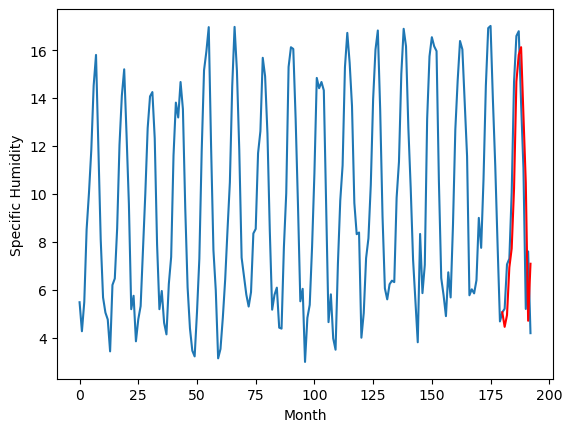

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.21		4.32		0.11
4.12		4.90		0.78
7.57		7.24		-0.33
8.14		7.77		-0.37
11.65		10.90		-0.75
15.55		15.04		-0.51
16.39		16.01		-0.38
16.01		16.04		0.03
13.70		13.29		-0.41
11.27		10.22		-1.05
5.06		4.71		-0.35
8.11		7.67		-0.44
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.05, 4.3226661378145215, 4.9027872377634045, 7.2433634096384045, 7.773603110909462, 10.89781561434269, 15.035022168755532, 16.010340779423714, 16.03958357438445, 13.287518154233695, 10.215172420591117, 4.7055288659036165, 7.668180595487357]


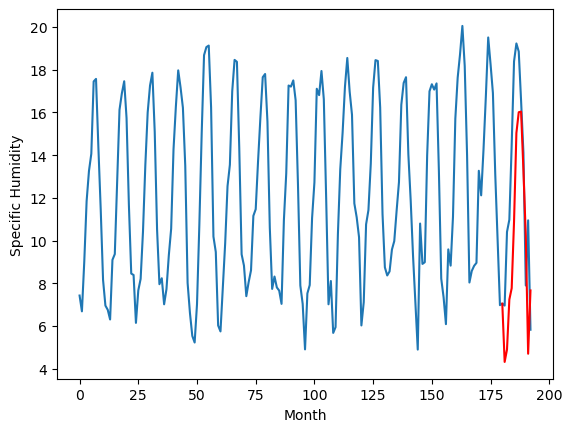

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.32		5.53		0.21
4.92		5.20		0.28
7.76		8.05		0.29
9.16		8.82		-0.34
13.17		12.60		-0.57
16.86		16.37		-0.49
17.57		17.44		-0.13
17.49		17.06		-0.43
13.26		13.80		0.54
11.17		10.68		-0.49
6.95		6.14		-0.81
9.71		7.99		-1.72
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.2, 5.534576653838157, 5.195878564715385, 8.047026693224907, 8.823222934603692, 12.60495620906353, 16.37444025218487, 17.438034355044365, 17.058372049927712, 13.801650314927102, 10.679070263504983, 6.139337807297707, 7.991245418190957]


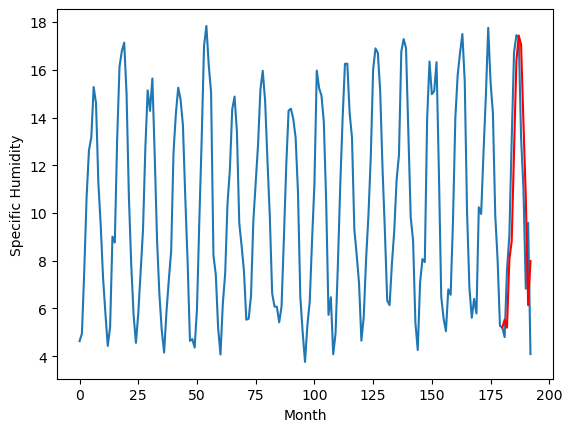

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.42		7.93		0.51
8.01		8.44		0.43
9.58		10.03		0.45
10.59		11.02		0.43
13.09		13.03		-0.06
18.35		17.55		-0.80
19.47		18.75		-0.72
20.63		19.27		-1.36
16.54		16.56		0.02
14.22		13.87		-0.35
8.96		8.25		-0.71
10.38		10.08		-0.30
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.16, 7.931162326335906, 8.441515235900878, 10.030191807746887, 11.015584378242492, 13.034855513572692, 17.551520018577577, 18.74789360046387, 19.266146092414857, 16.5572833108902, 13.867533116340638, 8.25161114215851, 10.078506021499635]


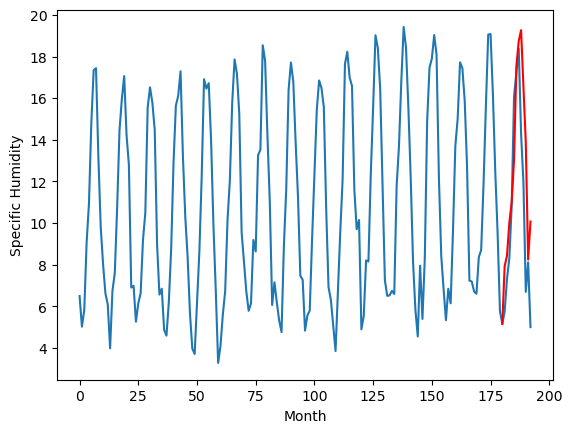

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.33		5.40		0.07
5.38		5.82		0.44
6.97		7.66		0.69
7.57		8.57		1.00
10.57		10.84		0.27
14.95		15.39		0.44
16.39		16.57		0.18
16.92		17.00		0.08
13.60		14.15		0.55
11.49		11.43		-0.06
5.74		5.66		-0.08
7.58		7.69		0.11
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.05, 5.404173310399056, 5.815749581456185, 7.657888825535775, 8.571708198189736, 10.837421174645424, 15.39221596300602, 16.57296526014805, 17.00421759068966, 14.14854713857174, 11.425349916815758, 5.656467642188073, 7.691305126547814]


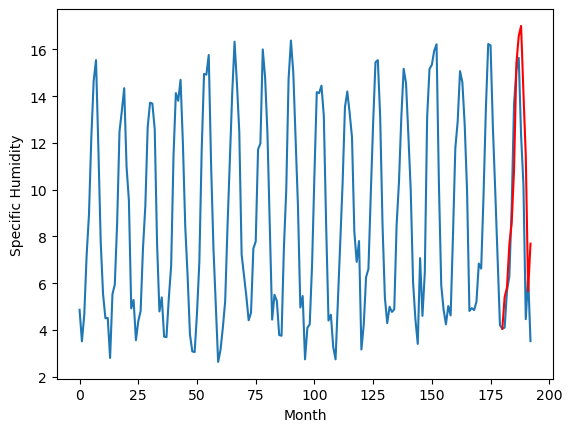

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
7.12		7.27		0.15
7.15		7.58		0.43
8.77		9.32		0.55
9.47		10.37		0.90
12.49		12.42		-0.07
16.76		17.09		0.33
18.26		18.33		0.07
18.54		18.86		0.32
15.05		15.93		0.88
13.17		13.32		0.15
7.38		7.51		0.13
9.15		9.22		0.07
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.64, 7.27481506049633, 7.575659372210502, 9.324210621714592, 10.368653632998466, 12.421306945681572, 17.085813857913017, 18.329103686213493, 18.85855642735958, 15.932296194434166, 13.317552723288536, 7.510980762839317, 9.216139711737632]


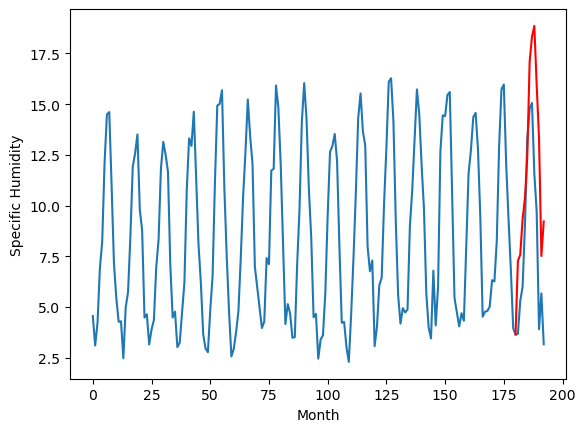

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.40		4.56		0.16
3.72		4.24		0.52
6.78		6.83		0.05
7.51		7.83		0.32
10.42		10.83		0.41
15.40		15.31		-0.09
16.90		16.52		-0.38
17.09		16.59		-0.50
13.28		13.13		-0.15
10.86		10.36		-0.50
5.57		4.84		-0.73
7.16		6.50		-0.66
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.46, 4.558091704845428, 4.242136334180832, 6.827245806455612, 7.829881047010422, 10.827813719511031, 15.311157797574996, 16.524368976354598, 16.593193975389003, 13.13313552469015, 10.359576908051967, 4.8424913558363905, 6.495049324929713]


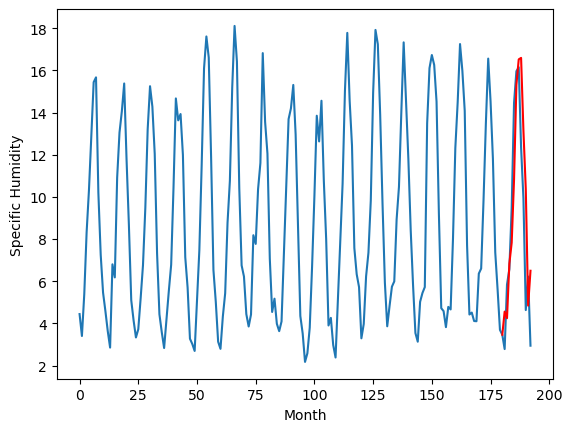

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.17		6.25		0.08
5.72		6.04		0.32
7.52		8.05		0.53
8.84		9.32		0.48
10.93		11.38		0.45
15.70		16.28		0.58
16.63		17.64		1.01
17.05		18.16		1.11
13.88		14.79		0.91
12.57		12.35		-0.22
7.05		6.40		-0.65
7.89		7.55		-0.34
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.93, 6.245353937149048, 6.037593171000481, 8.054583594202995, 9.323407217860222, 11.381495997309685, 16.28106550872326, 17.637896820902824, 18.160683557391167, 14.791349813342094, 12.351609393954277, 6.40499322116375, 7.553630754351616]


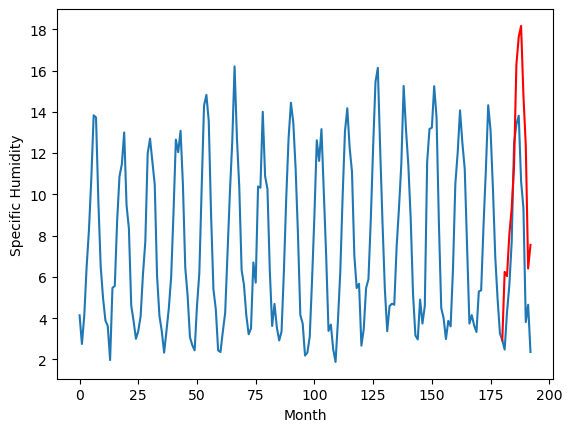

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.48		4.50		0.02
3.74		4.02		0.28
5.36		5.81		0.45
6.96		7.34		0.38
8.48		9.04		0.56
13.61		13.94		0.33
14.68		15.41		0.73
15.17		16.03		0.86
11.55		12.62		1.07
10.56		10.38		-0.18
5.71		4.75		-0.96
5.71		5.02		-0.69
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.74, 4.502700433731079, 4.015230224132538, 5.813427970409394, 7.342692539691925, 9.040037915706634, 13.935424134731292, 15.411974594593048, 16.032931849956512, 12.621377274990081, 10.375311419963836, 4.753000781536102, 5.019327894449233]


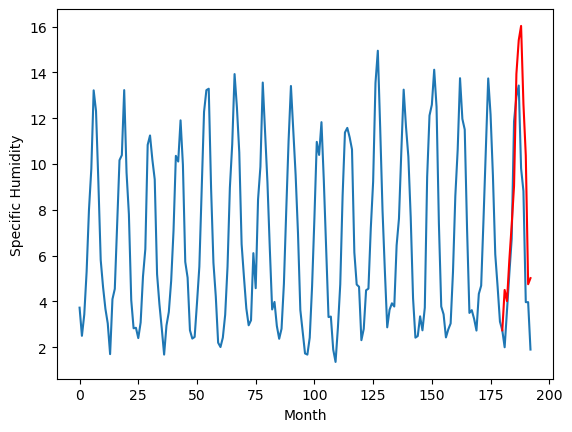

RangeIndex(start=1, stop=12, step=1)
[4.62, 4.899999999999999, 4.820000000000001, 4.209999999999998, 5.32, 7.42, 5.33, 7.119999999999999, 4.4, 6.170000000000001, 4.48]
[4.905773889869452, 4.7244030117988585, 4.4524980378896, 4.3226661378145215, 5.534576653838157, 7.931162326335906, 5.404173310399056, 7.27481506049633, 4.558091704845428, 6.245353937149048, 4.502700433731079]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    4.62   4.905774
1                 1    4.90   4.724403
2                 2    4.82   4.452498
3                 3    4.21   4.322666
4                 4    5.32   5.534577
5                 5    7.42   7.931162
6                 6    5.33   5.404173
7                 7    7.12   7.274815
8                 8    4.40   4.558092
9                 9    6.17   6.245354
10               10    4.48   4.502700


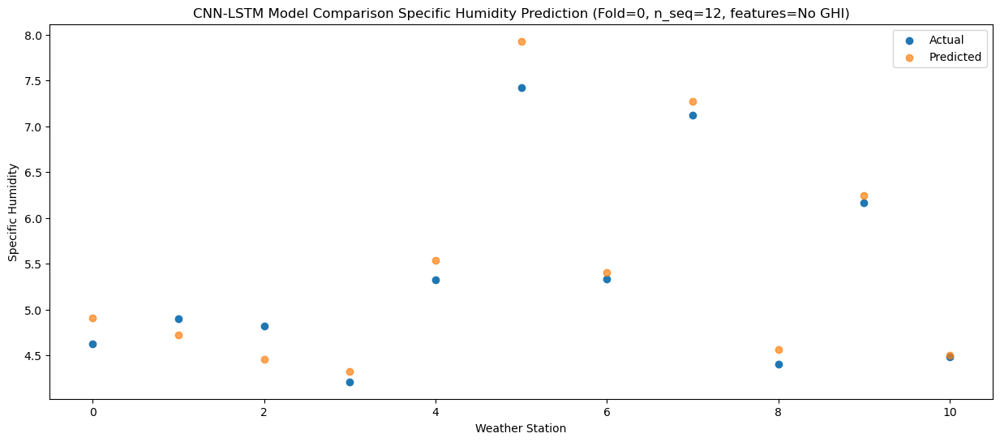

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    4.13   4.863269
1                 1    5.61   5.624113
2                 2    4.97   4.941358
3                 3    4.12   4.902787
4                 4    4.92   5.195879
5                 5    8.01   8.441515
6                 6    5.38   5.815750
7                 7    7.15   7.575659
8                 8    3.72   4.242136
9                 9    5.72   6.037593
10               10    3.74   4.015230


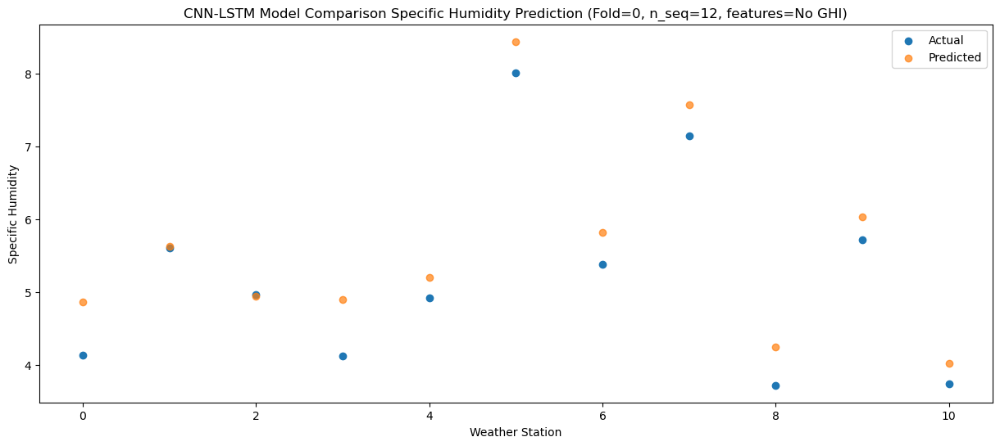

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    7.30   7.513771
1                 1    7.82   7.506607
2                 2    6.82   6.931671
3                 3    7.57   7.243363
4                 4    7.76   8.047027
5                 5    9.58  10.030192
6                 6    6.97   7.657889
7                 7    8.77   9.324211
8                 8    6.78   6.827246
9                 9    7.52   8.054584
10               10    5.36   5.813428


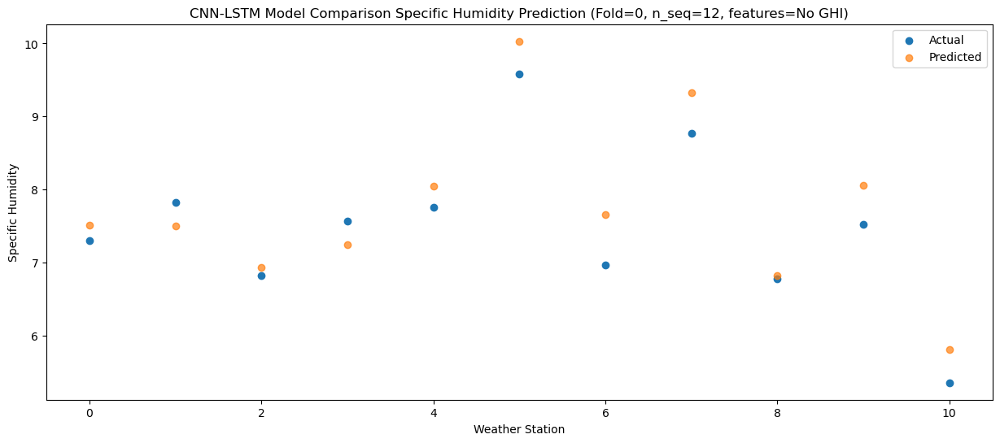

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    7.69   8.296573
1                 1    8.04   8.063381
2                 2    7.06   7.723742
3                 3    8.14   7.773603
4                 4    9.16   8.823223
5                 5   10.59  11.015584
6                 6    7.57   8.571708
7                 7    9.47  10.368654
8                 8    7.51   7.829881
9                 9    8.84   9.323407
10               10    6.96   7.342693


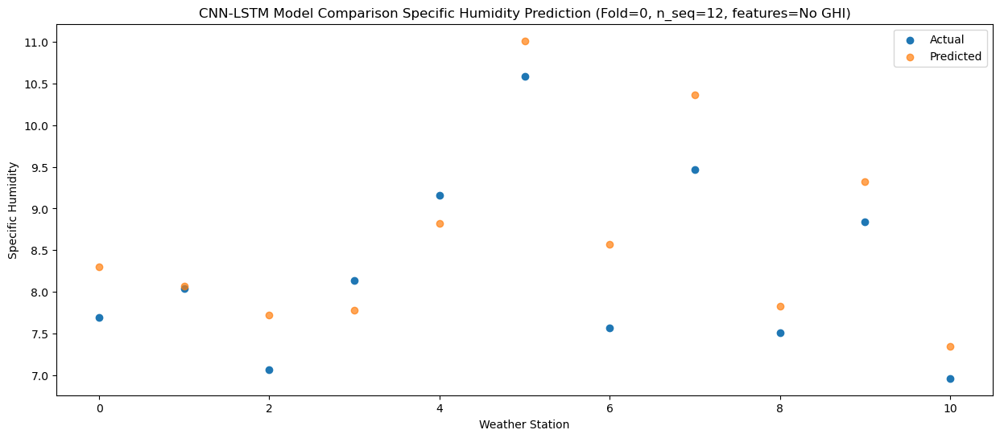

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   10.84  11.601656
1                 1   10.53  10.657681
2                 2    9.82  10.225248
3                 3   11.65  10.897816
4                 4   13.17  12.604956
5                 5   13.09  13.034856
6                 6   10.57  10.837421
7                 7   12.49  12.421307
8                 8   10.42  10.827814
9                 9   10.93  11.381496
10               10    8.48   9.040038


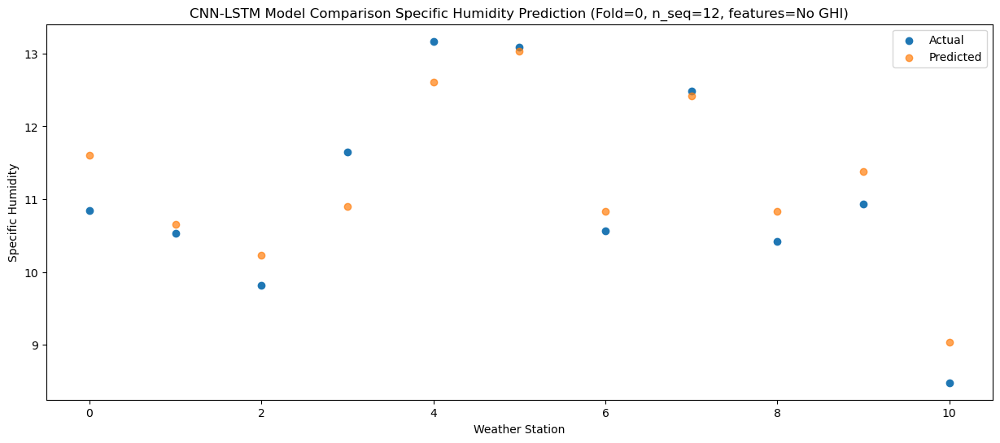

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   15.65  15.863171
1                 1   15.28  14.873896
2                 2   14.44  14.685830
3                 3   15.55  15.035022
4                 4   16.86  16.374440
5                 5   18.35  17.551520
6                 6   14.95  15.392216
7                 7   16.76  17.085814
8                 8   15.40  15.311158
9                 9   15.70  16.281066
10               10   13.61  13.935424


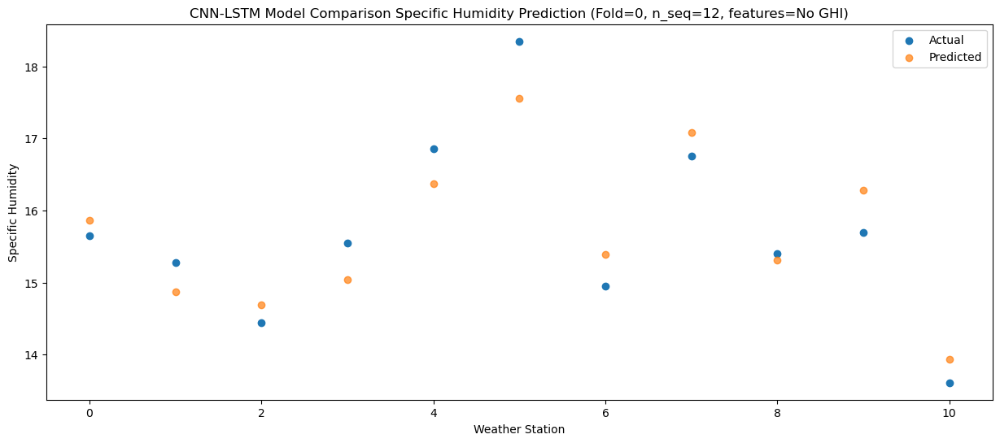

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   16.68  16.953643
1                 1   16.08  15.869512
2                 2   16.35  15.802628
3                 3   16.39  16.010341
4                 4   17.57  17.438034
5                 5   19.47  18.747894
6                 6   16.39  16.572965
7                 7   18.26  18.329104
8                 8   16.90  16.524369
9                 9   16.63  17.637897
10               10   14.68  15.411975


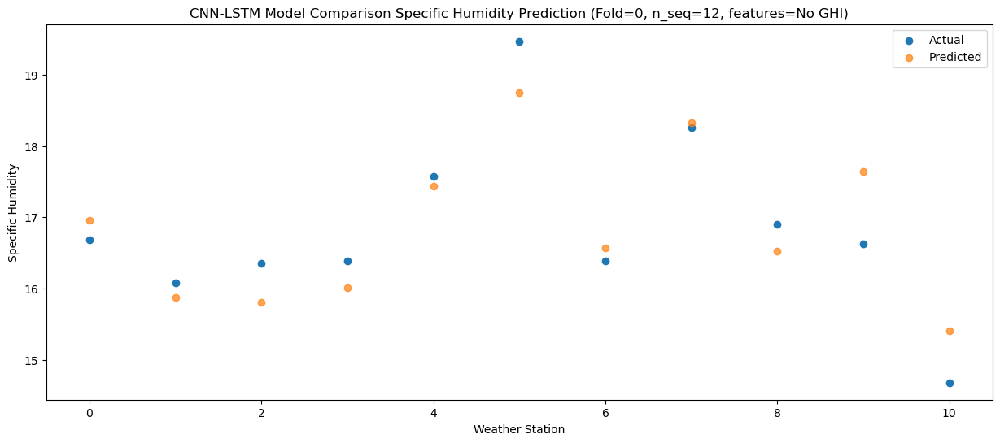

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   16.73  16.904458
1                 1   16.24  16.123206
2                 2   16.55  16.121868
3                 3   16.01  16.039584
4                 4   17.49  17.058372
5                 5   20.63  19.266146
6                 6   16.92  17.004218
7                 7   18.54  18.858556
8                 8   17.09  16.593194
9                 9   17.05  18.160684
10               10   15.17  16.032932


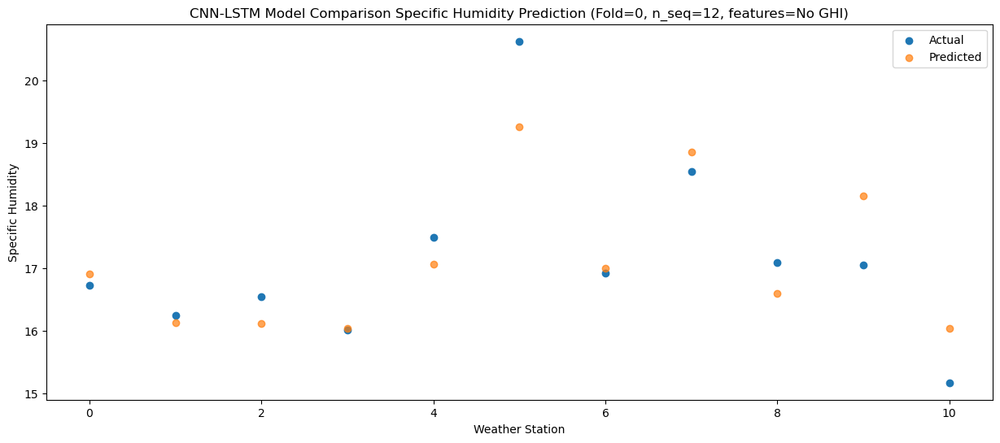

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   13.31  13.656752
1                 1   14.08  13.681967
2                 2   13.55  13.293741
3                 3   13.70  13.287518
4                 4   13.26  13.801650
5                 5   16.54  16.557283
6                 6   13.60  14.148547
7                 7   15.05  15.932296
8                 8   13.28  13.133136
9                 9   13.88  14.791350
10               10   11.55  12.621377


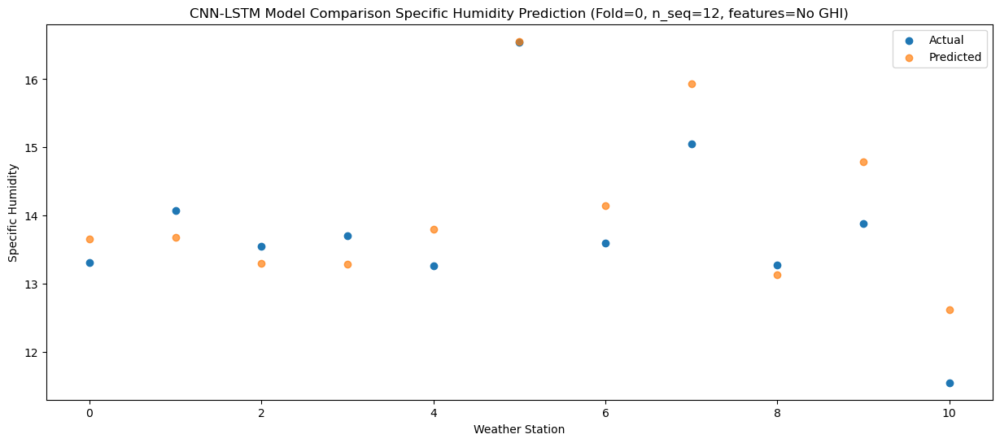

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   11.13  10.683621
1                 1   11.00  10.709185
2                 2   10.83  10.472547
3                 3   11.27  10.215172
4                 4   11.17  10.679070
5                 5   14.22  13.867533
6                 6   11.49  11.425350
7                 7   13.17  13.317553
8                 8   10.86  10.359577
9                 9   12.57  12.351609
10               10   10.56  10.375311


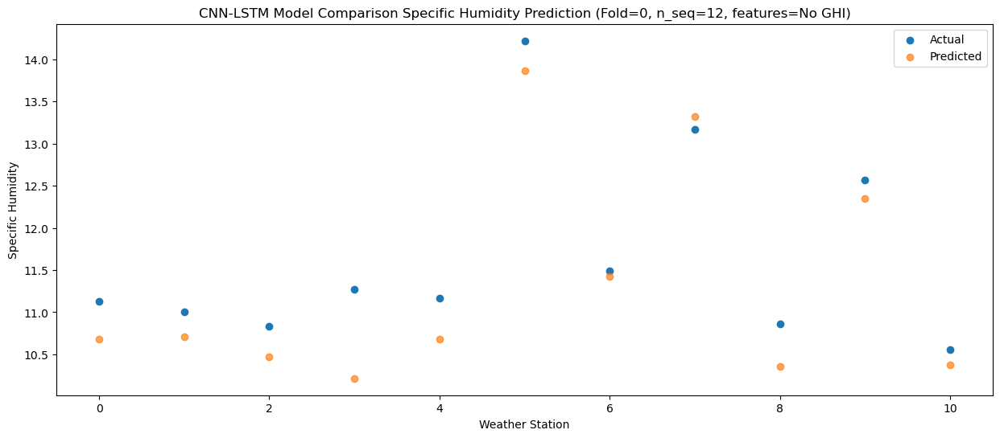

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    5.83   5.283087
1                 1    5.34   5.104727
2                 2    4.96   4.707733
3                 3    5.06   4.705529
4                 4    6.95   6.139338
5                 5    8.96   8.251611
6                 6    5.74   5.656468
7                 7    7.38   7.510981
8                 8    5.57   4.842491
9                 9    7.05   6.404993
10               10    5.71   4.753001


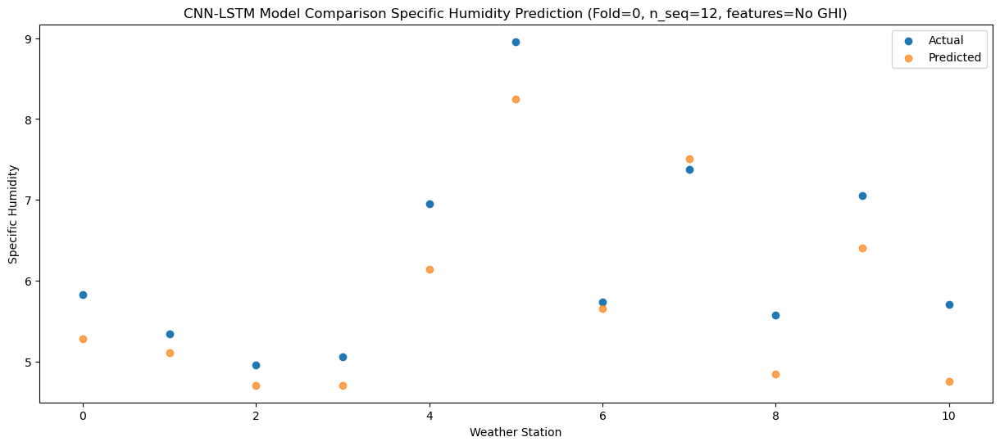

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    8.61   7.521418
1                 1    8.98   8.037050
2                 2    7.36   7.086542
3                 3    8.11   7.668181
4                 4    9.71   7.991245
5                 5   10.38  10.078506
6                 6    7.58   7.691305
7                 7    9.15   9.216140
8                 8    7.16   6.495049
9                 9    7.89   7.553631
10               10    5.71   5.019328


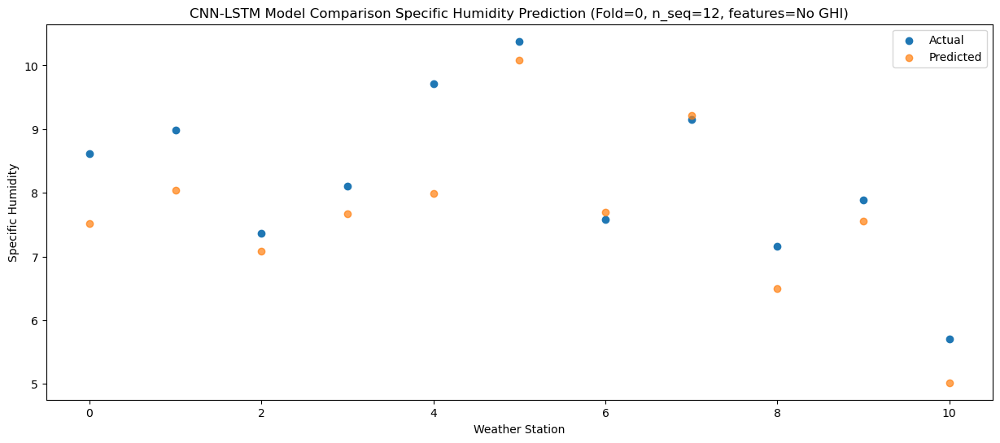

Model: "sequential_501"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_501 (Conv1D)         (None, 1, 512)            1008640   
                                                                 
 max_pooling1d_501 (MaxPooli  (None, 1, 512)           0         
 ng1D)                                                           
                                                                 
 dropout_1503 (Dropout)      (None, 1, 512)            0         
                                                                 
 lstm_1002 (LSTM)            (None, 1, 512)            2099200   
                                                                 
 dropout_1504 (Dropout)      (None, 1, 512)            0         
                                                                 
 lstm_1003 (LSTM)            (None, 512)               2099200   
                                                    

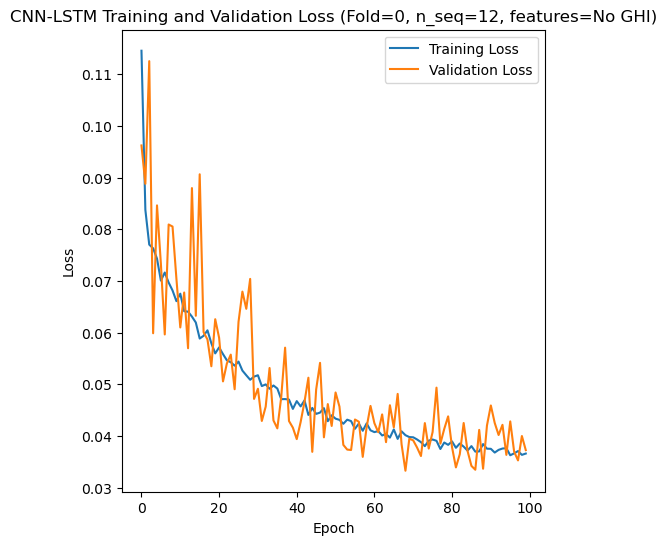

Epoch 1/100
84/84 [==============================] - 25s 119ms/step - loss: 0.1063 - accuracy: 0.6310 - mae: 0.0887 - rmse: 0.1063 - mape: 19.1952 - pearson: 0.6859 - val_loss: 0.0930 - val_accuracy: 0.1000 - val_mae: 0.0780 - val_rmse: 0.0930 - val_mape: 18.8686 - val_pearson: 0.6157
Epoch 2/100
84/84 [==============================] - 3s 40ms/step - loss: 0.0845 - accuracy: 0.6667 - mae: 0.0677 - rmse: 0.0845 - mape: 15.3260 - pearson: 0.7192 - val_loss: 0.0806 - val_accuracy: 0.7000 - val_mae: 0.0641 - val_rmse: 0.0806 - val_mape: 13.5642 - val_pearson: 0.7855
Epoch 3/100
84/84 [==============================] - 2s 28ms/step - loss: 0.0787 - accuracy: 0.7143 - mae: 0.0637 - rmse: 0.0787 - mape: 14.4672 - pearson: 0.7610 - val_loss: 0.1128 - val_accuracy: 0.7000 - val_mae: 0.0877 - val_rmse: 0.1128 - val_mape: 23.5311 - val_pearson: 0.3917
Epoch 4/100
84/84 [==============================] - 3s 34ms/step - loss: 0.0772 - accuracy: 0.7262 - mae: 0.0608 - rmse: 0.0772 - mape: 13.8321 -

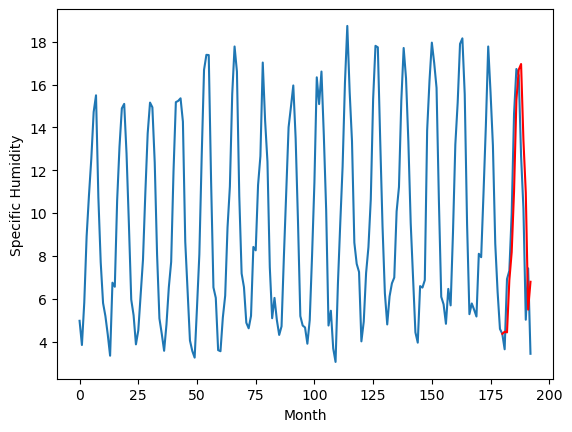

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
1.84		2.09		0.25
1.16		1.55		0.39
3.01		3.65		0.64
3.13		4.92		1.79
8.25		7.91		-0.34
11.16		10.55		-0.61
12.77		11.89		-0.88
11.15		11.28		0.13
8.33		8.23		-0.10
4.94		5.94		1.00
2.51		3.35		0.84
1.45		2.80		1.35
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.82, 2.0899882757663724, 1.5481851541996, 3.647706075906753, 4.920975013971328, 7.906079574823379, 10.546971365213395, 11.890264555215836, 11.28160081744194, 8.22782908320427, 5.937074288129807, 3.351260527372361, 2.799532636404038]


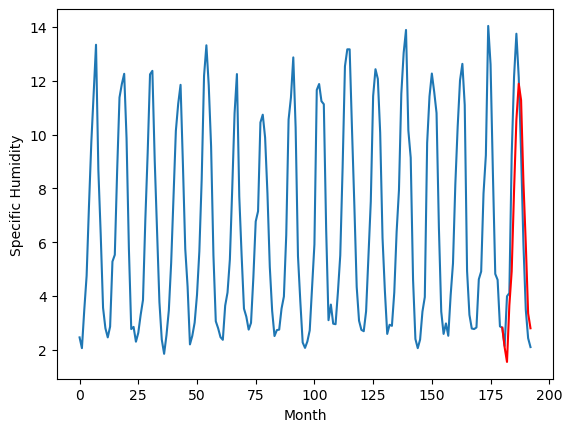

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.53		5.06		-0.47
7.66		5.97		-1.69
7.88		7.00		-0.88
8.85		7.86		-0.99
10.16		9.54		-0.62
13.94		13.57		-0.37
14.34		14.60		0.26
14.96		15.22		0.26
13.68		12.91		-0.77
11.02		10.60		-0.42
7.07		5.73		-1.34
8.47		7.30		-1.17
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[9.16, 5.064716705083847, 5.968985685110092, 6.997748860120773, 7.864171394109726, 9.539323099851607, 13.56506849169731, 14.596372851133346, 15.21540082335472, 12.907115348577499, 10.597641357183456, 5.729942210912704, 7.299919375181197]


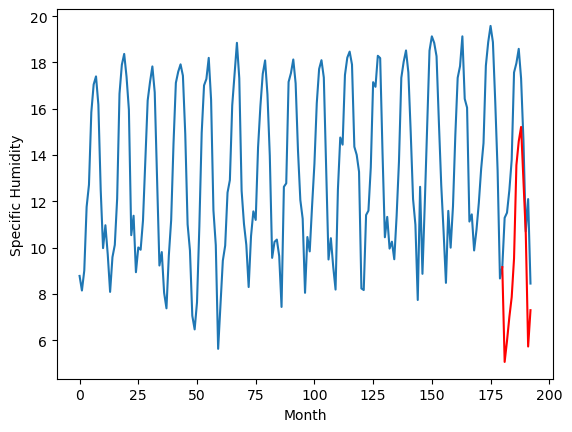

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.98		4.60		0.62
4.15		4.47		0.32
4.79		5.40		0.61
6.14		7.20		1.06
7.82		8.10		0.28
12.42		12.59		0.17
15.02		13.84		-1.18
15.76		14.86		-0.90
13.10		11.58		-1.52
10.14		10.03		-0.11
5.69		5.29		-0.40
5.33		4.39		-0.94
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.44, 4.604733524322509, 4.466007587909698, 5.397813675403595, 7.197152016162872, 8.095818517208098, 12.594057557582854, 13.842570898532866, 14.859351394176482, 11.580294129848479, 10.033917305469512, 5.293947098255156, 4.386088964939116]


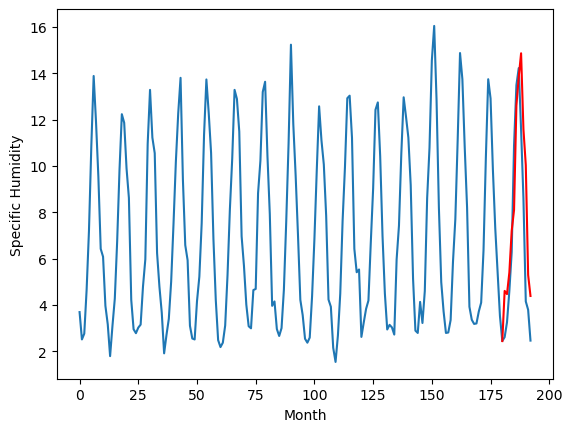

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.10		4.96		-0.14
5.08		5.59		0.51
8.37		7.67		-0.70
8.39		8.55		0.16
11.59		11.33		-0.26
15.48		15.48		-0.00
16.51		16.75		0.24
16.11		17.03		0.92
13.97		14.10		0.13
11.44		11.41		-0.03
5.78		5.83		0.05
9.06		8.15		-0.91
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.65, 4.962069461382925, 5.593440244235098, 7.668746659792959, 8.551159451045095, 11.325561831034719, 15.476924250163137, 16.74708397153765, 17.0331280625239, 14.100738564766942, 11.41133646134287, 5.833753148354589, 8.14801744583994]


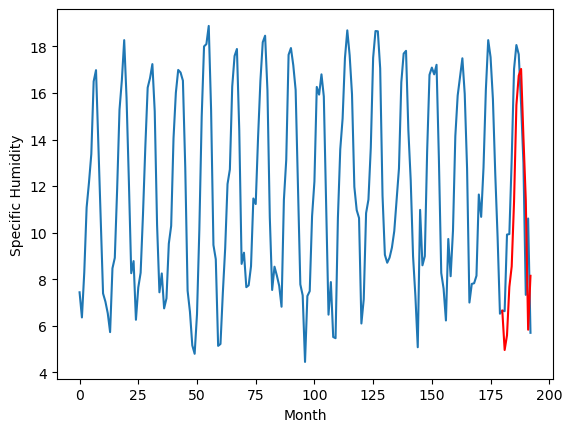

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.33		2.50		0.17
2.28		2.64		0.36
5.27		4.97		-0.30
6.84		6.09		-0.75
11.67		9.17		-2.50
14.31		12.85		-1.46
13.27		14.18		0.91
13.40		14.13		0.73
9.84		10.97		1.13
8.25		8.35		0.10
4.06		3.67		-0.39
6.93		5.14		-1.79
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.19, 2.495000145435333, 2.641317403912544, 4.97156909763813, 6.087995446324348, 9.167627967000008, 12.847262299656869, 14.181032574772836, 14.132470182180406, 10.973314336538316, 8.353934816122056, 3.6654105699062356, 5.139856032133103]


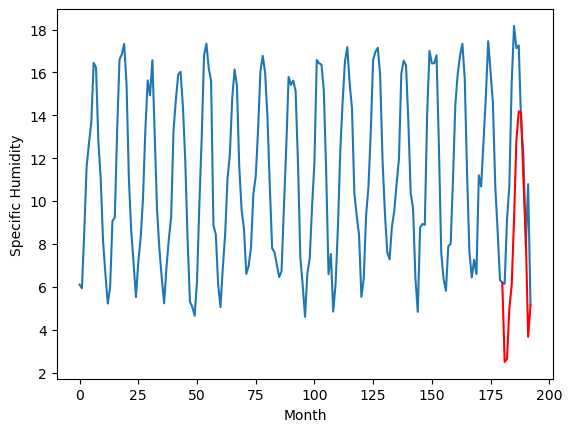

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
8.68		8.80		0.12
8.35		8.64		0.29
11.21		11.19		-0.02
12.53		12.45		-0.08
16.73		15.70		-1.03
20.48		19.29		-1.19
21.30		20.70		-0.60
21.68		20.53		-1.15
17.23		17.11		-0.12
14.62		14.54		-0.08
10.63		10.07		-0.56
13.13		11.10		-2.03
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.78, 8.79690642349422, 8.639287930652499, 11.191181403324007, 12.453053814098238, 15.70397434823215, 19.291771513149143, 20.699724179431797, 20.525000449940563, 17.11324989490211, 14.544923421666027, 10.071996804997326, 11.09600138358772]


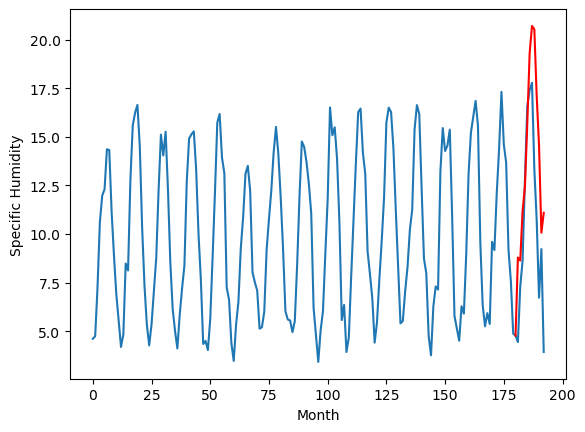

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.97		3.98		0.01
3.84		3.81		-0.03
3.93		4.89		0.96
4.23		6.05		1.82
4.35		7.94		3.59
7.01		10.42		3.41
12.25		11.47		-0.78
12.54		11.18		-1.36
9.78		8.89		-0.89
6.07		6.94		0.87
4.42		5.03		0.61
4.55		4.18		-0.37
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.61, 3.975448282957077, 3.8091492974758148, 4.88926843047142, 6.050183805227279, 7.939677628278732, 10.421369704008102, 11.465469034910202, 11.179911913871765, 8.893975558280944, 6.93533200263977, 5.02619475364685, 4.181692423820495]


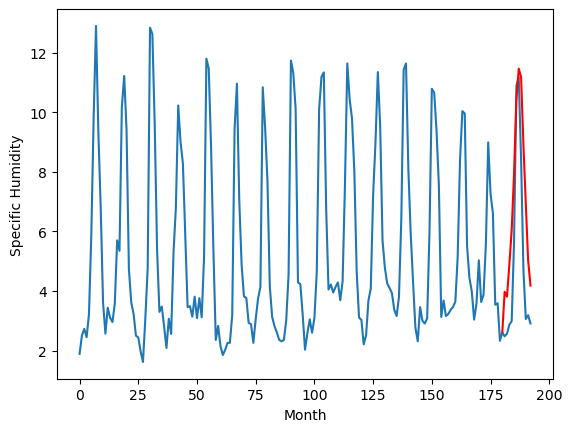

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
8.29		7.84		-0.45
8.82		7.91		-0.91
8.93		8.03		-0.90
10.25		9.07		-1.18
11.73		9.91		-1.82
12.98		12.11		-0.87
14.13		12.86		-1.27
13.53		12.81		-0.72
13.07		11.27		-1.80
10.27		9.69		-0.58
9.73		8.70		-1.03
9.55		7.30		-2.25
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.6, 7.83579126238823, 7.906990351676941, 8.032083647847177, 9.067826645970346, 9.906162219643594, 12.11031814157963, 12.861009793877603, 12.809753934442998, 11.274932543337346, 9.694406549036504, 8.703375736773015, 7.301693121492864]


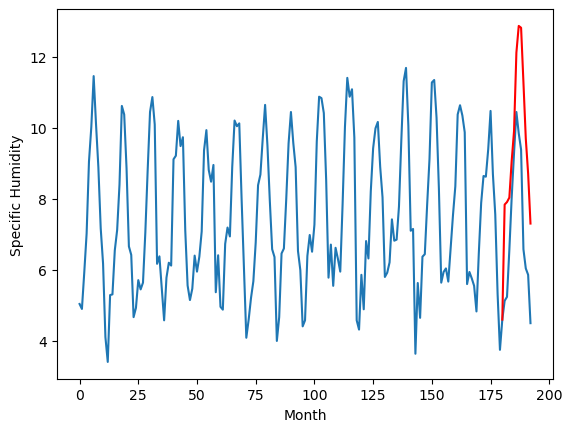

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.98		5.85		-0.13
6.05		6.17		0.12
7.78		7.89		0.11
8.31		9.15		0.84
11.02		11.20		0.18
15.52		15.74		0.22
17.04		17.05		0.01
17.62		17.71		0.09
14.02		14.48		0.46
11.86		12.23		0.37
6.30		6.55		0.25
8.15		7.76		-0.39
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.27, 5.851251488924026, 6.169097995758056, 7.886497354507446, 9.15261206626892, 11.203664875030517, 15.737578010559082, 17.04730830192566, 17.712979590892793, 14.47551635503769, 12.228792226314546, 6.552740609645845, 7.761501348018648]


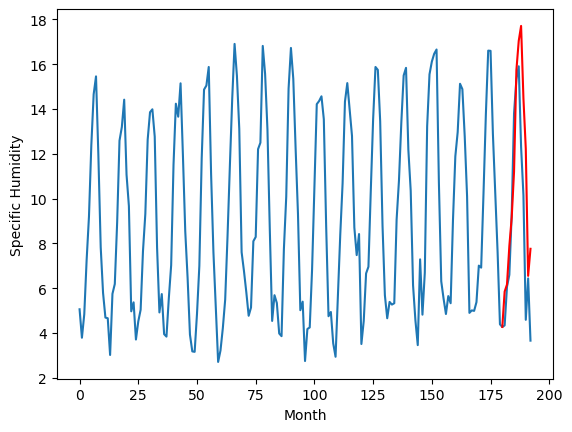

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.63		4.35		-0.28
4.87		4.58		-0.29
5.90		6.32		0.42
6.51		7.65		1.14
9.18		9.67		0.49
13.28		14.23		0.95
14.69		15.56		0.87
15.08		16.24		1.16
11.87		12.93		1.06
10.14		10.74		0.60
4.78		5.07		0.29
6.34		6.12		-0.22
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.91, 4.351681704521179, 4.577009807229042, 6.318992386460304, 7.650073061585426, 9.66732932150364, 14.234924803376199, 15.562594543099404, 16.24470056116581, 12.932623992562295, 10.741493354439736, 5.070032725930215, 6.1199528080225]


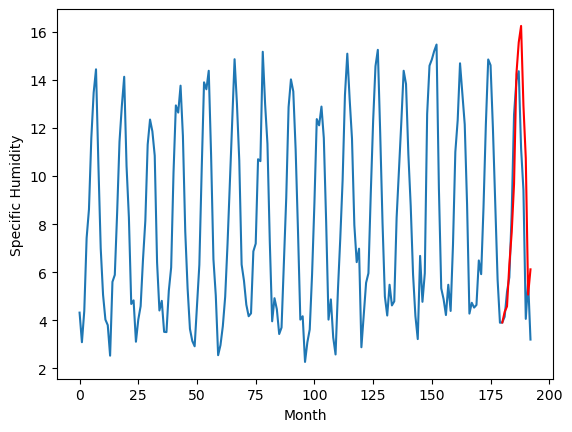

RangeIndex(start=1, stop=12, step=1)
[4.390000000000001, 1.8399999999999992, 5.529999999999999, 3.9799999999999995, 5.1, 2.33, 8.68, 3.9700000000000006, 8.29, 5.9799999999999995, 4.63]
[4.461031417250633, 2.0899882757663724, 5.064716705083847, 4.604733524322509, 4.962069461382925, 2.495000145435333, 8.79690642349422, 3.975448282957077, 7.83579126238823, 5.851251488924026, 4.351681704521179]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    4.39   4.461031
1                 1    1.84   2.089988
2                 2    5.53   5.064717
3                 3    3.98   4.604734
4                 4    5.10   4.962069
5                 5    2.33   2.495000
6                 6    8.68   8.796906
7                 7    3.97   3.975448
8                 8    8.29   7.835791
9                 9    5.98   5.851251
10               10    4.63   4.351682


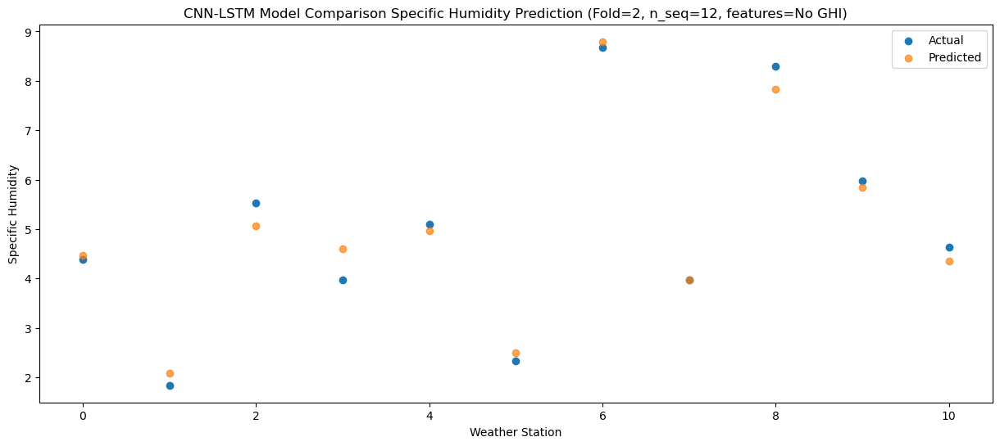

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.67   4.429078
1                 1    1.16   1.548185
2                 2    7.66   5.968986
3                 3    4.15   4.466008
4                 4    5.08   5.593440
5                 5    2.28   2.641317
6                 6    8.35   8.639288
7                 7    3.84   3.809149
8                 8    8.82   7.906990
9                 9    6.05   6.169098
10               10    4.87   4.577010


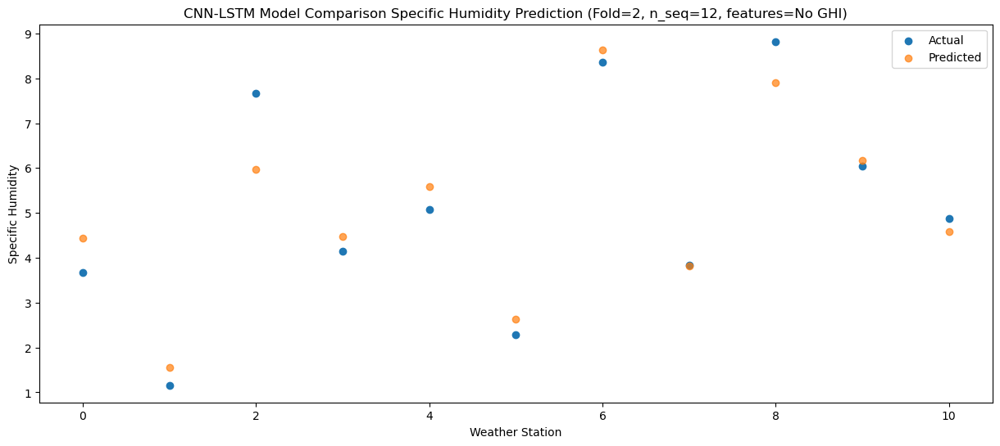

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    6.95   6.865008
1                 1    3.01   3.647706
2                 2    7.88   6.997749
3                 3    4.79   5.397814
4                 4    8.37   7.668747
5                 5    5.27   4.971569
6                 6   11.21  11.191181
7                 7    3.93   4.889268
8                 8    8.93   8.032084
9                 9    7.78   7.886497
10               10    5.90   6.318992


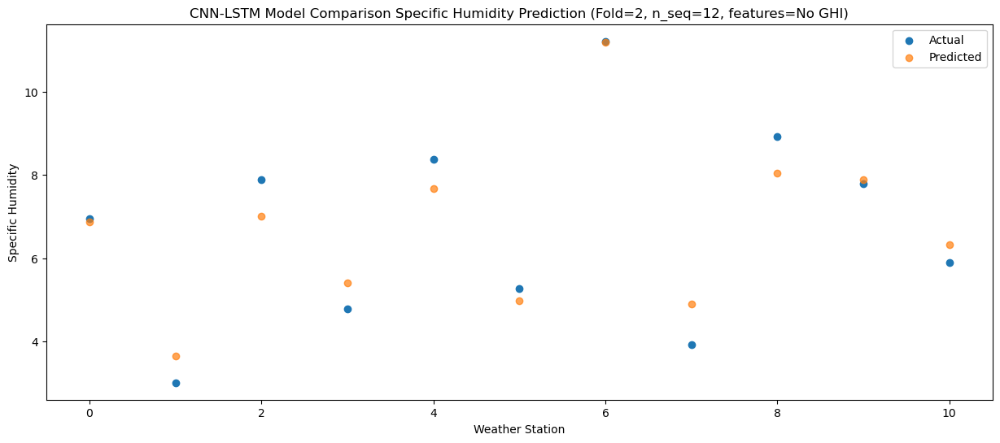

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    7.34   8.178680
1                 1    3.13   4.920975
2                 2    8.85   7.864171
3                 3    6.14   7.197152
4                 4    8.39   8.551159
5                 5    6.84   6.087995
6                 6   12.53  12.453054
7                 7    4.23   6.050184
8                 8   10.25   9.067827
9                 9    8.31   9.152612
10               10    6.51   7.650073


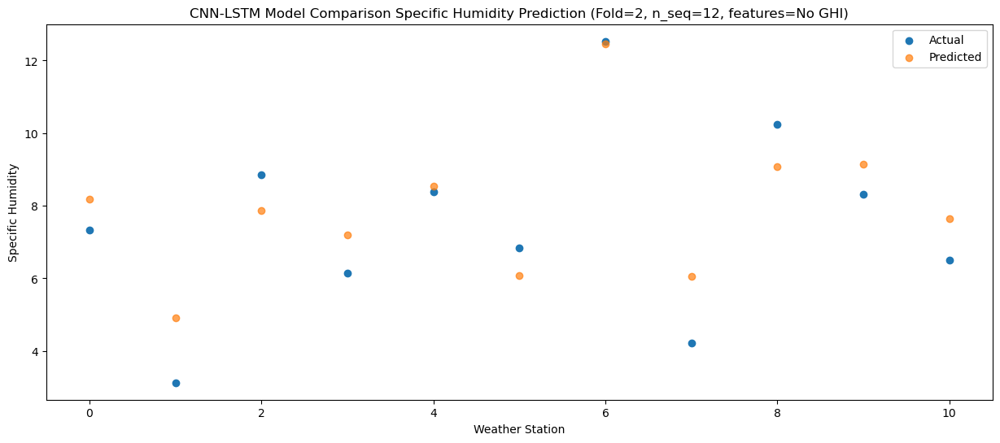

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   10.01  11.013946
1                 1    8.25   7.906080
2                 2   10.16   9.539323
3                 3    7.82   8.095819
4                 4   11.59  11.325562
5                 5   11.67   9.167628
6                 6   16.73  15.703974
7                 7    4.35   7.939678
8                 8   11.73   9.906162
9                 9   11.02  11.203665
10               10    9.18   9.667329


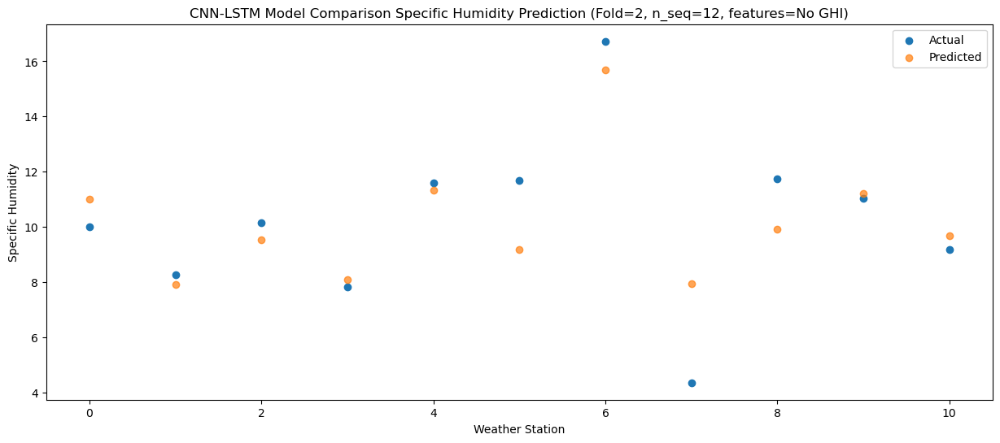

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   14.66  15.272901
1                 1   11.16  10.546971
2                 2   13.94  13.565068
3                 3   12.42  12.594058
4                 4   15.48  15.476924
5                 5   14.31  12.847262
6                 6   20.48  19.291772
7                 7    7.01  10.421370
8                 8   12.98  12.110318
9                 9   15.52  15.737578
10               10   13.28  14.234925


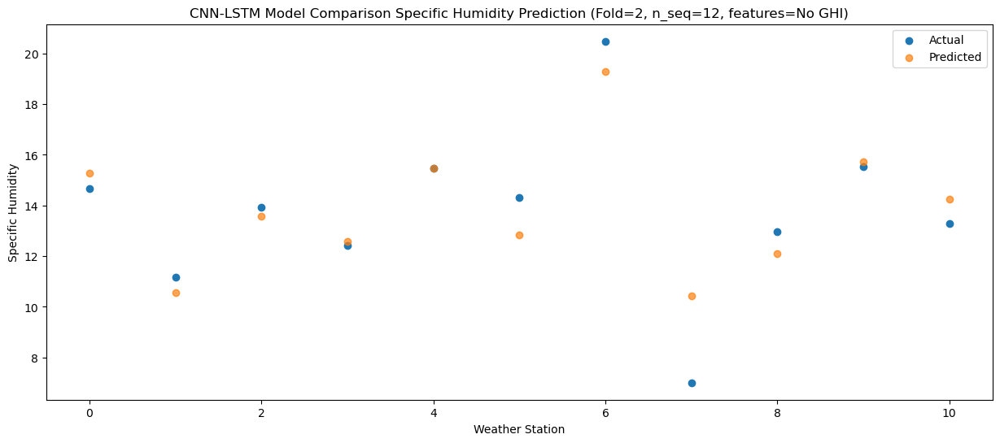

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   16.76  16.698747
1                 1   12.77  11.890265
2                 2   14.34  14.596373
3                 3   15.02  13.842571
4                 4   16.51  16.747084
5                 5   13.27  14.181033
6                 6   21.30  20.699724
7                 7   12.25  11.465469
8                 8   14.13  12.861010
9                 9   17.04  17.047308
10               10   14.69  15.562595


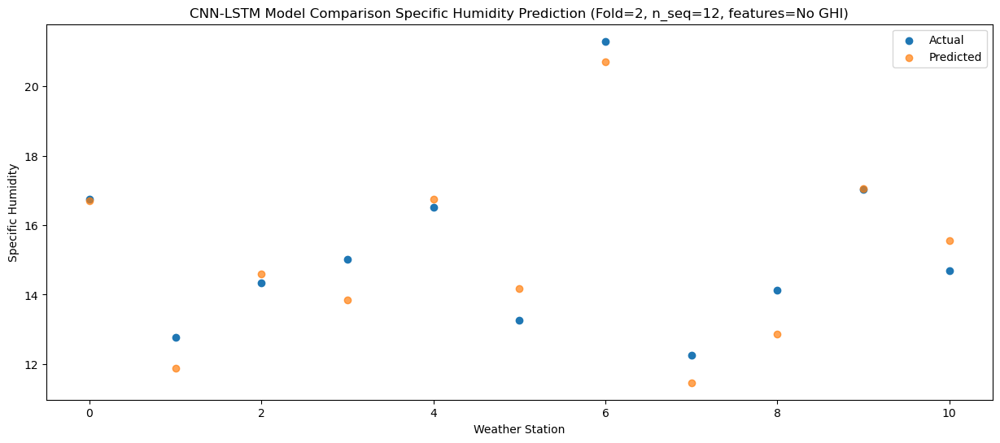

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   16.46  16.961460
1                 1   11.15  11.281601
2                 2   14.96  15.215401
3                 3   15.76  14.859351
4                 4   16.11  17.033128
5                 5   13.40  14.132470
6                 6   21.68  20.525000
7                 7   12.54  11.179912
8                 8   13.53  12.809754
9                 9   17.62  17.712980
10               10   15.08  16.244701


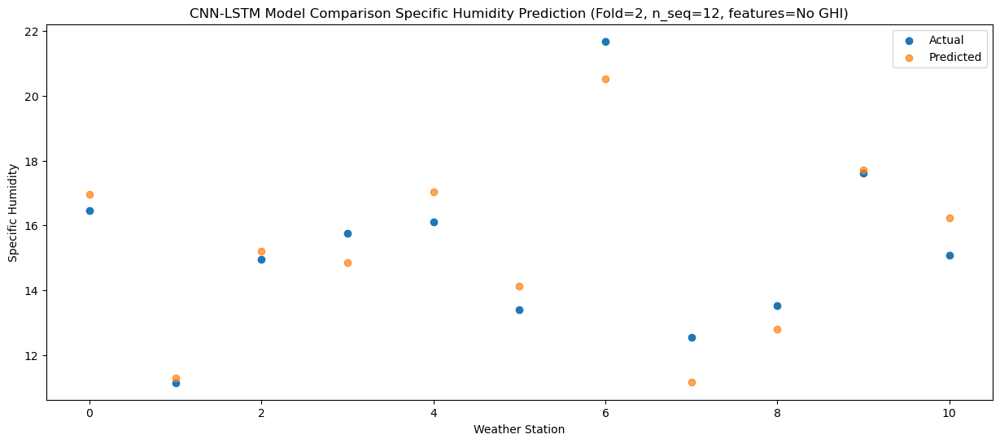

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   12.69  13.396937
1                 1    8.33   8.227829
2                 2   13.68  12.907115
3                 3   13.10  11.580294
4                 4   13.97  14.100739
5                 5    9.84  10.973314
6                 6   17.23  17.113250
7                 7    9.78   8.893976
8                 8   13.07  11.274933
9                 9   14.02  14.475516
10               10   11.87  12.932624


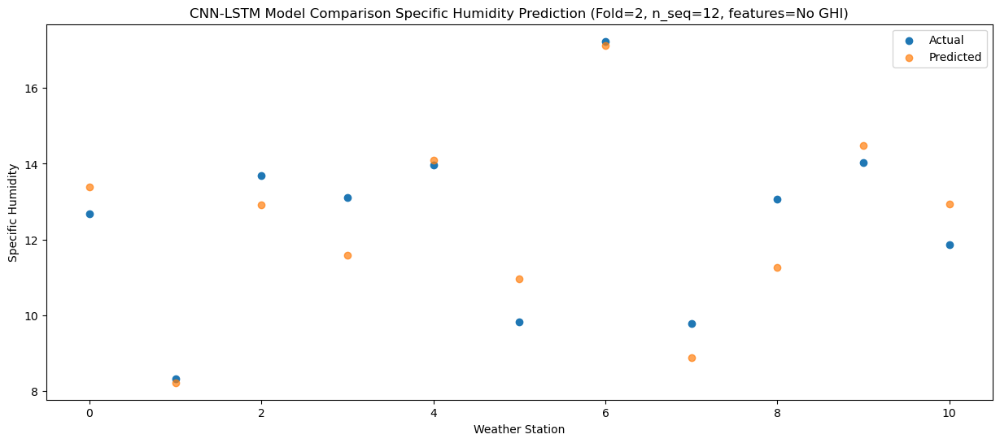

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   10.24  10.951652
1                 1    4.94   5.937074
2                 2   11.02  10.597641
3                 3   10.14  10.033917
4                 4   11.44  11.411336
5                 5    8.25   8.353935
6                 6   14.62  14.544923
7                 7    6.07   6.935332
8                 8   10.27   9.694407
9                 9   11.86  12.228792
10               10   10.14  10.741493


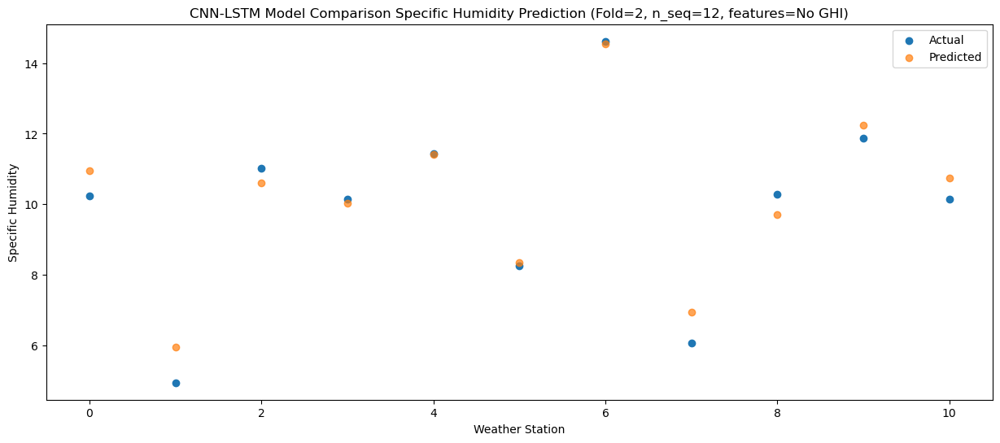

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    5.05   5.491759
1                 1    2.51   3.351261
2                 2    7.07   5.729942
3                 3    5.69   5.293947
4                 4    5.78   5.833753
5                 5    4.06   3.665411
6                 6   10.63  10.071997
7                 7    4.42   5.026195
8                 8    9.73   8.703376
9                 9    6.30   6.552741
10               10    4.78   5.070033


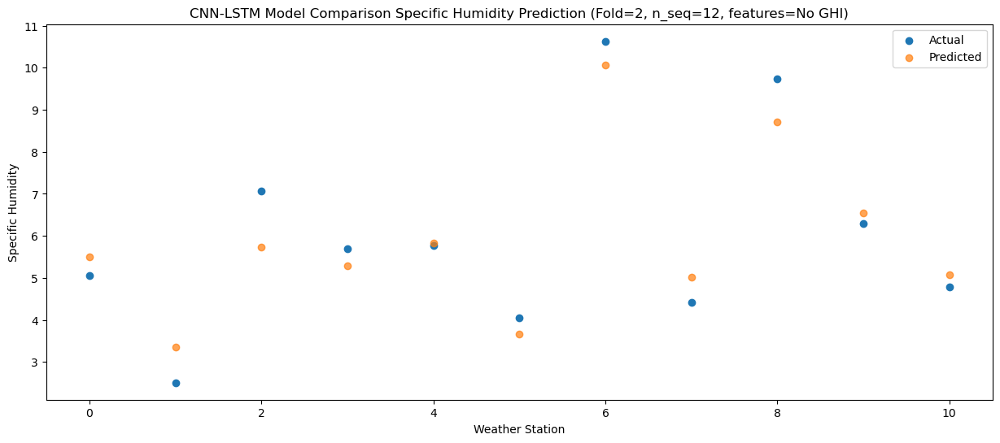

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    7.45   6.792622
1                 1    1.45   2.799533
2                 2    8.47   7.299919
3                 3    5.33   4.386089
4                 4    9.06   8.148017
5                 5    6.93   5.139856
6                 6   13.13  11.096001
7                 7    4.55   4.181692
8                 8    9.55   7.301693
9                 9    8.15   7.761501
10               10    6.34   6.119953


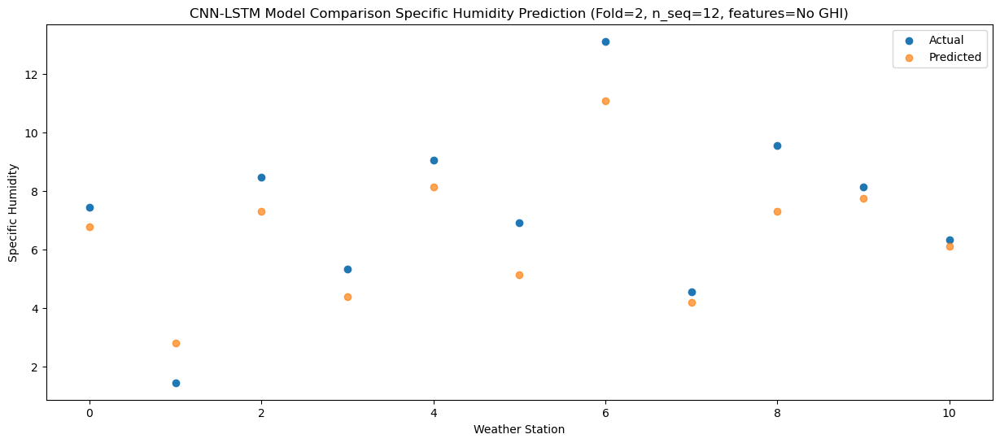

Model: "sequential_503"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_503 (Conv1D)         (None, 1, 512)            1008640   
                                                                 
 max_pooling1d_503 (MaxPooli  (None, 1, 512)           0         
 ng1D)                                                           
                                                                 
 dropout_1509 (Dropout)      (None, 1, 512)            0         
                                                                 
 lstm_1006 (LSTM)            (None, 1, 512)            2099200   
                                                                 
 dropout_1510 (Dropout)      (None, 1, 512)            0         
                                                                 
 lstm_1007 (LSTM)            (None, 512)               2099200   
                                                    

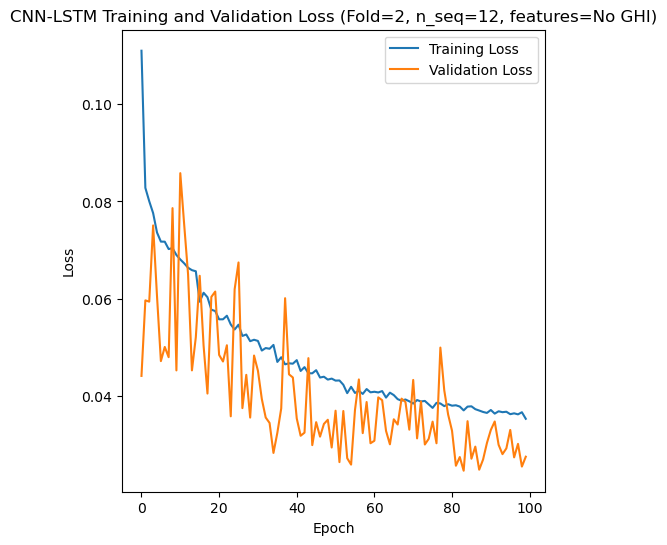

Epoch 1/100
84/84 [==============================] - 25s 117ms/step - loss: 0.1058 - accuracy: 0.6667 - mae: 0.0904 - rmse: 0.1058 - mape: 19.3846 - pearson: 0.6987 - val_loss: 0.0793 - val_accuracy: 0.9000 - val_mae: 0.0634 - val_rmse: 0.0793 - val_mape: 13.5822 - val_pearson: 0.7002
Epoch 2/100
84/84 [==============================] - 4s 51ms/step - loss: 0.0739 - accuracy: 0.6310 - mae: 0.0590 - rmse: 0.0739 - mape: 13.2603 - pearson: 0.7910 - val_loss: 0.0993 - val_accuracy: 0.1000 - val_mae: 0.0772 - val_rmse: 0.0993 - val_mape: 17.8176 - val_pearson: 0.6352
Epoch 3/100
84/84 [==============================] - 5s 63ms/step - loss: 0.0747 - accuracy: 0.6310 - mae: 0.0602 - rmse: 0.0747 - mape: 13.7598 - pearson: 0.7810 - val_loss: 0.0782 - val_accuracy: 0.9000 - val_mae: 0.0591 - val_rmse: 0.0782 - val_mape: 13.0595 - val_pearson: 0.6830
Epoch 4/100
84/84 [==============================] - 5s 57ms/step - loss: 0.0728 - accuracy: 0.6786 - mae: 0.0575 - rmse: 0.0728 - mape: 13.3266 -

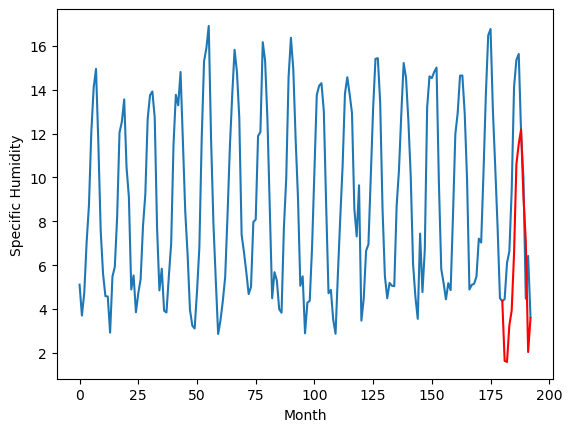

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.64		2.77		0.13
2.08		2.02		-0.06
4.59		4.67		0.08
5.76		5.45		-0.31
9.28		9.10		-0.18
13.81		12.83		-0.98
14.69		13.83		-0.86
14.86		13.96		-0.90
10.89		10.31		-0.58
8.70		7.98		-0.72
4.27		3.54		-0.73
5.24		4.82		-0.42
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.43, 2.7704294915497303, 2.016831695586443, 4.665707647353411, 5.452776371985674, 9.10314935401082, 12.834118544608355, 13.829312383681536, 13.962783559709788, 10.308473810106516, 7.983292802721262, 3.5389411295950417, 4.823255642801524]


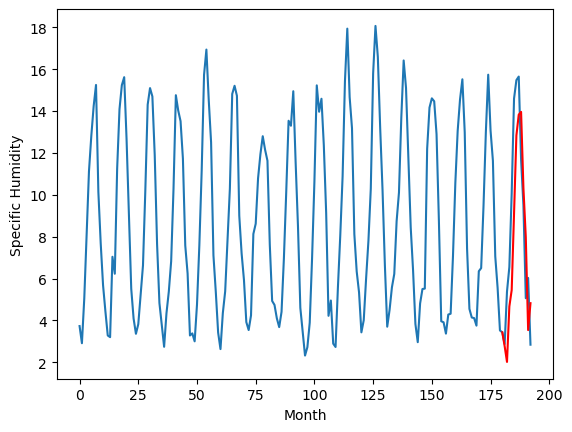

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
6.37		6.29		-0.08
6.31		6.65		0.34
6.39		6.69		0.30
7.01		6.58		-0.43
7.41		8.71		1.30
9.86		10.60		0.74
10.56		11.53		0.97
10.09		11.51		1.42
8.80		10.24		1.44
7.66		8.52		0.86
8.24		7.66		-0.58
6.74		6.36		-0.38
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.43, 6.288424216508865, 6.649023704528808, 6.6877990218997, 6.580935560464859, 8.706108652353286, 10.596818290948868, 11.53357078909874, 11.511766245886683, 10.2373291759938, 8.519370725676417, 7.659850767180323, 6.358297279402613]


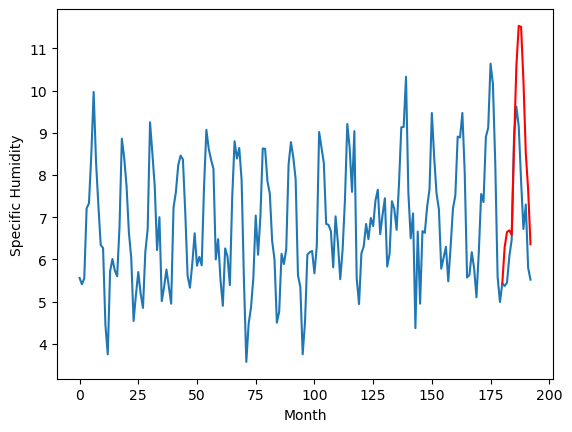

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.44		3.56		0.12
3.37		3.17		-0.20
4.67		4.91		0.24
5.86		5.87		0.01
8.39		8.29		-0.10
13.81		12.62		-1.19
14.44		13.66		-0.78
15.32		14.43		-0.89
11.85		11.00		-0.85
9.79		9.19		-0.60
4.10		4.08		-0.02
5.24		5.04		-0.20
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.21, 3.5559433019161224, 3.171494415998459, 4.91120832324028, 5.87172257065773, 8.292922130823136, 12.622831455469132, 13.66440211892128, 14.42556094288826, 11.003109685182572, 9.187045923471452, 4.084954611063004, 5.035145453214646]


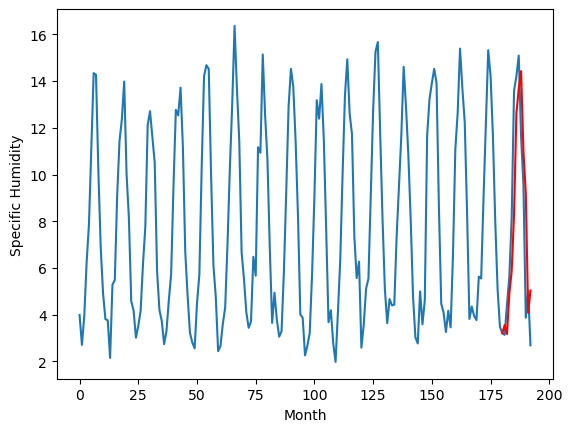

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.91		5.02		0.11
4.08		4.29		0.21
6.56		6.44		-0.12
7.62		7.43		-0.19
10.04		10.36		0.32
14.50		14.46		-0.04
16.45		15.56		-0.89
16.54		16.04		-0.50
12.77		12.36		-0.41
10.82		10.40		-0.42
5.70		5.77		0.07
6.40		6.37		-0.03
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.04, 5.0206614962220195, 4.288456284105778, 6.438366495668888, 7.429714464247227, 10.355621360838413, 14.45579388052225, 15.556645058691501, 16.043927543461322, 12.360966556370258, 10.403154843151569, 5.766959183514118, 6.365399949848651]


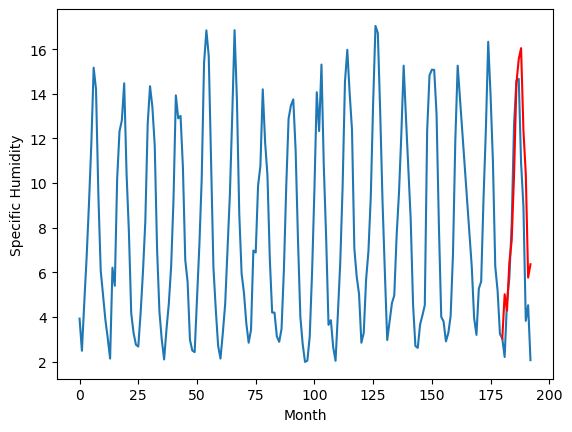

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.42		3.56		0.14
2.90		2.91		0.01
4.93		4.85		-0.08
6.23		5.93		-0.30
8.47		8.49		0.02
13.69		12.86		-0.83
14.94		13.95		-0.99
15.11		14.66		-0.45
11.81		10.98		-0.83
10.19		9.19		-1.00
4.32		4.19		-0.13
5.37		4.85		-0.52
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.91, 3.5564461010694504, 2.907685782313347, 4.849723126292229, 5.92908456504345, 8.490273978114129, 12.857491518855095, 13.954248334765435, 14.65803119122982, 10.980056967139245, 9.186373438239098, 4.194192137122155, 4.852549518942833]


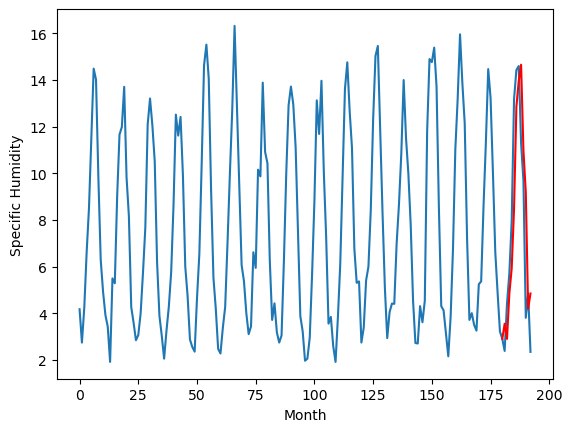

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.73		5.81		0.08
5.79		5.75		-0.04
6.10		6.49		0.39
6.57		6.69		0.12
7.97		9.23		1.26
9.30		11.60		2.30
11.75		12.61		0.86
10.32		12.61		2.29
8.62		10.59		1.97
7.53		8.76		1.23
6.82		7.09		0.27
6.11		6.15		0.04
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[1.6, 5.812134650945663, 5.750211817622184, 6.4874339526891704, 6.691183788180351, 9.231661540865897, 11.599921686053275, 12.61165247619152, 12.606368394512682, 10.588456960339098, 8.756730766911058, 7.089875670094042, 6.149514349121599]


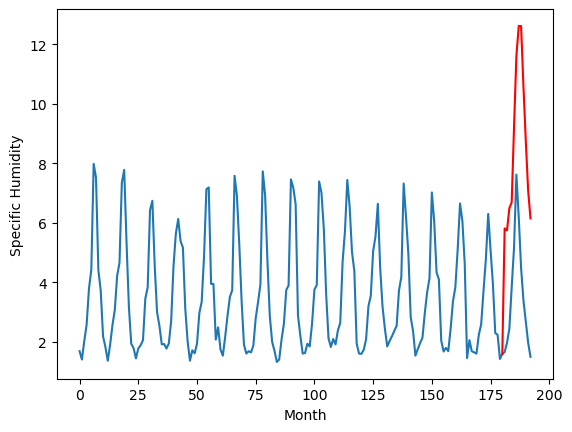

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.80		4.36		-0.44
4.32		4.53		0.21
4.62		4.80		0.18
4.31		4.71		0.40
4.87		7.11		2.24
6.29		8.94		2.65
11.65		9.92		-1.73
9.22		9.75		0.53
7.50		8.28		0.78
6.40		6.48		0.08
5.13		5.72		0.59
5.27		4.34		-0.93
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.86, 4.361963113546372, 4.529474859833718, 4.804679011702538, 4.709210103154183, 7.111352389454842, 8.935865109562874, 9.917383735775948, 9.745758091807366, 8.281463300585747, 6.483539854884148, 5.724471008181572, 4.338518416285515]


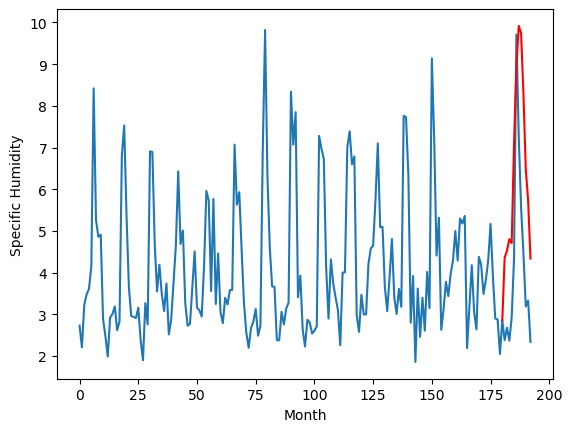

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.60		4.30		-0.30
4.25		4.90		0.65
3.90		4.78		0.88
4.83		4.66		-0.17
5.27		6.58		1.31
6.70		8.56		1.86
7.18		9.42		2.24
7.57		9.53		1.96
6.93		8.41		1.48
5.90		6.71		0.81
6.12		5.59		-0.53
4.87		4.60		-0.27
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.65, 4.299546145200729, 4.898275994062423, 4.782807156741619, 4.6553762558102605, 6.576029241383075, 8.564673483669758, 9.42443782120943, 9.531322337985038, 8.413541533350944, 6.713002659678459, 5.59337339580059, 4.597407795786857]


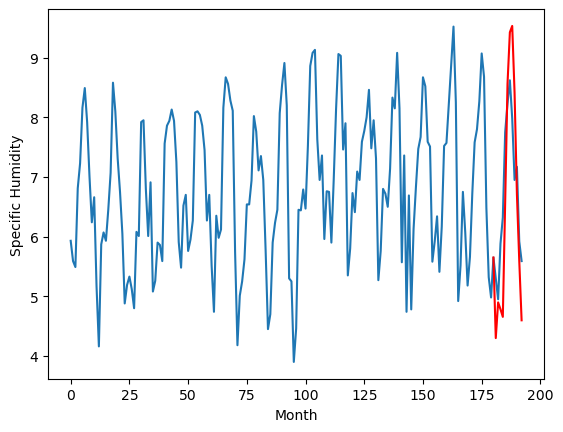

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.09		3.92		0.83
3.24		3.69		0.45
4.02		4.50		0.48
5.40		5.57		0.17
6.97		7.13		0.16
11.87		11.36		-0.51
14.08		12.53		-1.55
14.46		13.57		-0.89
11.86		10.51		-1.35
9.32		9.12		-0.20
4.79		4.75		-0.04
4.49		4.31		-0.18
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.54, 3.9173262047767636, 3.690986194014549, 4.497856654524803, 5.5670812505483624, 7.128227629065513, 11.362539209723472, 12.52564183652401, 13.573860086798668, 10.513606466650963, 9.123210944533348, 4.747509040236473, 4.305759646296501]


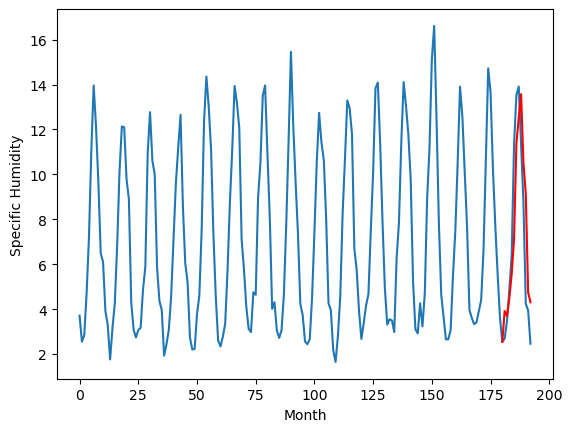

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
1.00		1.42		0.42
0.86		1.10		0.24
2.14		2.11		-0.03
3.55		3.22		-0.33
5.14		4.90		-0.24
10.01		9.26		-0.75
11.70		10.43		-1.27
12.02		11.46		-0.56
9.10		8.23		-0.87
7.20		6.80		-0.40
2.28		2.19		-0.09
2.18		1.93		-0.25
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.51, 1.418606253862381, 1.1025662744045257, 2.109012516736984, 3.2178010070323944, 4.904304894208908, 9.260577591657638, 10.426617296934127, 11.462304028272628, 8.234481009244918, 6.797371300458908, 2.1865824782848353, 1.9316971325874324]


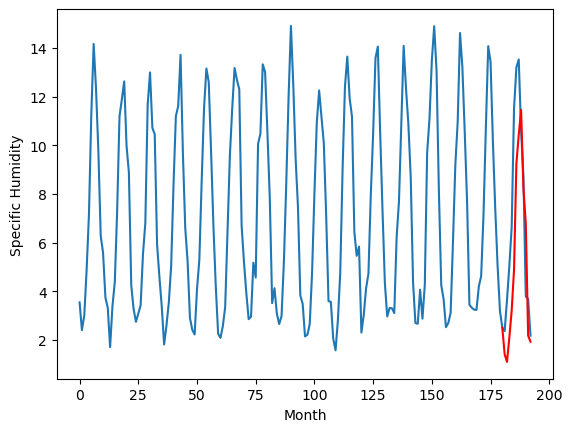

RangeIndex(start=1, stop=12, step=1)
[1.5600000000000005, 2.64, 6.369999999999998, 3.4399999999999995, 4.91, 3.42, 5.73, 4.800000000000001, 4.6, 3.09, 0.9999999999999993]
[1.631359408199787, 2.7704294915497303, 6.288424216508865, 3.5559433019161224, 5.0206614962220195, 3.5564461010694504, 5.812134650945663, 4.361963113546372, 4.299546145200729, 3.9173262047767636, 1.418606253862381]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    1.56   1.631359
1                 1    2.64   2.770429
2                 2    6.37   6.288424
3                 3    3.44   3.555943
4                 4    4.91   5.020661
5                 5    3.42   3.556446
6                 6    5.73   5.812135
7                 7    4.80   4.361963
8                 8    4.60   4.299546
9                 9    3.09   3.917326
10               10    1.00   1.418606


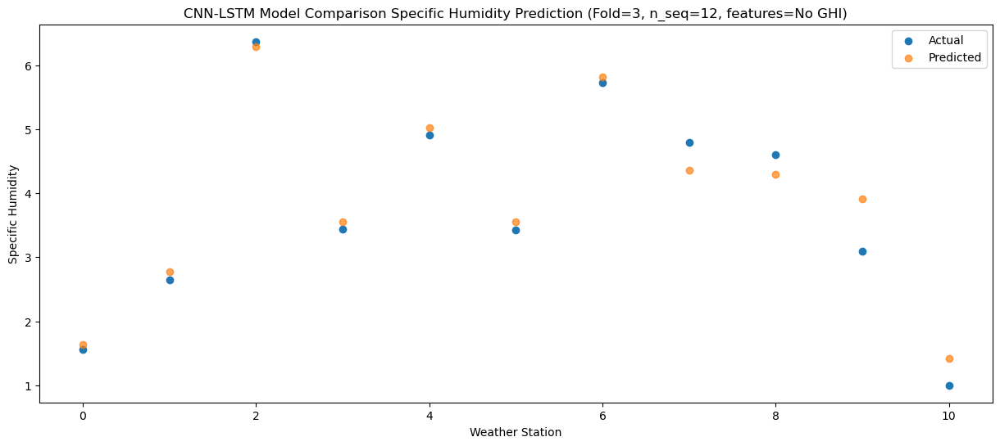

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    1.65   1.586105
1                 1    2.08   2.016832
2                 2    6.31   6.649024
3                 3    3.37   3.171494
4                 4    4.08   4.288456
5                 5    2.90   2.907686
6                 6    5.79   5.750212
7                 7    4.32   4.529475
8                 8    4.25   4.898276
9                 9    3.24   3.690986
10               10    0.86   1.102566


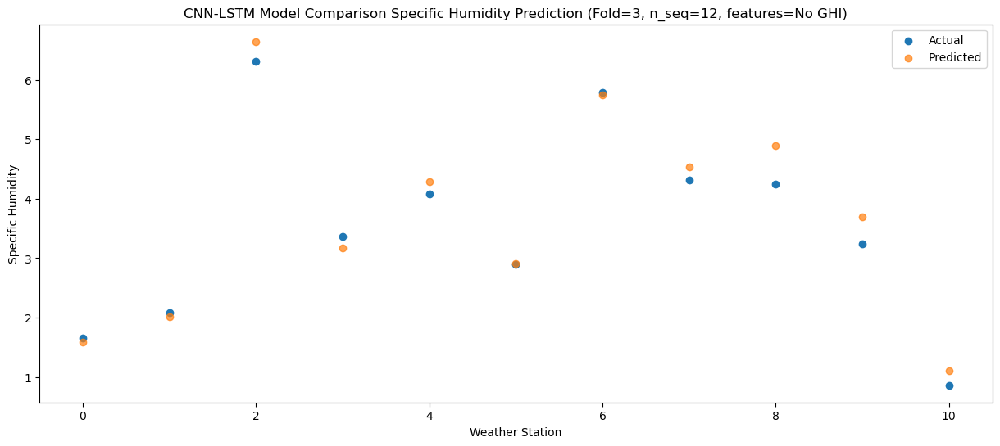

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    3.30   3.248131
1                 1    4.59   4.665708
2                 2    6.39   6.687799
3                 3    4.67   4.911208
4                 4    6.56   6.438366
5                 5    4.93   4.849723
6                 6    6.10   6.487434
7                 7    4.62   4.804679
8                 8    3.90   4.782807
9                 9    4.02   4.497857
10               10    2.14   2.109013


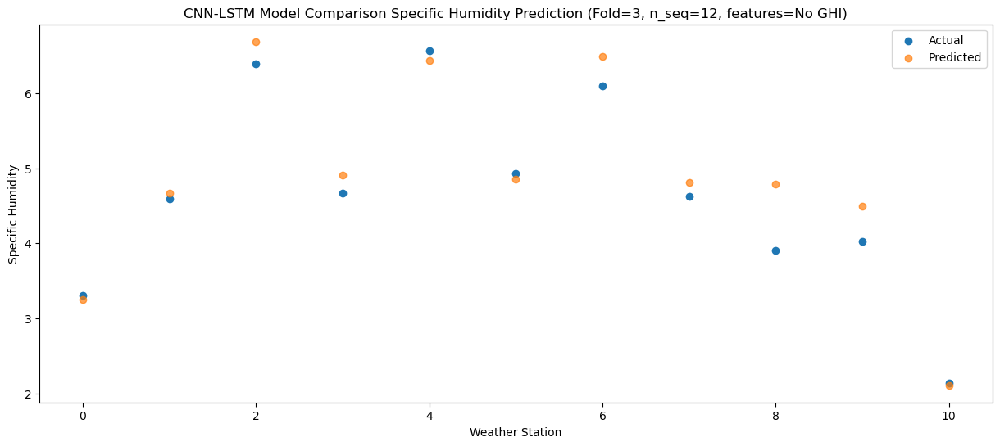

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    3.82   3.937513
1                 1    5.76   5.452776
2                 2    7.01   6.580936
3                 3    5.86   5.871723
4                 4    7.62   7.429714
5                 5    6.23   5.929085
6                 6    6.57   6.691184
7                 7    4.31   4.709210
8                 8    4.83   4.655376
9                 9    5.40   5.567081
10               10    3.55   3.217801


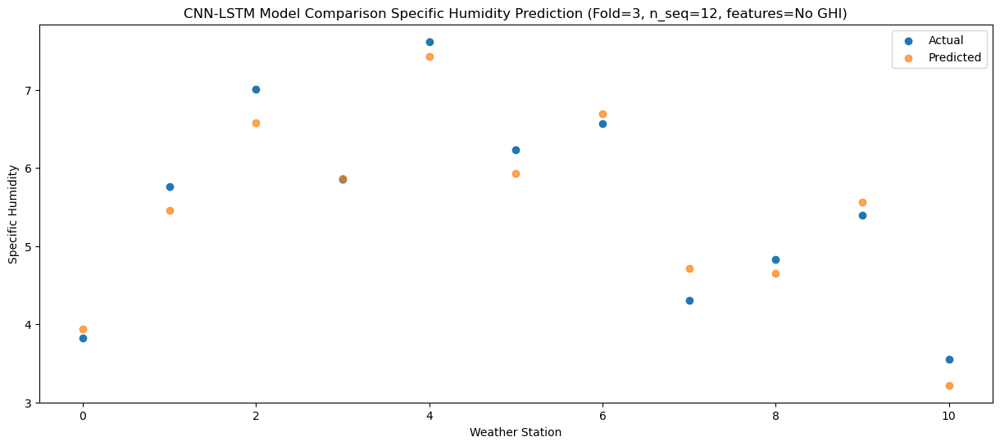

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0    6.60   6.522392
1                 1    9.28   9.103149
2                 2    7.41   8.706109
3                 3    8.39   8.292922
4                 4   10.04  10.355621
5                 5    8.47   8.490274
6                 6    7.97   9.231662
7                 7    4.87   7.111352
8                 8    5.27   6.576029
9                 9    6.97   7.128228
10               10    5.14   4.904305


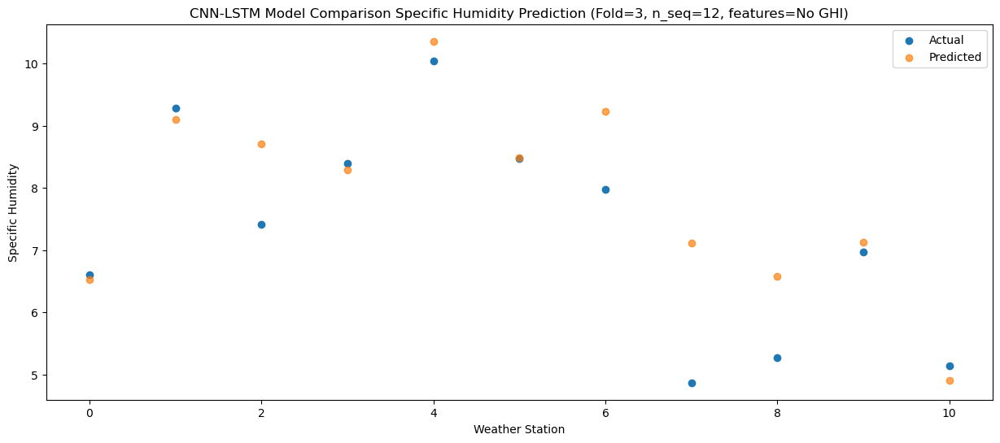

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   11.32  10.594644
1                 1   13.81  12.834119
2                 2    9.86  10.596818
3                 3   13.81  12.622831
4                 4   14.50  14.455794
5                 5   13.69  12.857492
6                 6    9.30  11.599922
7                 7    6.29   8.935865
8                 8    6.70   8.564673
9                 9   11.87  11.362539
10               10   10.01   9.260578


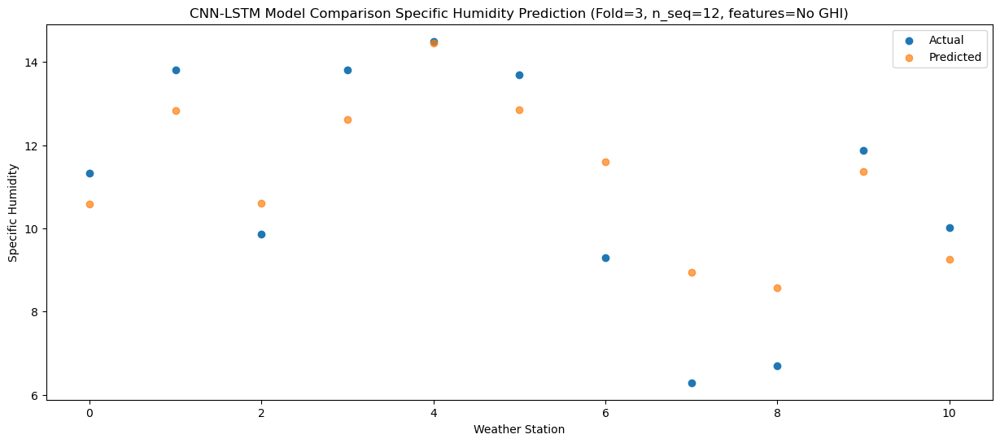

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   12.56  11.528228
1                 1   14.69  13.829312
2                 2   10.56  11.533571
3                 3   14.44  13.664402
4                 4   16.45  15.556645
5                 5   14.94  13.954248
6                 6   11.75  12.611652
7                 7   11.65   9.917384
8                 8    7.18   9.424438
9                 9   14.08  12.525642
10               10   11.70  10.426617


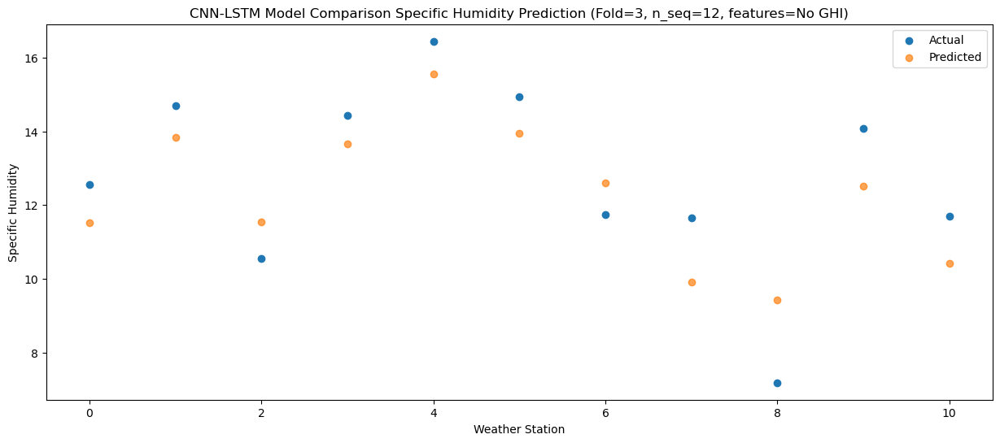

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   12.83  12.188624
1                 1   14.86  13.962784
2                 2   10.09  11.511766
3                 3   15.32  14.425561
4                 4   16.54  16.043928
5                 5   15.11  14.658031
6                 6   10.32  12.606368
7                 7    9.22   9.745758
8                 8    7.57   9.531322
9                 9   14.46  13.573860
10               10   12.02  11.462304


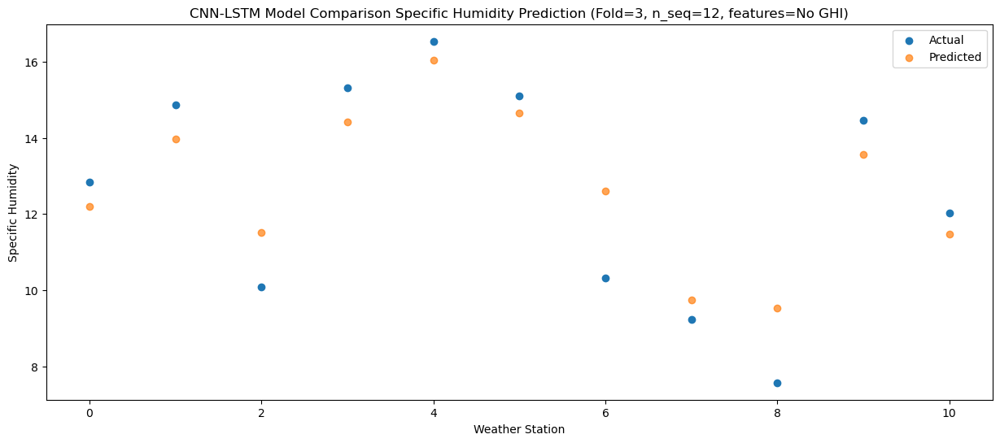

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0    9.21   9.137999
1                 1   10.89  10.308474
2                 2    8.80  10.237329
3                 3   11.85  11.003110
4                 4   12.77  12.360967
5                 5   11.81  10.980057
6                 6    8.62  10.588457
7                 7    7.50   8.281463
8                 8    6.93   8.413542
9                 9   11.86  10.513606
10               10    9.10   8.234481


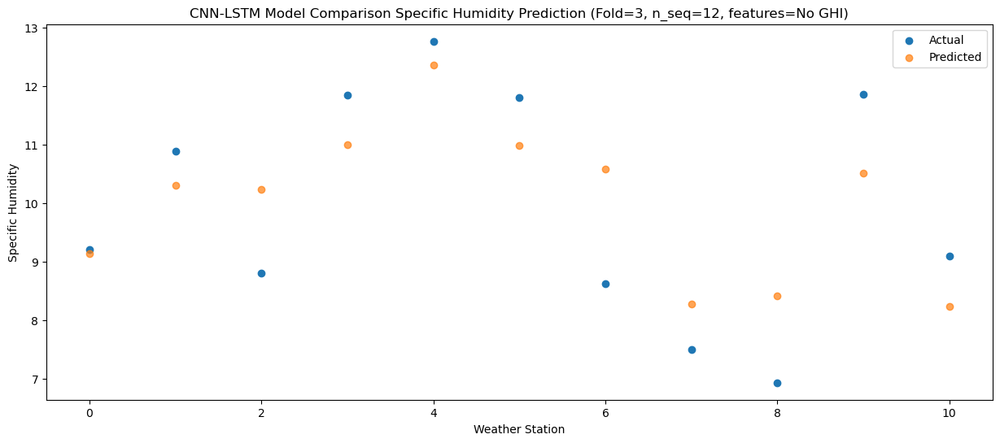

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0    7.17   7.106455
1                 1    8.70   7.983293
2                 2    7.66   8.519371
3                 3    9.79   9.187046
4                 4   10.82  10.403155
5                 5   10.19   9.186373
6                 6    7.53   8.756731
7                 7    6.40   6.483540
8                 8    5.90   6.713003
9                 9    9.32   9.123211
10               10    7.20   6.797371


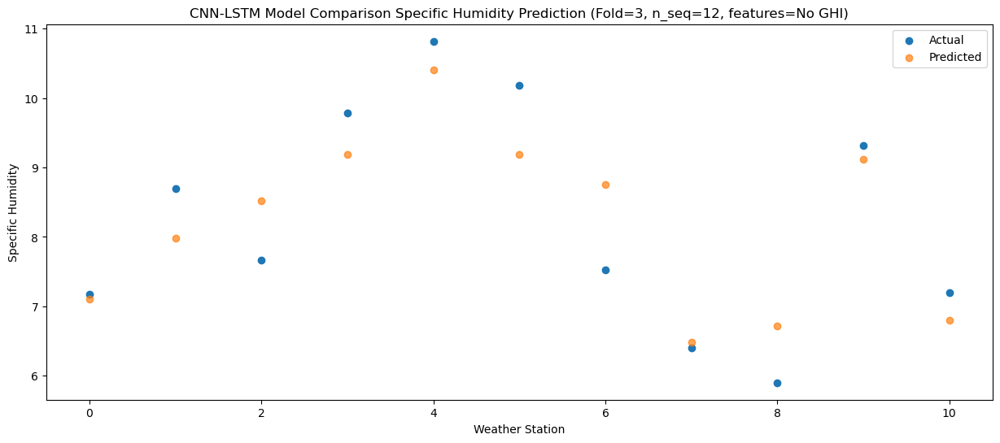

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    1.67   2.037964
1                 1    4.27   3.538941
2                 2    8.24   7.659851
3                 3    4.10   4.084955
4                 4    5.70   5.766959
5                 5    4.32   4.194192
6                 6    6.82   7.089876
7                 7    5.13   5.724471
8                 8    6.12   5.593373
9                 9    4.79   4.747509
10               10    2.28   2.186582


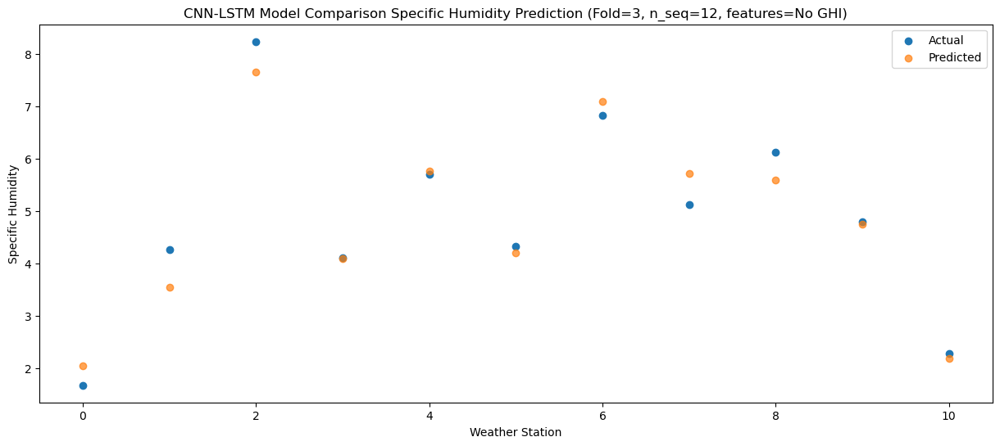

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    3.62   3.582511
1                 1    5.24   4.823256
2                 2    6.74   6.358297
3                 3    5.24   5.035145
4                 4    6.40   6.365400
5                 5    5.37   4.852550
6                 6    6.11   6.149514
7                 7    5.27   4.338518
8                 8    4.87   4.597408
9                 9    4.49   4.305760
10               10    2.18   1.931697


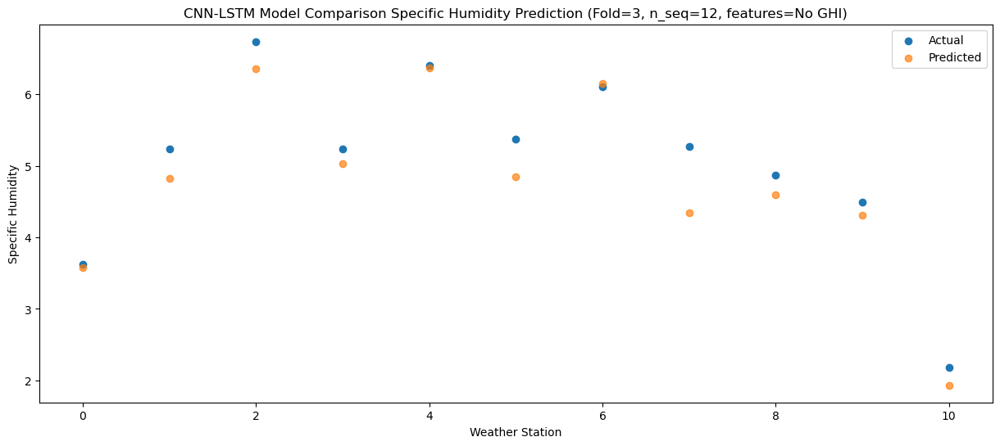

Model: "sequential_504"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_504 (Conv1D)         (None, 1, 512)            1008640   
                                                                 
 max_pooling1d_504 (MaxPooli  (None, 1, 512)           0         
 ng1D)                                                           
                                                                 
 dropout_1512 (Dropout)      (None, 1, 512)            0         
                                                                 
 lstm_1008 (LSTM)            (None, 1, 512)            2099200   
                                                                 
 dropout_1513 (Dropout)      (None, 1, 512)            0         
                                                                 
 lstm_1009 (LSTM)            (None, 512)               2099200   
                                                    

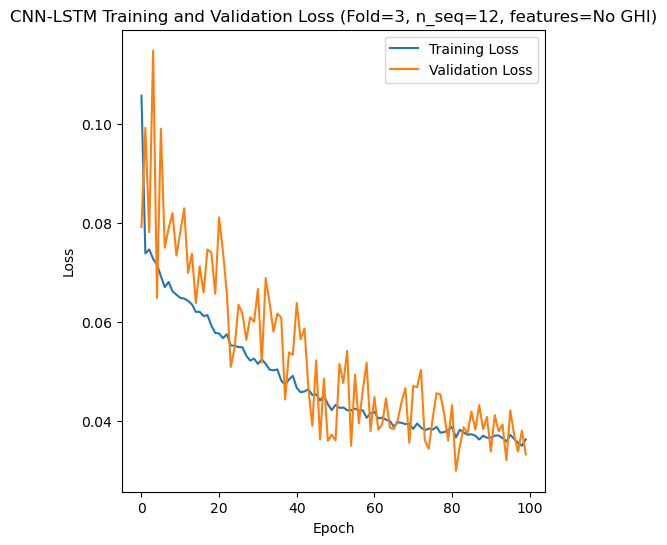

Epoch 1/100
84/84 [==============================] - 26s 123ms/step - loss: 0.1077 - accuracy: 0.6071 - mae: 0.0907 - rmse: 0.1077 - mape: 19.8917 - pearson: 0.6830 - val_loss: 0.0768 - val_accuracy: 0.8000 - val_mae: 0.0628 - val_rmse: 0.0768 - val_mape: 13.3741 - val_pearson: 0.7775
Epoch 2/100
84/84 [==============================] - 6s 74ms/step - loss: 0.0824 - accuracy: 0.7143 - mae: 0.0654 - rmse: 0.0824 - mape: 15.0104 - pearson: 0.7358 - val_loss: 0.0914 - val_accuracy: 0.8000 - val_mae: 0.0796 - val_rmse: 0.0914 - val_mape: 17.0739 - val_pearson: 0.6486
Epoch 3/100
84/84 [==============================] - 6s 66ms/step - loss: 0.0766 - accuracy: 0.6786 - mae: 0.0611 - rmse: 0.0766 - mape: 13.7495 - pearson: 0.7537 - val_loss: 0.0805 - val_accuracy: 0.8000 - val_mae: 0.0645 - val_rmse: 0.0805 - val_mape: 15.1474 - val_pearson: 0.6610
Epoch 4/100
84/84 [==============================] - 5s 57ms/step - loss: 0.0755 - accuracy: 0.7143 - mae: 0.0603 - rmse: 0.0755 - mape: 13.7643 -

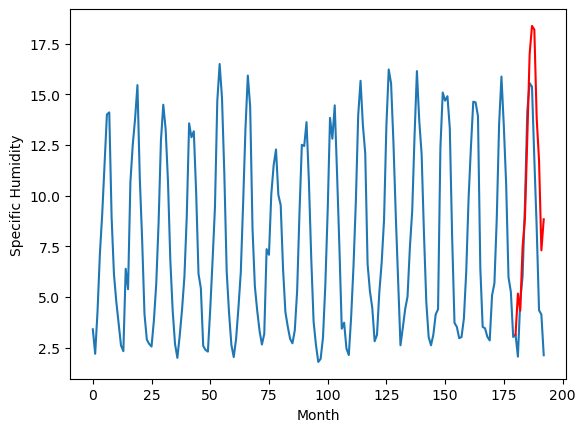

Weather Station 2:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.27		3.99		-0.28
6.26		4.64		-1.62
6.23		6.65		0.42
6.98		7.67		0.69
8.31		10.31		2.00
12.60		14.50		1.90
13.81		15.61		1.80
14.20		15.92		1.72
13.40		13.04		-0.36
10.48		11.11		0.63
5.82		6.01		0.19
7.56		9.70		2.14
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.79, 3.9864244666695594, 4.643912753164768, 6.6450779047608375, 7.6707139816880225, 10.305487474501133, 14.497289499342441, 15.605439862310886, 15.919426670372486, 13.0374491122365, 11.114703288376331, 6.012088885605335, 9.703190675079822]


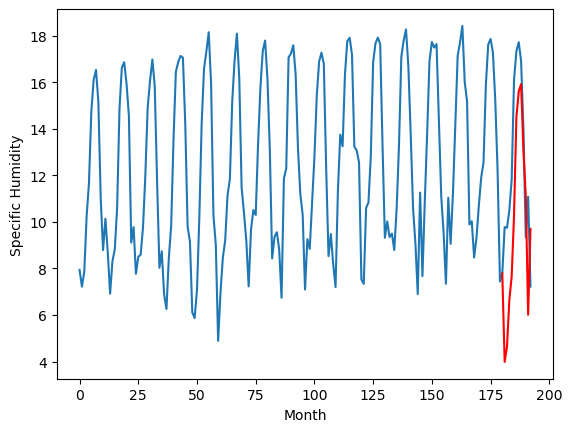

Weather Station 3:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.87		4.13		0.26
3.75		4.15		0.40
6.81		7.49		0.68
7.06		8.58		1.52
10.50		12.61		2.11
14.74		17.07		2.33
16.39		18.31		1.92
16.40		18.28		1.88
13.46		14.33		0.87
10.68		12.09		1.41
5.24		6.31		1.07
8.19		10.55		2.36
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.03, 4.125145133137703, 4.15334669828415, 7.487806479930878, 8.578605930805207, 12.614311497211457, 17.070205013751984, 18.312513630390168, 18.278731073737145, 14.332608665823937, 12.086590494513512, 6.308497156500817, 10.548150267004967]


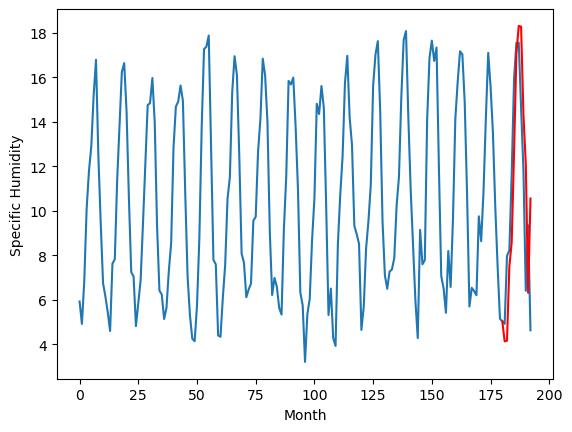

Weather Station 4:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.73		3.98		0.25
3.41		3.35		-0.06
6.07		6.88		0.81
7.36		8.09		0.73
11.36		12.52		1.16
15.05		16.51		1.46
15.62		17.82		2.20
16.01		17.44		1.43
12.00		13.16		1.16
9.15		10.84		1.69
5.53		6.17		0.64
7.39		8.84		1.45
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.41, 3.975342866182327, 3.3465070688724516, 6.875262018442154, 8.088836666345596, 12.523190017938614, 16.509103771448135, 17.822795983552933, 17.44379496216774, 13.163914438486099, 10.839534755945206, 6.1658568346500395, 8.844887014627457]


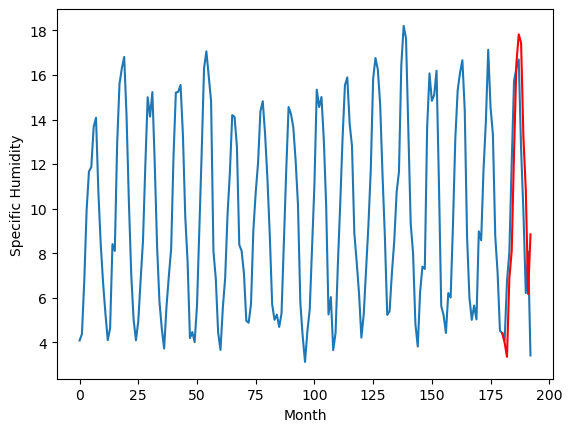

Weather Station 5:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.36		3.53		0.17
2.91		2.84		-0.07
5.49		6.32		0.83
6.85		7.53		0.68
11.14		11.95		0.81
15.02		15.83		0.81
15.40		17.14		1.74
15.51		16.72		1.21
11.61		12.47		0.86
8.88		10.14		1.26
5.27		5.70		0.43
6.68		8.11		1.43
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.29, 3.5326232999563216, 2.8392868131399154, 6.315996655821801, 7.529363521933556, 11.947812446951867, 15.828709968924523, 17.14304901063442, 16.722081193327902, 12.466023930907248, 10.141279944777487, 5.695779094099997, 8.108557948470114]


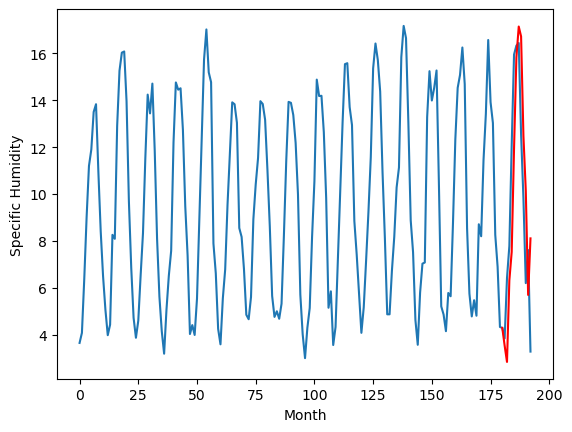

Weather Station 6:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
8.64		8.13		-0.51
8.00		7.48		-0.52
9.49		10.26		0.77
10.45		11.32		0.87
15.00		15.20		0.20
17.30		18.36		1.06
18.33		19.58		1.25
18.05		19.01		0.96
14.80		15.42		0.62
11.75		13.16		1.41
10.03		10.06		0.03
9.18		11.47		2.29
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.47, 8.133117111921312, 7.479892166852952, 10.255564125776292, 11.318393501043321, 15.196069749593736, 18.364157947301866, 19.578985604047777, 19.006531389951707, 15.422871264219285, 13.155749710798265, 10.059995087385179, 11.472212704420091]


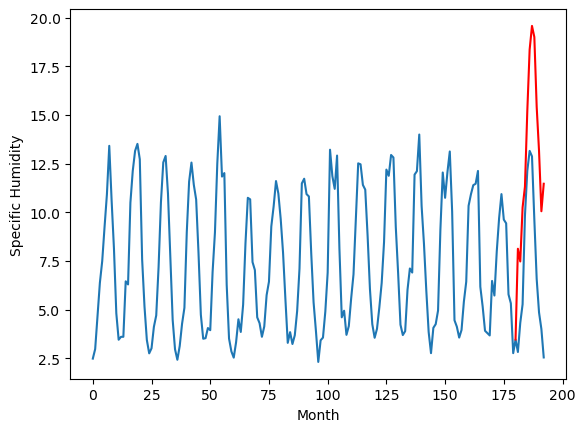

Weather Station 7:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
5.80		5.90		0.10
6.05		6.03		-0.02
7.76		8.75		0.99
8.17		9.96		1.79
11.15		13.31		2.16
15.84		17.88		2.04
17.44		19.14		1.70
17.82		19.37		1.55
14.24		15.66		1.42
12.03		13.66		1.63
6.31		8.04		1.73
8.17		11.58		3.41
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.52, 5.899438744485378, 6.0274137315154075, 8.747584467828274, 9.958410507142544, 13.314784294068813, 17.87677074044943, 19.139438873231413, 19.37497862249613, 15.655726512968542, 13.659303268492224, 8.03550918966532, 11.582911571562292]


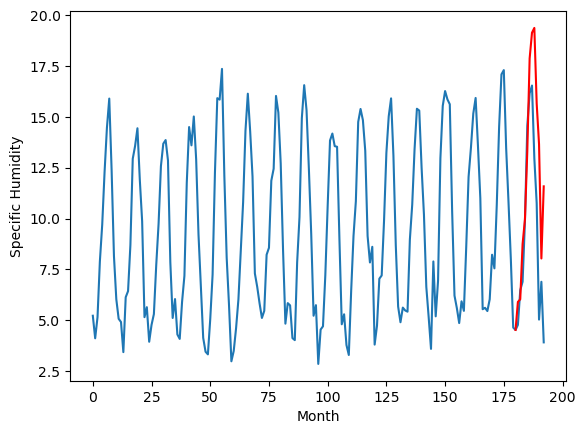

Weather Station 8:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.93		4.08		0.15
3.30		3.54		0.24
5.67		6.83		1.16
6.59		8.17		1.58
9.75		12.20		2.45
14.35		16.56		2.21
15.30		17.91		2.61
15.04		17.82		2.78
11.78		13.51		1.73
9.69		11.39		1.70
5.00		6.29		1.29
6.47		8.91		2.44
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.4, 4.075404270943254, 3.536375268753618, 6.828104957398027, 8.171375140007585, 12.19737468605861, 16.557690485771744, 17.909488662537186, 17.820028341766445, 13.51183656549081, 11.38714984750375, 6.286703623291103, 8.91223267411813]


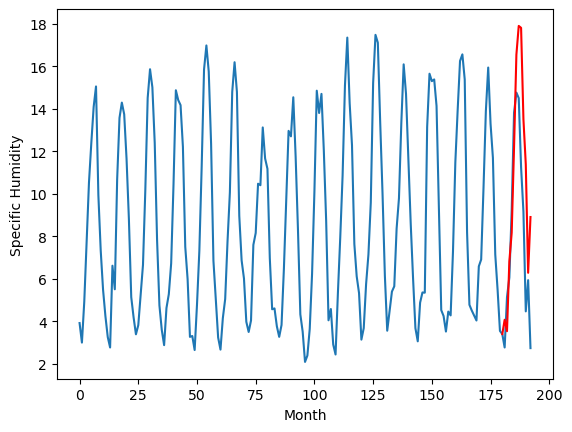

Weather Station 9:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
3.30		3.38		0.08
2.73		2.95		0.22
4.67		5.51		0.84
6.00		7.19		1.19
8.29		10.14		1.85
13.35		14.98		1.63
14.61		16.37		1.76
14.75		16.82		2.07
11.27		12.66		1.39
10.12		11.02		0.90
4.35		5.64		1.29
5.06		7.57		2.51
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.82, 3.376502537727356, 2.9522548854351043, 5.507513874769211, 7.18594121336937, 10.136982673406601, 14.9798200070858, 16.37248527407646, 16.823297643661498, 12.659389638900755, 11.024302268028258, 5.6448576688766465, 7.573123121261595]


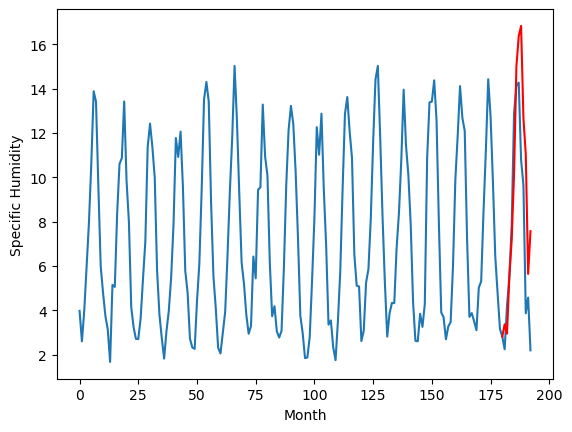

Weather Station 10:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
2.17		2.27		0.10
1.53		1.64		0.11
3.90		4.48		0.58
5.21		6.13		0.92
7.83		9.45		1.62
12.58		14.17		1.59
13.98		15.59		1.61
14.23		15.86		1.63
10.20		11.50		1.30
8.33		9.75		1.42
3.04		4.55		1.51
3.58		6.32		2.74
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.86, 2.270884310603142, 1.6412165516614916, 4.4773862713575365, 6.132778918147087, 9.451358115077019, 14.172613417506218, 15.58847192466259, 15.864147847294808, 11.498775666356087, 9.745986288189888, 4.545440977215767, 6.319210951924324]


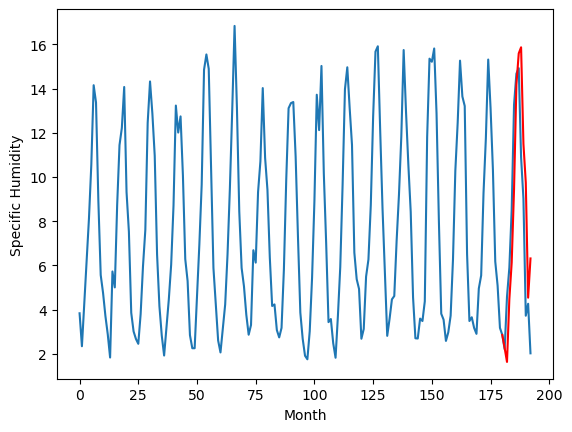

Weather Station 11:
Actual S.H.	Predicted S.H.	Difference
-----------	--------------	----------
4.84		4.81		-0.03
4.27		4.49		0.22
5.56		6.48		0.92
7.23		8.27		1.04
8.83		10.57		1.74
13.84		15.42		1.58
15.11		16.80		1.69
15.98		17.48		1.50
12.22		13.60		1.38
11.21		12.18		0.97
5.97		7.06		1.09
5.93		8.36		2.43
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.61, 4.8118140709400175, 4.4884231400489805, 6.482533605098724, 8.265192182064055, 10.570520312786101, 15.420057685375212, 16.803637058734893, 17.478256793022155, 13.60100492954254, 12.179957003593444, 7.062217803001403, 8.364866466522216]


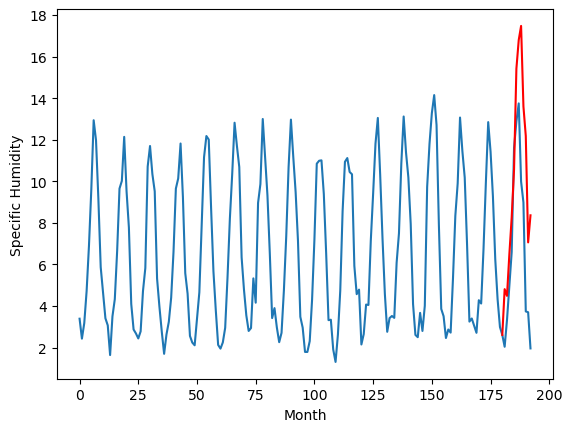

RangeIndex(start=1, stop=12, step=1)
[5.34, 4.269999999999999, 3.870000000000001, 3.7300000000000004, 3.3600000000000003, 8.64, 5.8, 3.93, 3.3000000000000003, 2.1699999999999995, 4.839999999999999]
[5.165347405970096, 3.9864244666695594, 4.125145133137703, 3.975342866182327, 3.5326232999563216, 8.133117111921312, 5.899438744485378, 4.075404270943254, 3.376502537727356, 2.270884310603142, 4.8118140709400175]
Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    5.34   5.165347
1                 1    4.27   3.986424
2                 2    3.87   4.125145
3                 3    3.73   3.975343
4                 4    3.36   3.532623
5                 5    8.64   8.133117
6                 6    5.80   5.899439
7                 7    3.93   4.075404
8                 8    3.30   3.376503
9                 9    2.17   2.270884
10               10    4.84   4.811814


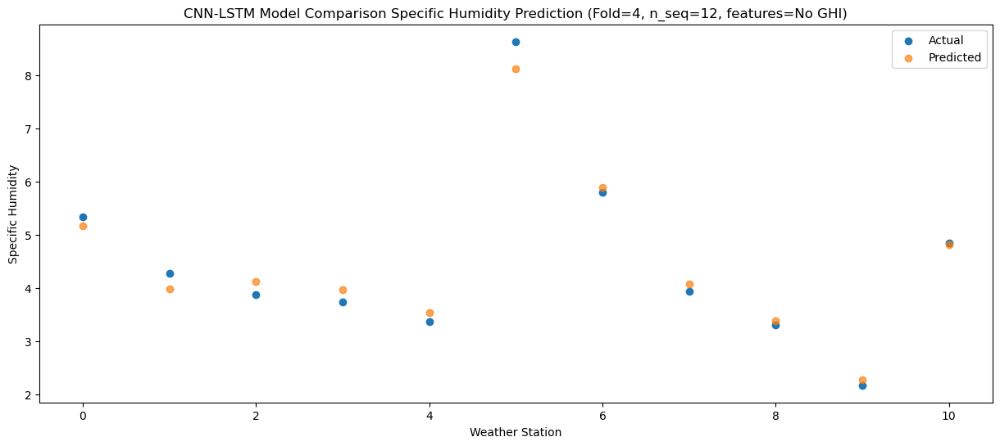

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    4.25   4.320322
1                 1    6.26   4.643913
2                 2    3.75   4.153347
3                 3    3.41   3.346507
4                 4    2.91   2.839287
5                 5    8.00   7.479892
6                 6    6.05   6.027414
7                 7    3.30   3.536375
8                 8    2.73   2.952255
9                 9    1.53   1.641217
10               10    4.27   4.488423


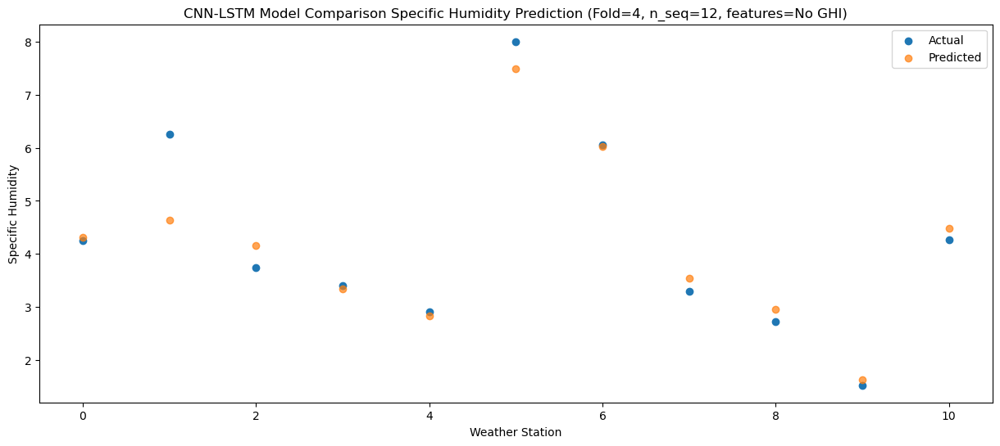

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0    7.01   7.471152
1                 1    6.23   6.645078
2                 2    6.81   7.487806
3                 3    6.07   6.875262
4                 4    5.49   6.315997
5                 5    9.49  10.255564
6                 6    7.76   8.747584
7                 7    5.67   6.828105
8                 8    4.67   5.507514
9                 9    3.90   4.477386
10               10    5.56   6.482534


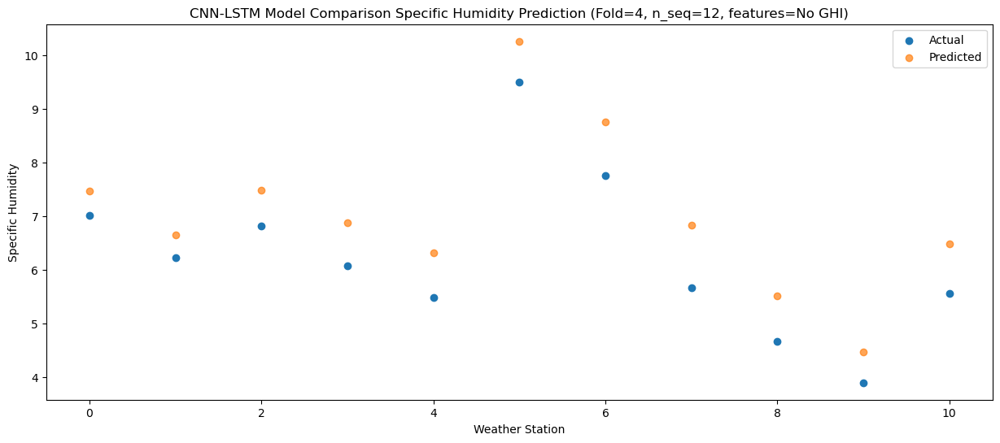

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0    8.22   8.885041
1                 1    6.98   7.670714
2                 2    7.06   8.578606
3                 3    7.36   8.088837
4                 4    6.85   7.529364
5                 5   10.45  11.318394
6                 6    8.17   9.958411
7                 7    6.59   8.171375
8                 8    6.00   7.185941
9                 9    5.21   6.132779
10               10    7.23   8.265192


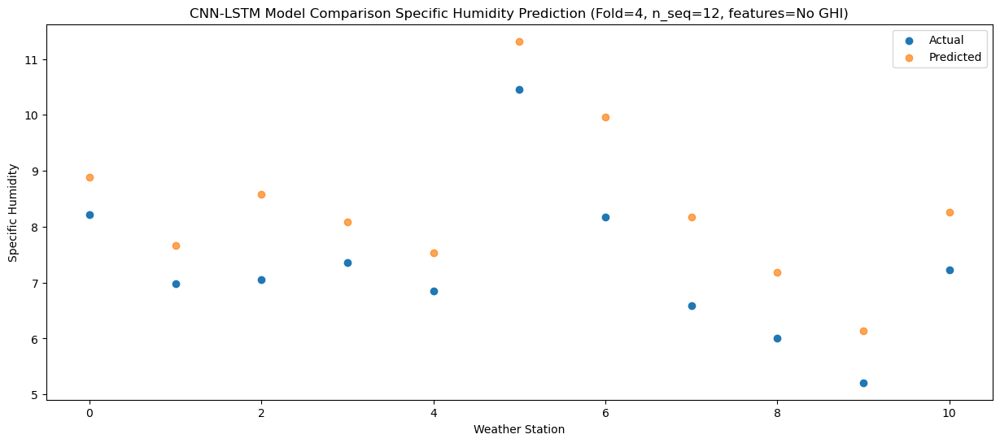

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   11.78  12.855454
1                 1    8.31  10.305487
2                 2   10.50  12.614311
3                 3   11.36  12.523190
4                 4   11.14  11.947812
5                 5   15.00  15.196070
6                 6   11.15  13.314784
7                 7    9.75  12.197375
8                 8    8.29  10.136983
9                 9    7.83   9.451358
10               10    8.83  10.570520


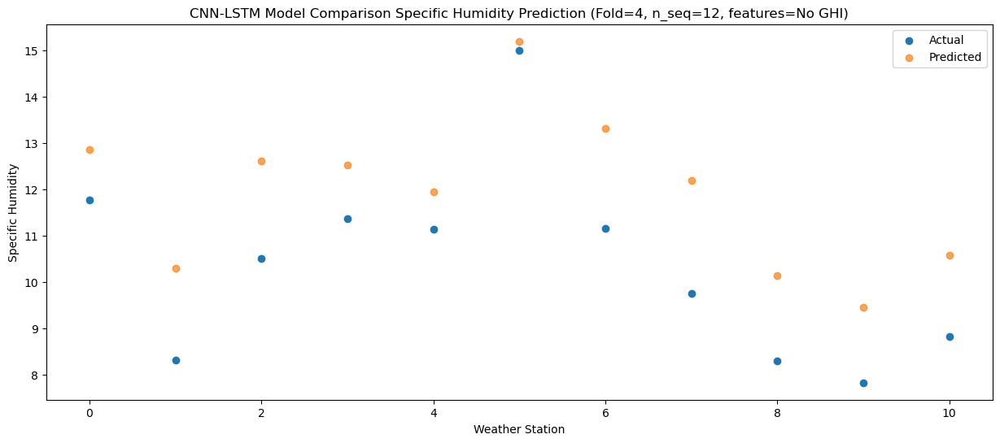

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   16.37  16.985751
1                 1   12.60  14.497289
2                 2   14.74  17.070205
3                 3   15.05  16.509104
4                 4   15.02  15.828710
5                 5   17.30  18.364158
6                 6   15.84  17.876771
7                 7   14.35  16.557690
8                 8   13.35  14.979820
9                 9   12.58  14.172613
10               10   13.84  15.420058


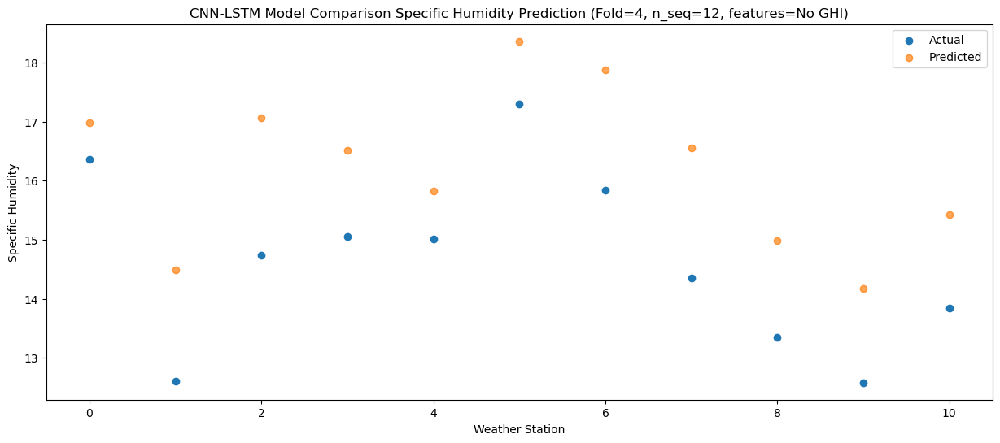

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   17.76  18.380219
1                 1   13.81  15.605440
2                 2   16.39  18.312514
3                 3   15.62  17.822796
4                 4   15.40  17.143049
5                 5   18.33  19.578986
6                 6   17.44  19.139439
7                 7   15.30  17.909489
8                 8   14.61  16.372485
9                 9   13.98  15.588472
10               10   15.11  16.803637


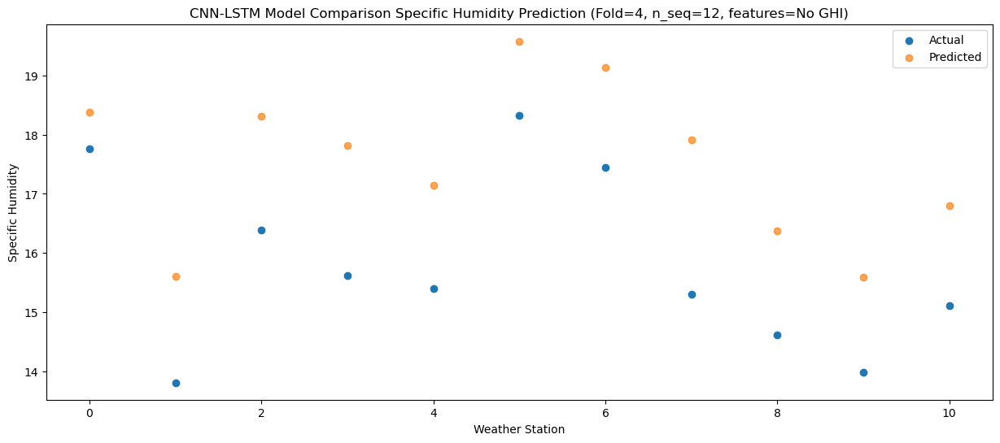

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   17.58  18.197718
1                 1   14.20  15.919427
2                 2   16.40  18.278731
3                 3   16.01  17.443795
4                 4   15.51  16.722081
5                 5   18.05  19.006531
6                 6   17.82  19.374979
7                 7   15.04  17.820028
8                 8   14.75  16.823298
9                 9   14.23  15.864148
10               10   15.98  17.478257


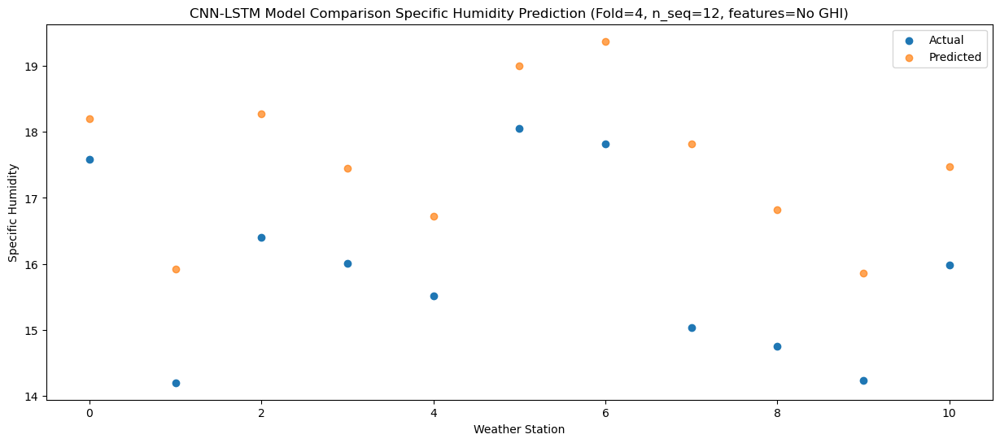

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   14.00  13.818587
1                 1   13.40  13.037449
2                 2   13.46  14.332609
3                 3   12.00  13.163914
4                 4   11.61  12.466024
5                 5   14.80  15.422871
6                 6   14.24  15.655727
7                 7   11.78  13.511837
8                 8   11.27  12.659390
9                 9   10.20  11.498776
10               10   12.22  13.601005


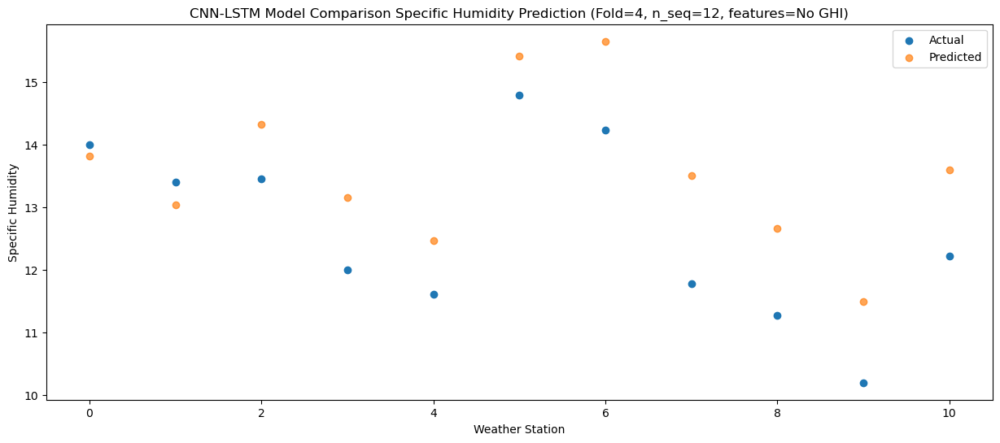

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   10.63  11.741785
1                 1   10.48  11.114703
2                 2   10.68  12.086590
3                 3    9.15  10.839535
4                 4    8.88  10.141280
5                 5   11.75  13.155750
6                 6   12.03  13.659303
7                 7    9.69  11.387150
8                 8   10.12  11.024302
9                 9    8.33   9.745986
10               10   11.21  12.179957


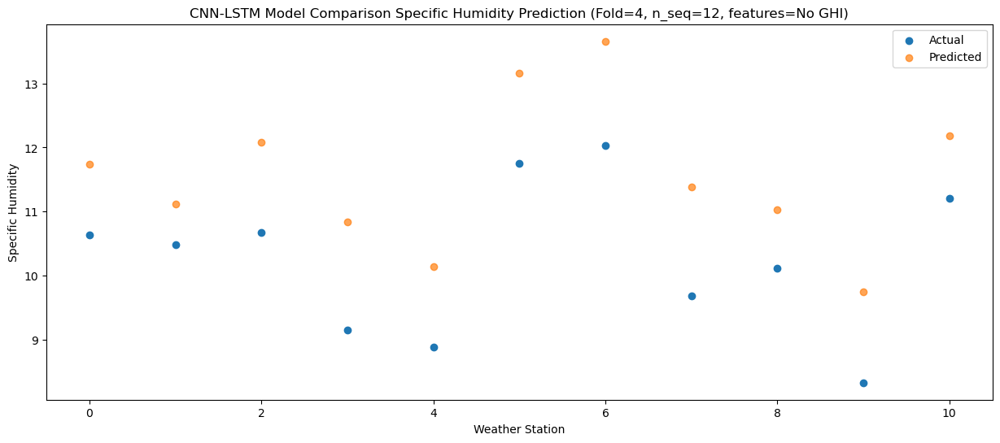

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    6.54   7.298293
1                 1    5.82   6.012089
2                 2    5.24   6.308497
3                 3    5.53   6.165857
4                 4    5.27   5.695779
5                 5   10.03  10.059995
6                 6    6.31   8.035509
7                 7    5.00   6.286704
8                 8    4.35   5.644858
9                 9    3.04   4.545441
10               10    5.97   7.062218


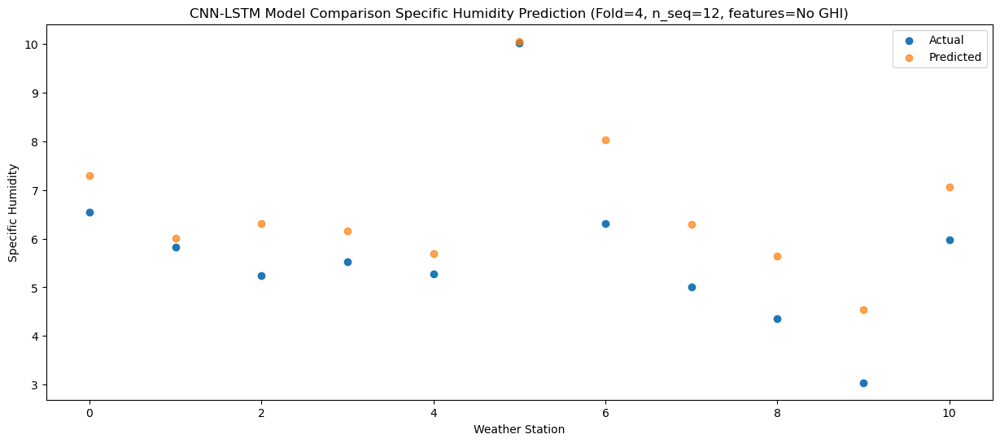

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    6.33   8.831466
1                 1    7.56   9.703191
2                 2    8.19  10.548150
3                 3    7.39   8.844887
4                 4    6.68   8.108558
5                 5    9.18  11.472213
6                 6    8.17  11.582912
7                 7    6.47   8.912233
8                 8    5.06   7.573123
9                 9    3.58   6.319211
10               10    5.93   8.364866


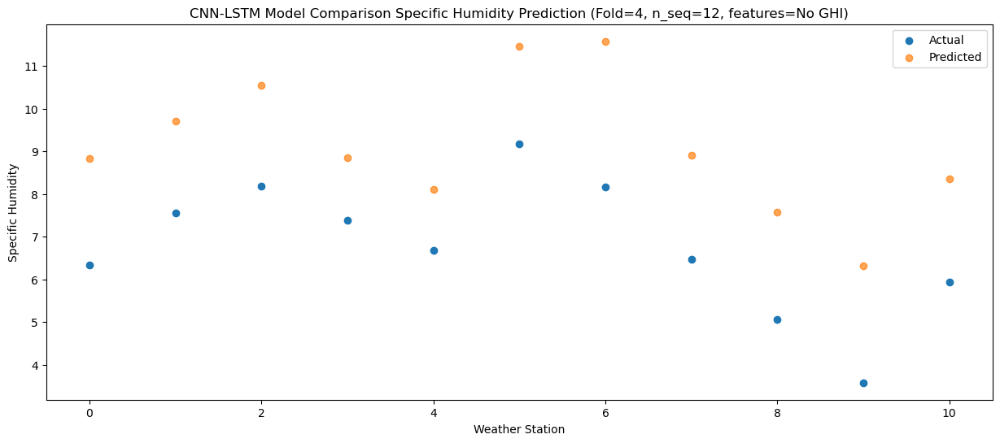

Model: "sequential_505"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_505 (Conv1D)         (None, 1, 512)            1008640   
                                                                 
 max_pooling1d_505 (MaxPooli  (None, 1, 512)           0         
 ng1D)                                                           
                                                                 
 dropout_1515 (Dropout)      (None, 1, 512)            0         
                                                                 
 lstm_1010 (LSTM)            (None, 1, 512)            2099200   
                                                                 
 dropout_1516 (Dropout)      (None, 1, 512)            0         
                                                                 
 lstm_1011 (LSTM)            (None, 512)               2099200   
                                                    

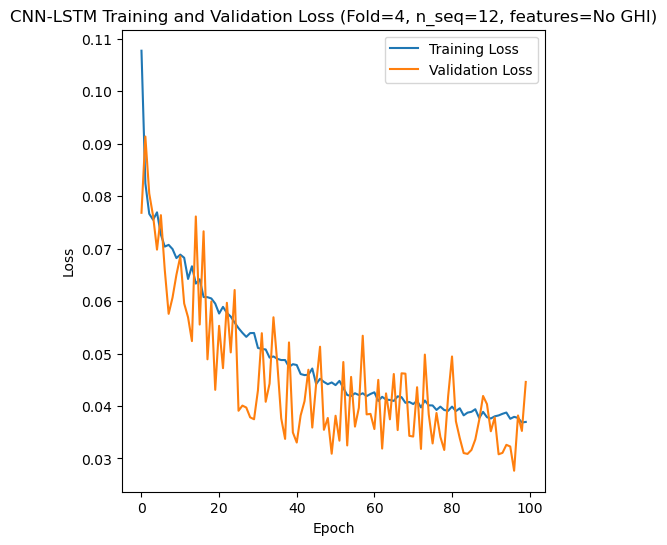

[[0.23898237458923302, 0.4506641776150744, 0.40699356876632153, 0.5665907366170738, 0.4679530954241919, 0.4433832910873135, 0.5074703971420331, 0.6472533076507382, 0.5944813163142033, 0.45203432700024654, 0.5711254649179036, 0.7650467341907263], [0.3021584601262568, 0.2695825868497605, 0.5105207545021692, 0.6584015964816842, 1.3873559742641994, 1.0149034886291863, 0.9987905268369118, 1.158493220168101, 0.7650533183146262, 0.8118157638439701, 0.8232779896676156, 0.9995470125308369], [0.3066845623084222, 0.6808218352567855, 0.6072452398564256, 1.1003376538291707, 1.521226133638596, 1.273036137882335, 0.7665490851148185, 0.8312994908553044, 0.9570860853448946, 0.5465109366955903, 0.6670741505265303, 1.2819305630679947], [0.33325662496119846, 0.29137276496779324, 0.3528319151525092, 0.2631985233170985, 0.9642896471432528, 1.372197302671965, 1.2772113339417261, 1.1652202526229722, 1.0967269828178294, 0.6858611990900356, 0.3978409518586249, 0.3897342249969556], [0.2277947707686927, 0.5414436

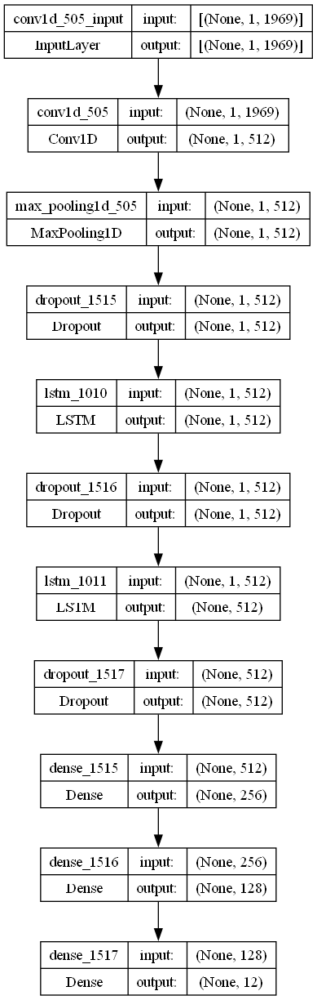

In [9]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.utils import plot_model

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

# fit the best CNN-LSTM model using parameters found by Optuna
def create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters from the best model
    filters = 512
    lr = 0.12979507641643676
    optimizer = SGD(learning_rate = lr)
    activation_function = 'tanh'
    lstm_units = 512
    dropout_rate = 0.17343799773232224

    # design network
    model = Sequential()
    model.add(Conv1D(filters=filters, kernel_size=1, activation='relu', input_shape=(X.shape[1], X.shape[2]))) # CNN-LSTM only
    model.add(MaxPooling1D(pool_size=1)) # CNN-LSTM only
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units, return_sequences=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer, metrics=['accuracy', 'mae', rmse, mape, pearson])
        
    return model

# Make one forecast with a CNN-LSTM
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_cnnlstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# Evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_cnnlstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# Invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # Invert the first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # Propagate the difference forecast using the inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# Inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # Create an array from the forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# Evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test, n_seq, n_lag):
    # plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Specific Humidity")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100
    
rmse_avg_list = []
mae_avg_list = []
mape_avg_list = []
r2_score_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq:]

    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    series = pd.Series(dataset[:, 0]) # Using first column (specific humidity)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction

    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse_avg_list.append(rmse_list)
    mae_avg_list.append(mae_list)
    mape_avg_list.append(mape_list)
    r2_score_avg_list.append(r2_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)

    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual S.H.\tPredicted S.H.\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        
        plot_forecasts(series_ws, forecasts_ws, n_test, n_seq, n_lag)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)
            
        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='CNN-LSTM Model Comparison Specific Humidity Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No GHI)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Specific Humidity')
        plt.legend()
        plt.show()

    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'CNN-LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No GHI)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse_avg_list)
print(mae_avg_list)
print(mape_avg_list)
print(r2_score_avg_list)
print(forecast_results)
print(actual_results)
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse_avg_list)
print("Average RMSE:"+str(np.mean(rmse_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))

# Plot model architecture
filename = "cnnlstm_model_optimized_SH_S12_No_GHI.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)